In [384]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

In [385]:
############# Data Preparation ##############

In [386]:
# List of tickers for the 30 companies
# custom_tickers = [
#     "AMZN", "AXP", "AMGN", "AAPL", "BA",
#     "CAT", "CSCO", "CVX", "GS", "HD",
#     "HON", "IBM", "INTC", "JNJ", "KO",
#     "JPM", "MCD", "MMM", "MRK", "MSFT",
#     "NKE", "PG", "TRV", "UNH", "CRM",
#     "VZ", "V", "WMT", "DIS", "DJI"
# ]

#PAST DJIA
custom_tickers = [
    "PG", "JNJ", "XOM", "CVX", "MRK", "PFE", "MCD", "T",
    "VZ", "HPQ", "IBM", "MSFT", "INTC", "HD", "WMT", "TRV",
    "RTX", "BA", "AA", "DD", "CAT", "MMM", "DIS", "JPM", "AXP", "GE",
    "CCEP"
    #"CRJ", "H", "BOA"
]

study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

In [387]:
period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

In [388]:
############# Random Selection ##############

In [389]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.019256,0.037532,0.068526,0.275835,"[WMT, MMM, INTC, CAT, IBM, MSFT, TRV, GE, CAT,..."
period_1 (4 stocks),0.045271,0.033039,0.140080,0.430191,"[XOM, PG, AXP, MSFT, DD, IBM, PG, BA, HD, IBM,..."
period_1 (8 stocks),0.050067,0.030366,0.167517,0.387046,"[MRK, DD, MCD, PG, HPQ, DIS, JNJ, AXP, DIS, VZ..."
period_2 (2 stocks),0.224978,0.021619,1.099834,-0.016993,"[JPM, INTC, BA, XOM, JNJ, MMM, HD, MSFT, DD, J..."
period_2 (4 stocks),0.238563,0.018208,1.338480,0.289433,"[HD, CAT, JNJ, VZ, AA, VZ, HPQ, CAT, VZ, DIS, ..."
period_2 (8 stocks),0.257897,0.015981,1.628825,0.191187,"[DIS, GE, PG, VZ, XOM, CAT, WMT, JPM, WMT, MRK..."
period_3 (2 stocks),-0.034105,0.043526,-0.045129,0.500380,"[PFE, T, JPM, PG, JPM, WMT, PG, MSFT, AXP, JNJ..."
period_3 (4 stocks),0.004589,0.040658,0.018525,0.579973,"[JPM, AXP, TRV, CVX, BA, MMM, XOM, T, JNJ, MRK..."
period_3 (8 stocks),0.011016,0.037646,0.039064,0.531211,"[IBM, WMT, T, PFE, TRV, MCD, XOM, VZ, AA, MRK,..."
period_4 (2 stocks),0.406773,0.027351,1.626746,0.295320,"[AA, MMM, PFE, IBM, IBM, WMT, DD, XOM, CAT, VZ..."


In [390]:
############# HCT ##############

In [391]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

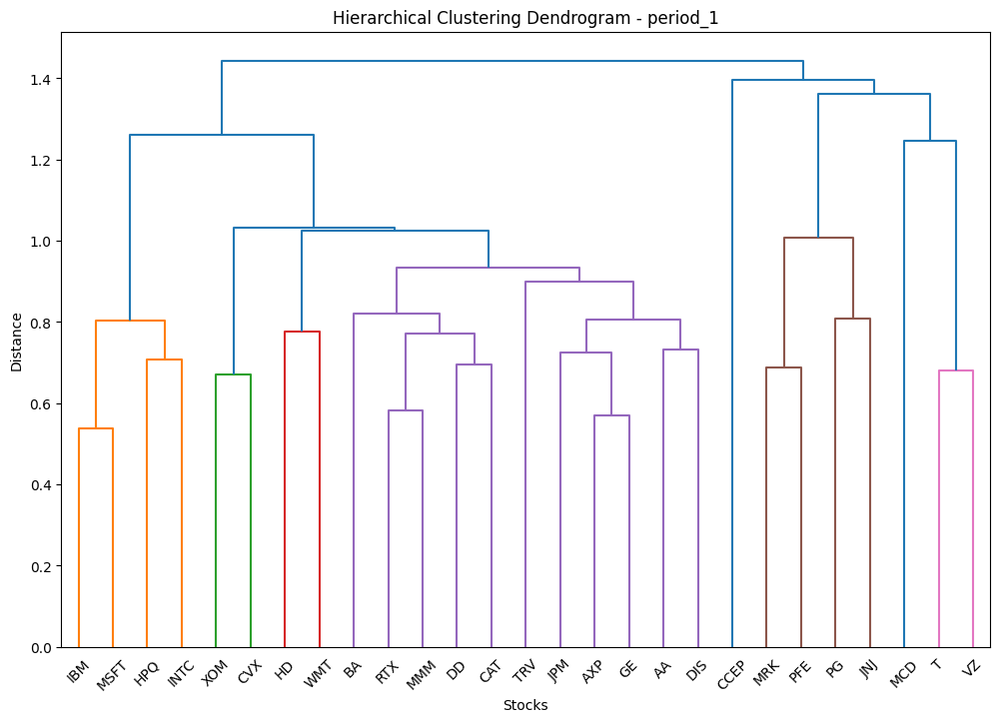

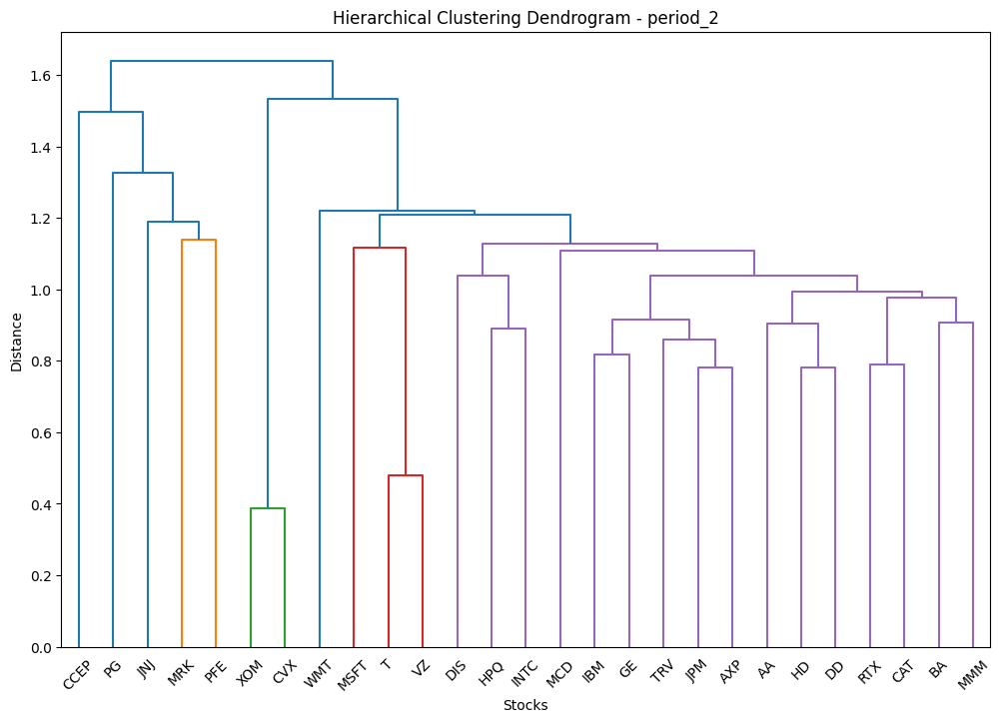

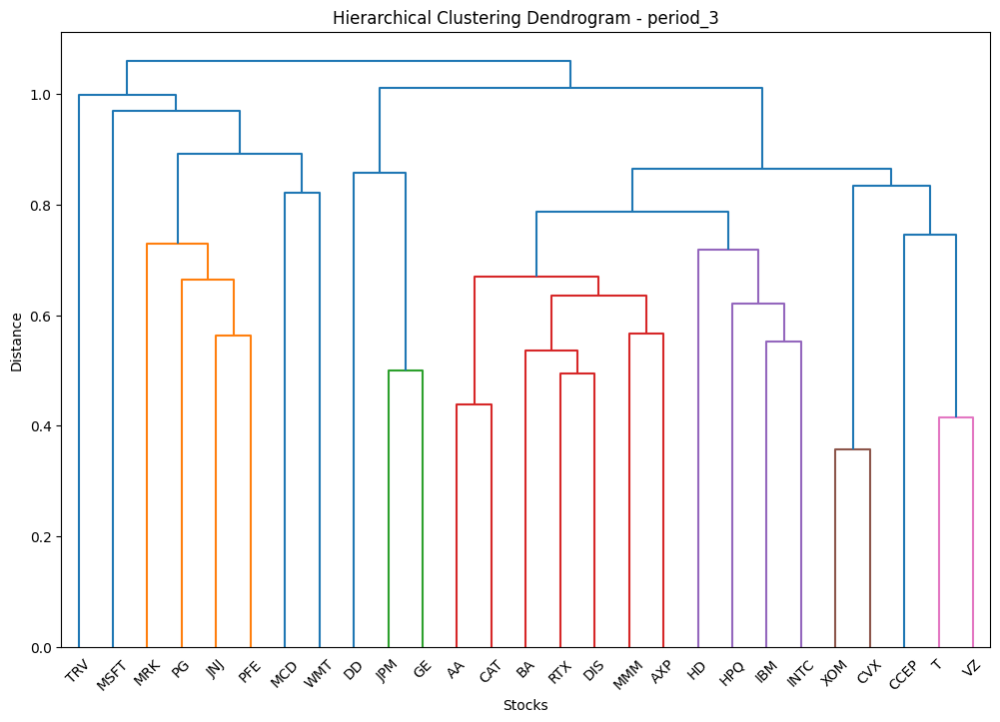

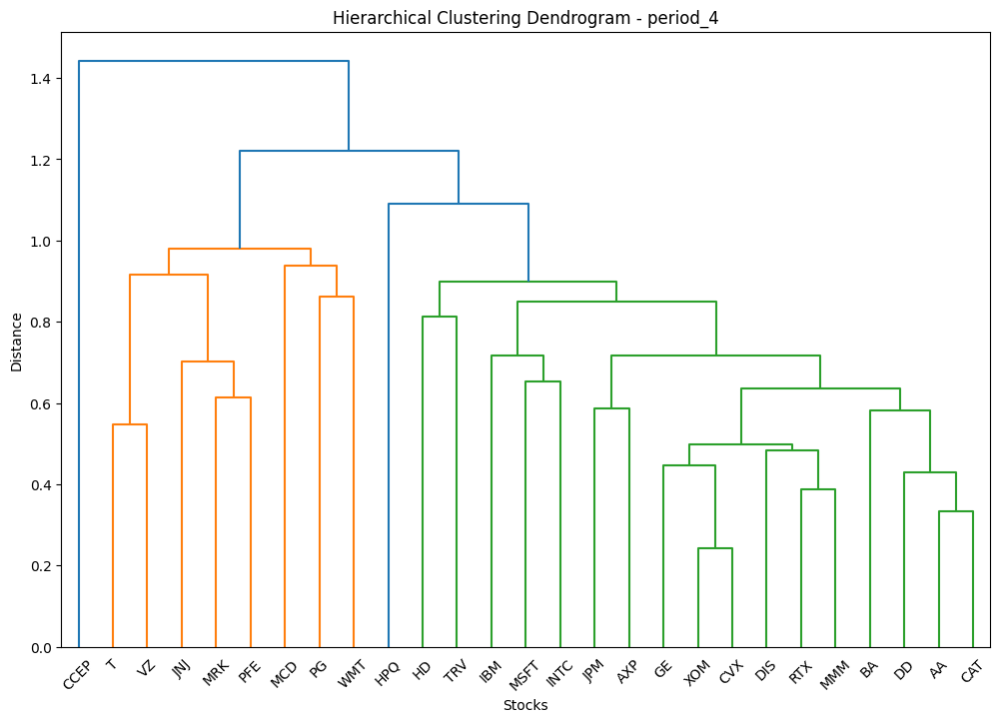

In [392]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [393]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [394]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.047354,0.036131,-0.106099,0.052155,"[MRK, RTX, T, GE, PG, RTX, VZ, MSFT, VZ, HD, P..."
period_1 (4 stocks),0.022038,0.030895,0.086057,0.276999,"[MRK, RTX, VZ, HPQ, PG, MMM, T, MSFT, JNJ, TRV..."
period_1 (8 stocks),0.016169,0.027656,0.061912,0.278828,"[JNJ, CVX, MCD, T, HPQ, AA, DD, CCEP, PFE, CVX..."
period_2 (2 stocks),0.270537,0.020986,1.354606,0.248589,"[XOM, MSFT, PFE, INTC, XOM, CAT, CCEP, HD, PFE..."
period_2 (4 stocks),0.329405,0.017031,1.993951,0.190286,"[JNJ, CVX, TRV, IBM, CCEP, CVX, HD, JPM, JNJ, ..."
period_2 (8 stocks),0.262441,0.013502,1.963042,0.169723,"[PG, JNJ, CVX, WMT, T, HPQ, TRV, CCEP, PG, PFE..."
period_3 (2 stocks),-0.017209,0.041011,-0.012999,0.447948,"[WMT, HD, PFE, DD, WMT, DD, CVX, CAT, JNJ, HD,..."
period_3 (4 stocks),-0.030496,0.040059,-0.081201,0.417564,"[MRK, CVX, AA, GE, PG, T, BA, GE, TRV, VZ, HD,..."
period_3 (8 stocks),0.007855,0.035313,0.021019,0.468766,"[PFE, CVX, MCD, VZ, CCEP, TRV, DIS, JPM, PFE, ..."
period_4 (2 stocks),0.454813,0.025152,1.918476,0.427137,"[MCD, XOM, MRK, INTC, CCEP, INTC, JNJ, DD, PFE..."


In [395]:
############# KMEANS ##############

In [396]:
from sklearn.cluster import KMeans
import numpy as np

In [397]:
periods = ['period_1','period_2','period_3','period_4']

In [398]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [399]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [400]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.007184,0.035432,-0.002848,0.530433,"[PG, JPM, T, CVX, CCEP, HPQ, MRK, DD, VZ, INTC..."
period_1 (4 stocks),-0.050700,0.031792,-0.150358,0.300218,"[WMT, MRK, INTC, T, HD, PG, HPQ, VZ, AXP, PG, ..."
period_1 (8 stocks),0.019023,0.027974,0.070186,0.276875,"[CCEP, CAT, TRV, PFE, VZ, CVX, DIS, INTC, CCEP..."
period_2 (2 stocks),0.251343,0.020808,1.287788,0.149962,"[MCD, PFE, AA, PFE, GE, CVX, MMM, MRK, MCD, XO..."
period_2 (4 stocks),0.297223,0.017289,1.751309,0.198175,"[HD, DIS, JNJ, XOM, WMT, JPM, JNJ, XOM, DD, DI..."
period_2 (8 stocks),0.227430,0.014691,1.550373,0.131011,"[CVX, AXP, DIS, JNJ, AA, CCEP, T, PFE, CVX, JP..."
period_3 (2 stocks),0.000357,0.041268,0.035096,0.382906,"[VZ, INTC, MSFT, AA, JNJ, IBM, MRK, BA, TRV, I..."
period_3 (4 stocks),0.002224,0.041900,0.003123,0.430926,"[IBM, DD, JNJ, JPM, INTC, BA, MCD, HD, CCEP, M..."
period_3 (8 stocks),0.028334,0.035022,0.078358,0.476112,"[CVX, CAT, WMT, GE, TRV, MSFT, T, MRK, CVX, BA..."
period_4 (2 stocks),0.474930,0.025478,1.945935,0.491084,"[INTC, MCD, RTX, MRK, MMM, WMT, CVX, T, CVX, T..."


In [401]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [402]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [403]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.213123,0.030766,-0.692727,0.263464,"[MRK, WMT]"
period_1 (4 stocks),-0.237369,0.034886,-0.680416,0.335060,"[GE, MRK, HPQ, MCD]"
period_1 (8 stocks),-0.127111,0.029460,-0.431468,0.337608,"[CCEP, WMT, GE, MRK, T, XOM, DIS, HPQ]"
period_2 (2 stocks),0.007040,0.023190,0.030360,0.185491,"[TRV, PFE]"
period_2 (4 stocks),0.241190,0.018755,1.286037,0.238319,"[HD, TRV, PFE, XOM]"
period_2 (8 stocks),0.350174,0.015914,2.200432,0.204041,"[XOM, BA, TRV, JNJ, CAT, CCEP, VZ, PFE]"
period_3 (2 stocks),-0.088398,0.042592,-0.207543,0.564727,"[PFE, CCEP]"
period_3 (4 stocks),-0.090505,0.040696,-0.222389,0.561937,"[CCEP, DIS, PFE, HD]"
period_3 (8 stocks),0.048820,0.035453,0.137704,0.502550,"[CVX, DIS, MCD, HD, TRV, INTC, CCEP, PFE]"
period_4 (2 stocks),0.991680,0.025792,3.844910,0.547225,"[DIS, TRV]"


In [404]:
############# MST ##############

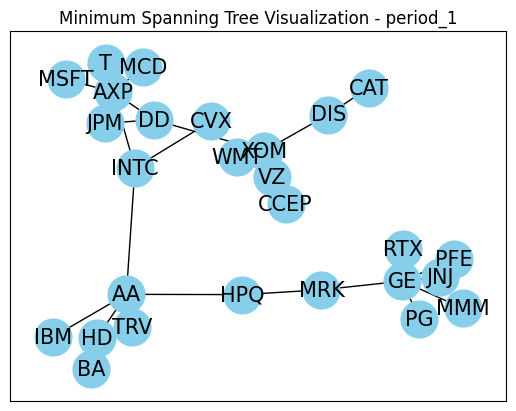

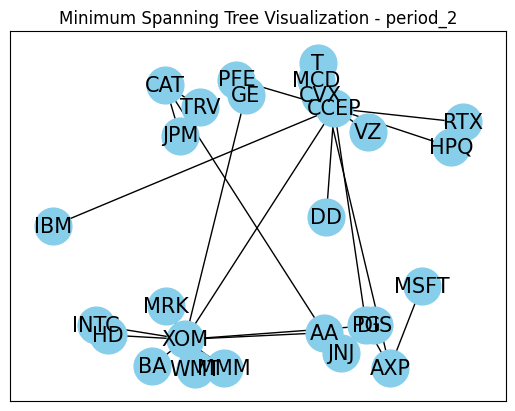

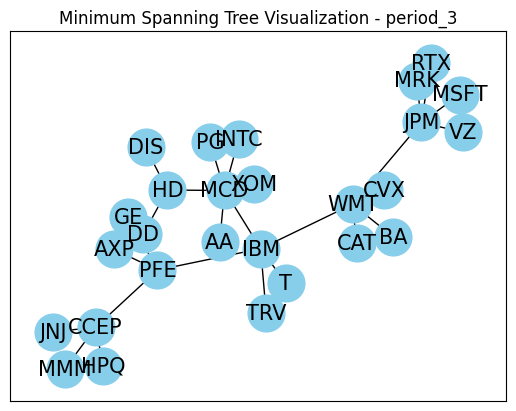

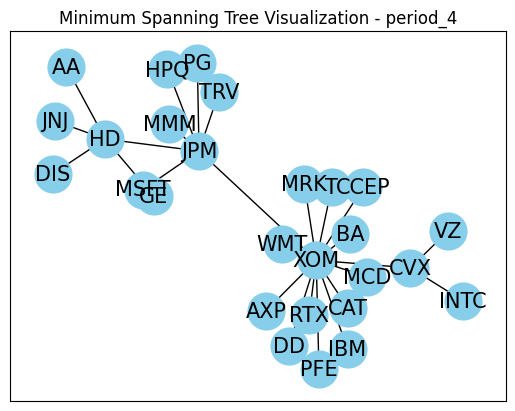

In [405]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree

for period in ['period_1', 'period_2', 'period_3', 'period_4']:
    distance_matrix = correlation_matrices[period]
    tickers = sorted(set([index[0] for index in distance_matrix]))
    labels = {i: ticker for i, ticker in enumerate(tickers)}

    # Convert the distance matrix to a sparse matrix
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Draw the graph
    pos = nx.spring_layout(G)  # positions for all nodes
    nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
    nx.draw_networkx_edges(G, pos, edge_color='k')
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
    plt.title(f"Minimum Spanning Tree Visualization - {period}")
    plt.show()


/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


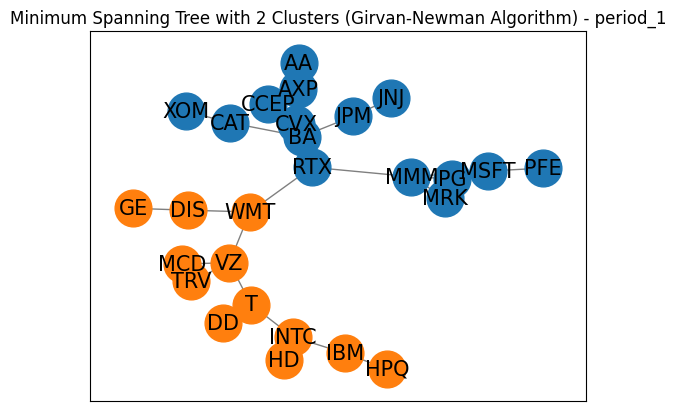

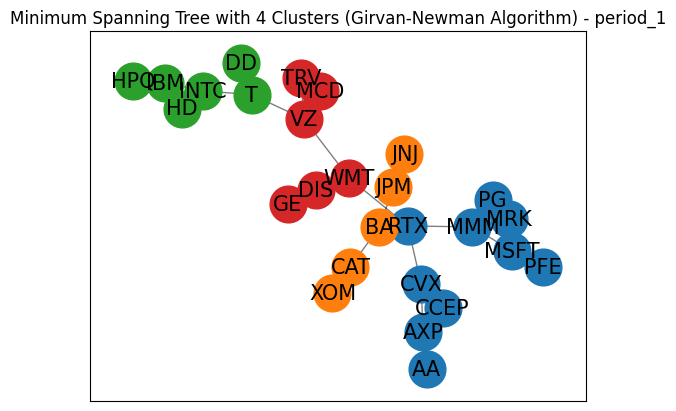

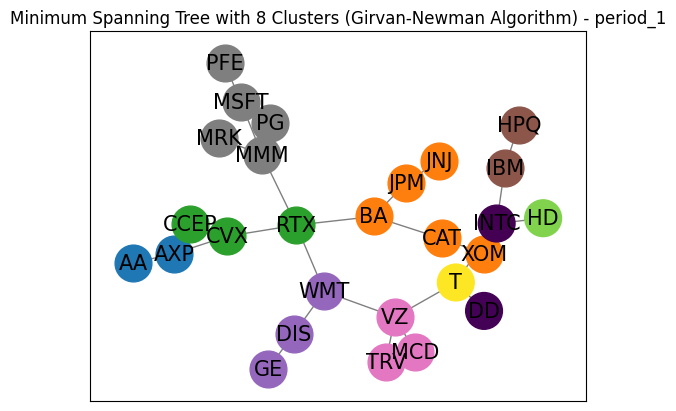

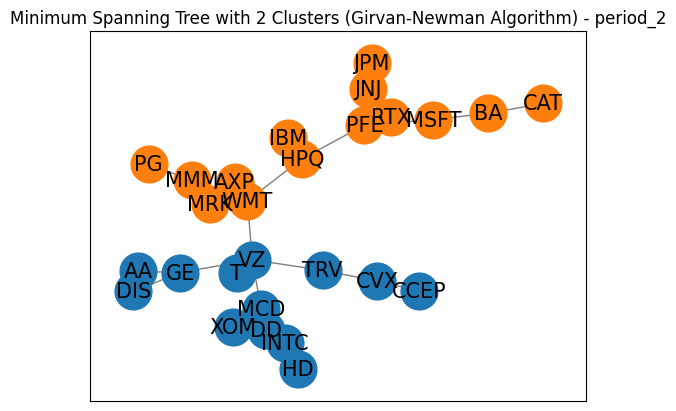

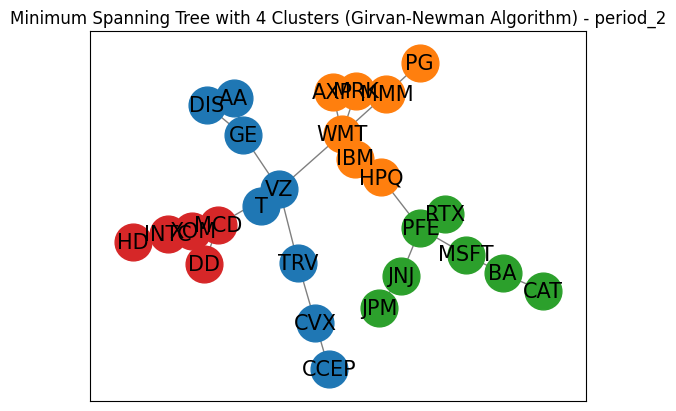

...

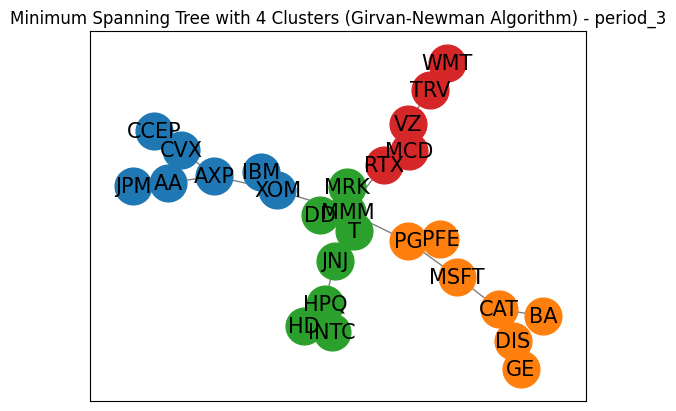

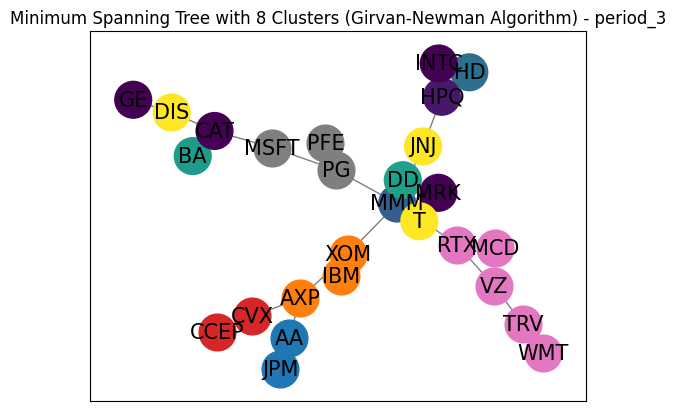

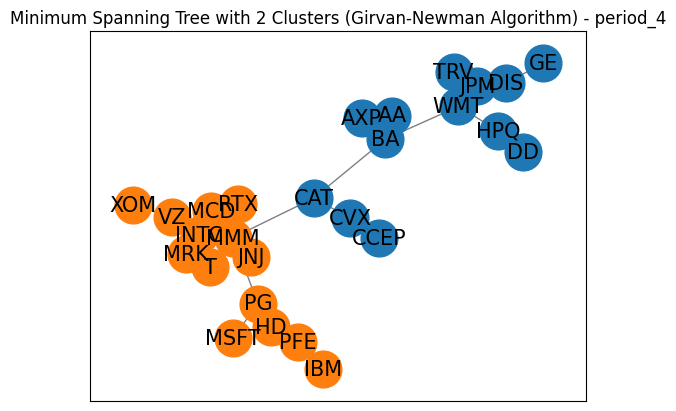

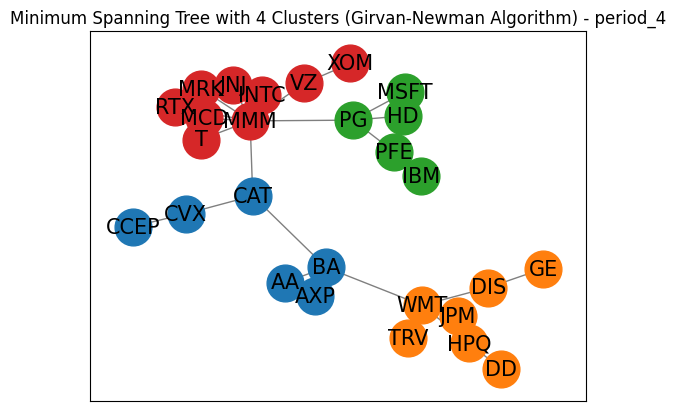

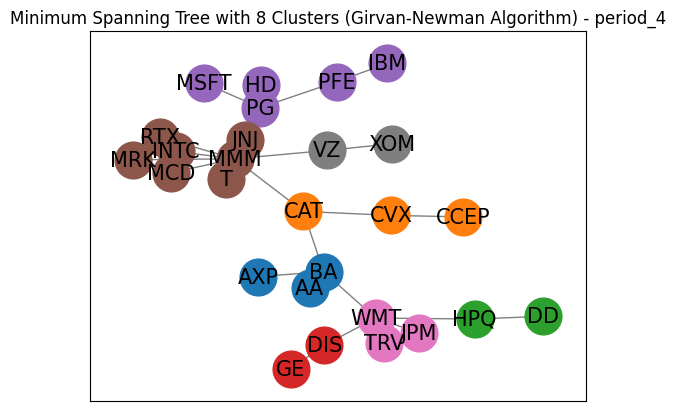

In [406]:
# ADD MST clustering here
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks
        
# Convert new correlation matrices to distance matrices using ultrametric function
distance_matrices = {}
for period, correlation_matrix in correlation_matrices.items():
    distance_matrices[period] = ultrametric(correlation_matrix)

mst_all_cluster_stocks = {}
tickers = sorted(set(index[0] for index in distance_matrix))
labels = {i: ticker for i, ticker in enumerate(tickers)}
for period, distance_matrix in distance_matrices.items():
    mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period)

In [407]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster
    return results_by_period



mst_results_by_period = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
dfs = []
for period, results_by_cluster in mst_results_by_period.items():
    for num_clusters, metrics in results_by_cluster.items():
        # Flatten or stringify the complex 'Stocks' list for display
        # metrics_for_df = {key: (', '.join(map(str, val)) if isinstance(val, list) else val) for key, val in metrics.items()}
        # metrics_for_df["Stocks"] = metrics_for_df["Stocks"].replace("'","")
        # metrics_for_df["Stocks"] = metrics_for_df["Stocks"].replace('], [',', ')
        # metrics_for_df["Stocks"] = metrics_for_df["Stocks"].replace(']','')
        # metrics_for_df["Stocks"] = metrics_for_df["Stocks"].replace('[','')
        df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
        dfs.append(df)

mst_result_df_clusters = pd.concat(dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.004906,0.038116,0.017309,0.341793,"[PG, TRV, MMM, MCD, CAT, TRV, MSFT, HD, BA, IB..."
period_1 (4 stocks),0.018771,0.034091,0.054784,0.372232,"[AA, JNJ, HPQ, TRV, AXP, JPM, HPQ, TRV, MMM, J..."
period_1 (8 stocks),0.025549,0.031795,0.081387,0.374691,"[AXP, JPM, RTX, INTC, GE, IBM, TRV, PFE, AA, C..."
period_2 (2 stocks),0.248205,0.021740,1.214488,0.240083,"[XOM, IBM, XOM, RTX, DIS, IBM, T, BA, T, CAT, ..."
period_2 (4 stocks),0.226854,0.018752,1.247035,0.270067,"[VZ, MMM, MSFT, HD, VZ, WMT, PFE, XOM, AA, HPQ..."
period_2 (8 stocks),0.291765,0.015878,1.850116,0.236126,"[GE, MMM, CAT, CVX, HD, IBM, JPM, T, DIS, MRK,..."
period_3 (2 stocks),-0.066288,0.043361,-0.135341,0.510475,"[JPM, MSFT, JNJ, GE, INTC, GE, T, MSFT, VZ, PG..."
period_3 (4 stocks),0.005690,0.039609,0.025305,0.493181,"[CVX, DIS, MRK, TRV, CCEP, DIS, MMM, MCD, XOM,..."
period_3 (8 stocks),0.019571,0.039887,0.055942,0.508648,"[JPM, XOM, CAT, CCEP, MMM, INTC, WMT, PFE, JPM..."
period_4 (2 stocks),0.381298,0.027937,1.481979,0.486396,"[AA, JNJ, AXP, HD, DIS, XOM, GE, RTX, DD, MMM,..."


In [408]:
############# Plots and Diagrams ##############

In [409]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        print(type(group["Stocks"]))
        print(group["Stocks"])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        print(ticker_counts)
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

<class 'pandas.core.series.Series'>
period_1 (2 stocks)    [WMT, MMM, INTC, CAT, IBM, MSFT, TRV, GE, CAT,...
Name: Stocks, dtype: object
JNJ     12
INTC    10
MSFT    10
PG      10
MMM     10
HPQ      9
IBM      9
VZ       9
GE       9
AA       8
MRK      8
WMT      8
T        8
RTX      7
MCD      7
TRV      7
CCEP     7
PFE      7
AXP      6
HD       6
BA       6
JPM      5
DD       5
CVX      5
CAT      5
XOM      4
DIS      3
Name: count, dtype: int64


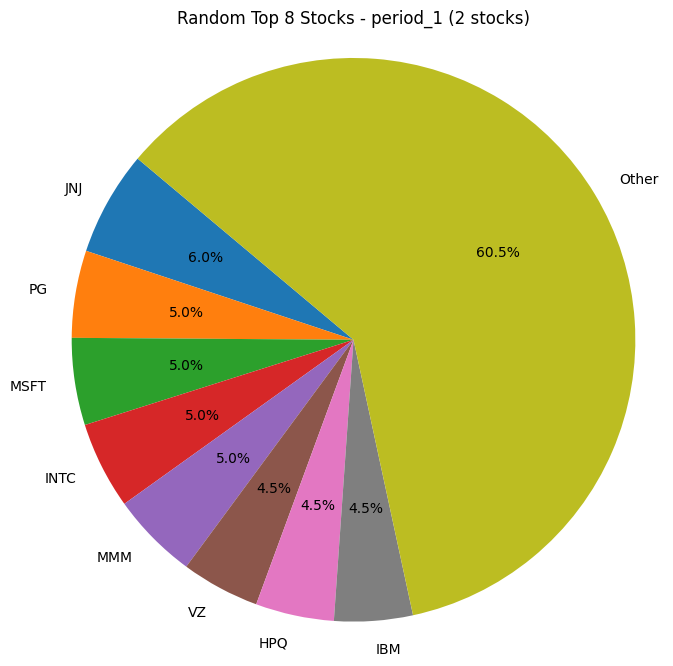

<class 'pandas.core.series.Series'>
period_1 (4 stocks)    [XOM, PG, AXP, MSFT, DD, IBM, PG, BA, HD, IBM,...
Name: Stocks, dtype: object
INTC    26
MCD     20
JNJ     19
PG      18
CCEP    17
RTX     17
GE      17
CAT     16
WMT     16
MMM     16
HPQ     15
HD      15
BA      15
PFE     14
DIS     14
XOM     14
TRV     13
MSFT    13
T       13
VZ      13
DD      13
CVX     12
MRK     12
JPM     12
AA      10
AXP     10
IBM     10
Name: count, dtype: int64


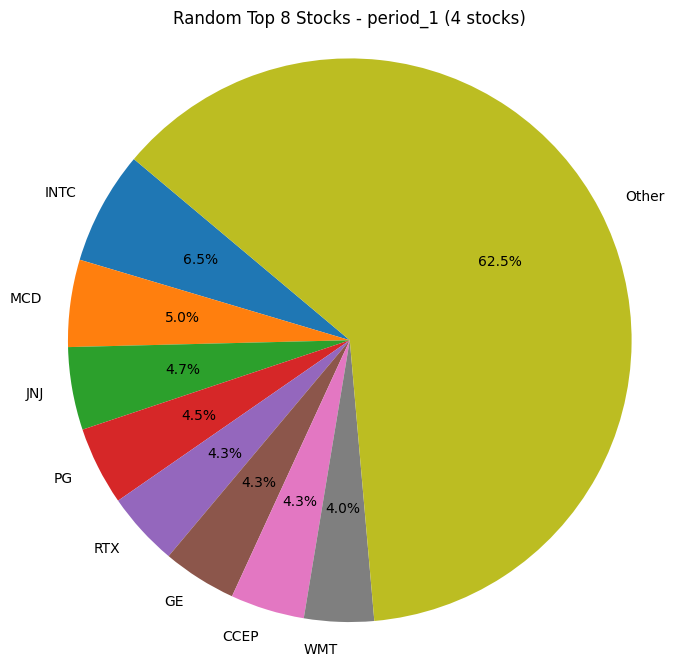

<class 'pandas.core.series.Series'>
period_1 (8 stocks)    [MRK, DD, MCD, PG, HPQ, DIS, JNJ, AXP, DIS, VZ...
Name: Stocks, dtype: object
CCEP    43
JNJ     36
RTX     35
AXP     35
TRV     34
MMM     34
CVX     33
INTC    32
MRK     32
MCD     32
DIS     32
CAT     31
GE      31
MSFT    30
PG      29
VZ      29
HPQ     28
AA      26
T       26
PFE     26
BA      25
XOM     25
JPM     25
DD      24
HD      24
IBM     22
WMT     21
Name: count, dtype: int64


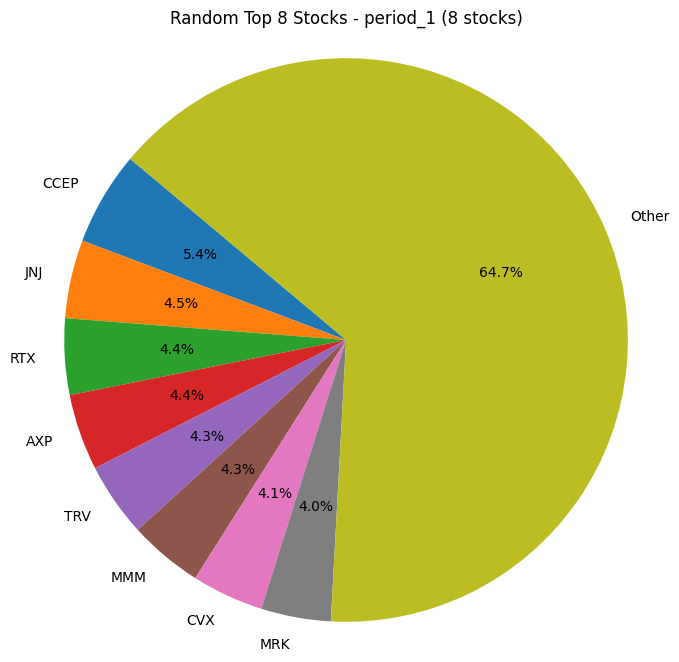

<class 'pandas.core.series.Series'>
period_2 (2 stocks)    [JPM, INTC, BA, XOM, JNJ, MMM, HD, MSFT, DD, J...
Name: Stocks, dtype: object
MMM     17
JPM     11
HD      11
AXP     11
INTC    11
JNJ     11
CCEP    10
PFE      9
XOM      9
TRV      8
RTX      8
CVX      8
VZ       7
T        7
DIS      7
MSFT     6
MCD      6
CAT      6
MRK      5
HPQ      5
GE       5
WMT      4
IBM      4
AA       4
DD       4
BA       4
PG       2
Name: count, dtype: int64


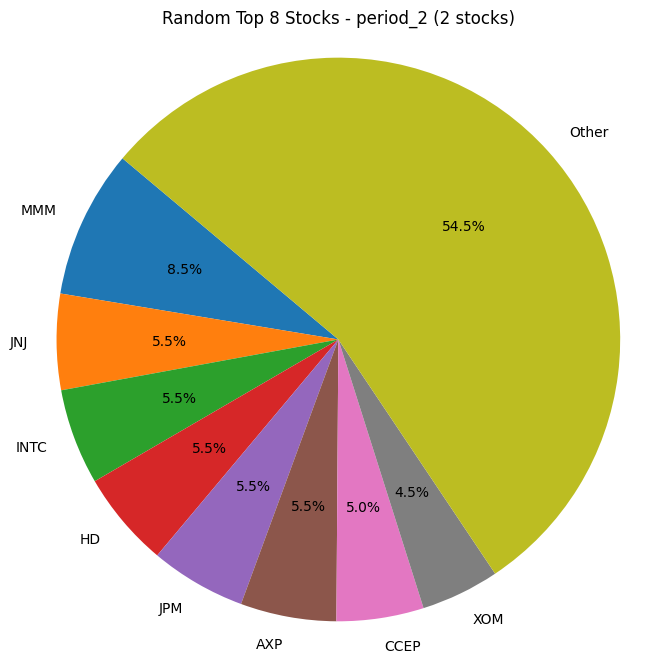

<class 'pandas.core.series.Series'>
period_2 (4 stocks)    [HD, CAT, JNJ, VZ, AA, VZ, HPQ, CAT, VZ, DIS, ...
Name: Stocks, dtype: object
VZ      25
DIS     22
HD      19
MSFT    19
T       18
CVX     17
MMM     17
CCEP    16
INTC    16
JPM     16
PFE     15
HPQ     15
DD      15
MCD     15
IBM     14
TRV     14
MRK     14
CAT     14
RTX     13
PG      12
XOM     12
AA      11
JNJ     11
GE      10
WMT     10
BA      10
AXP     10
Name: count, dtype: int64


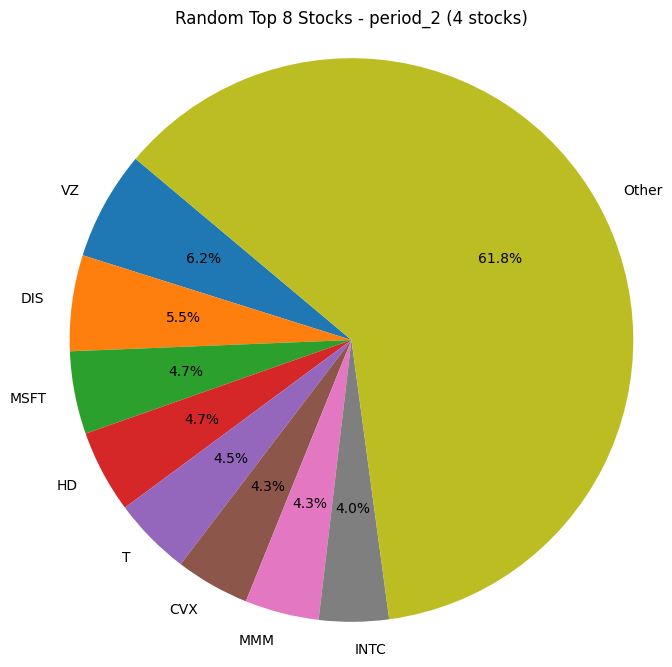

<class 'pandas.core.series.Series'>
period_2 (8 stocks)    [DIS, GE, PG, VZ, XOM, CAT, WMT, JPM, WMT, MRK...
Name: Stocks, dtype: object
DIS     43
CCEP    37
MMM     37
MSFT    35
T       34
HD      33
VZ      32
IBM     32
TRV     32
GE      31
XOM     31
BA      31
JNJ     30
CVX     30
CAT     30
INTC    29
AXP     29
MRK     28
HPQ     27
PFE     25
AA      25
JPM     24
MCD     24
RTX     24
DD      23
PG      22
WMT     22
Name: count, dtype: int64


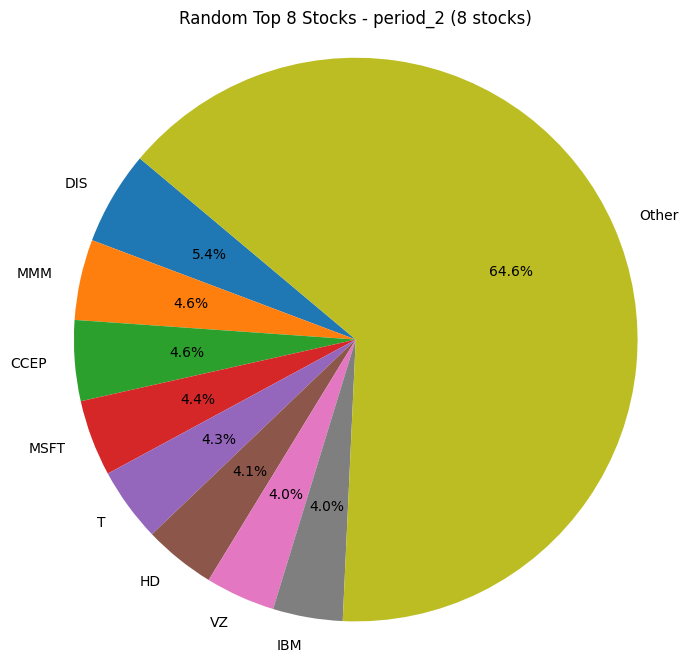

<class 'pandas.core.series.Series'>
period_3 (2 stocks)    [PFE, T, JPM, PG, JPM, WMT, PG, MSFT, AXP, JNJ...
Name: Stocks, dtype: object
GE      14
WMT     10
CCEP    10
IBM     10
DIS     10
AA       9
MSFT     9
XOM      9
JNJ      9
PG       8
DD       8
TRV      8
PFE      7
MMM      7
INTC     7
MRK      7
JPM      7
T        6
MCD      6
RTX      6
CAT      6
BA       5
HPQ      5
AXP      5
HD       4
VZ       4
CVX      4
Name: count, dtype: int64


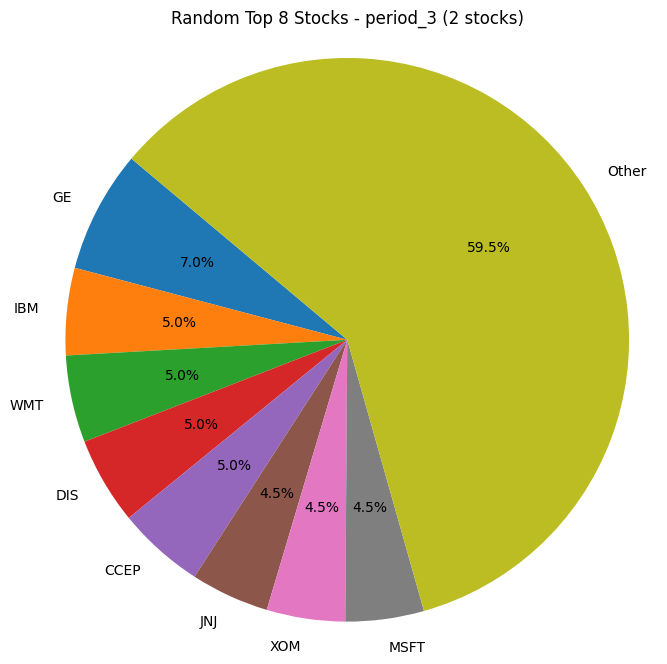

<class 'pandas.core.series.Series'>
period_3 (4 stocks)    [JPM, AXP, TRV, CVX, BA, MMM, XOM, T, JNJ, MRK...
Name: Stocks, dtype: object
AXP     22
CVX     22
CCEP    21
PG      19
DD      19
HPQ     18
MRK     18
VZ      17
XOM     17
PFE     16
RTX     15
CAT     15
AA      15
JPM     14
HD      14
TRV     14
MSFT    13
IBM     12
T       12
MMM     12
BA      12
MCD     12
DIS     12
WMT     11
INTC    11
JNJ      9
GE       8
Name: count, dtype: int64


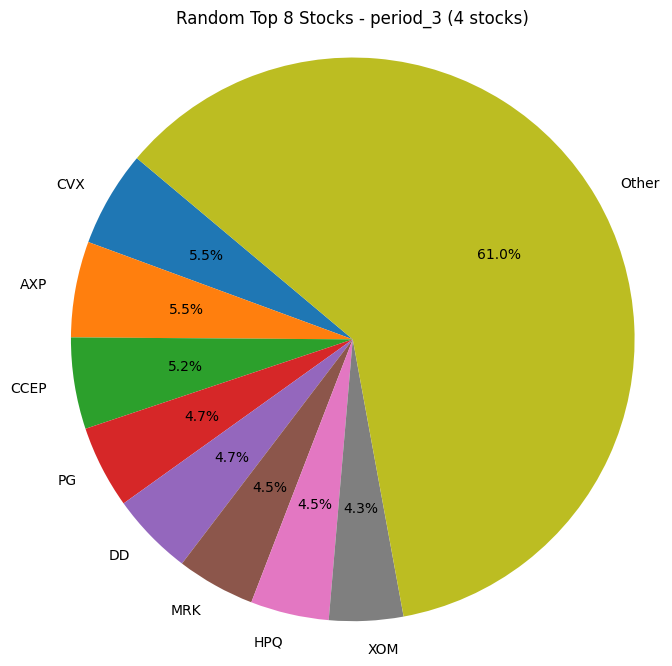

<class 'pandas.core.series.Series'>
period_3 (8 stocks)    [IBM, WMT, T, PFE, TRV, MCD, XOM, VZ, AA, MRK,...
Name: Stocks, dtype: object
HD      37
WMT     36
MMM     36
AA      35
RTX     34
VZ      32
IBM     32
TRV     32
MRK     31
PFE     31
JNJ     31
BA      31
MCD     29
PG      28
DIS     28
JPM     28
AXP     28
CVX     28
DD      27
CAT     27
XOM     26
T       26
INTC    26
HPQ     26
MSFT    26
CCEP    26
GE      23
Name: count, dtype: int64


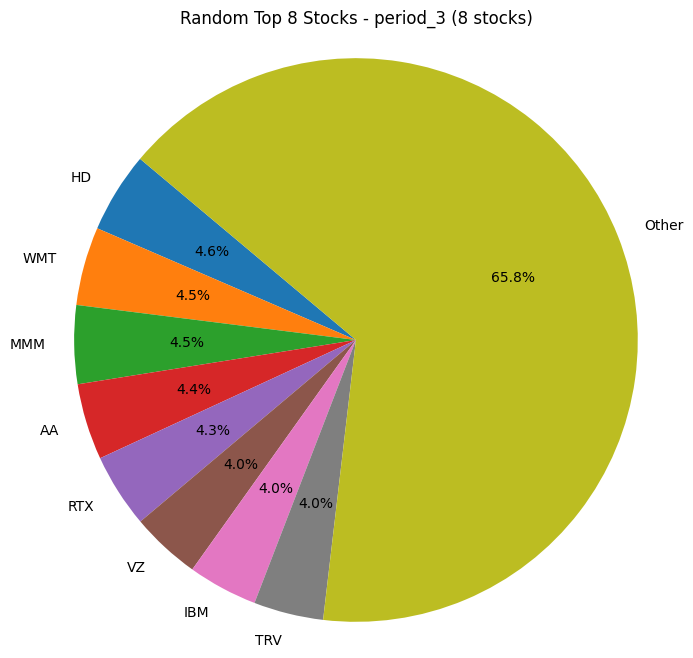

<class 'pandas.core.series.Series'>
period_4 (2 stocks)    [AA, MMM, PFE, IBM, IBM, WMT, DD, XOM, CAT, VZ...
Name: Stocks, dtype: object
BA      13
DD      12
INTC    11
PFE     10
MSFT     9
MCD      9
T        9
AXP      9
JPM      8
MRK      8
AA       8
XOM      8
IBM      8
CCEP     7
MMM      7
VZ       7
WMT      7
TRV      7
JNJ      6
CAT      6
CVX      6
DIS      5
RTX      5
GE       5
HPQ      4
PG       4
HD       2
Name: count, dtype: int64


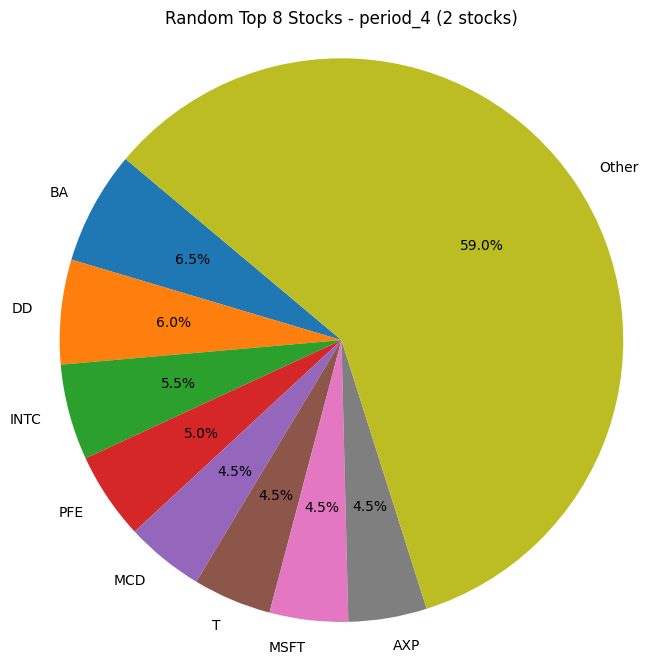

<class 'pandas.core.series.Series'>
period_4 (4 stocks)    [CAT, JNJ, GE, JPM, INTC, GE, IBM, DIS, DIS, C...
Name: Stocks, dtype: object
GE      25
JPM     25
DD      23
TRV     21
VZ      20
T       19
MCD     17
MMM     17
MSFT    16
WMT     15
DIS     15
HPQ     15
AXP     14
CAT     14
JNJ     14
PFE     14
RTX     14
HD      13
MRK     12
CVX     12
IBM     12
INTC    11
PG       9
XOM      9
CCEP     9
BA       9
AA       6
Name: count, dtype: int64


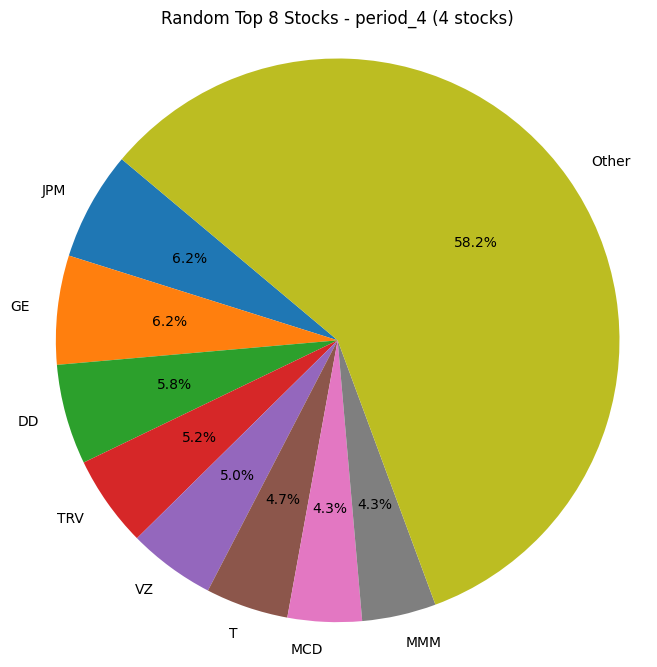

<class 'pandas.core.series.Series'>
period_4 (8 stocks)    [TRV, T, CVX, JPM, RTX, BA, WMT, MRK, JNJ, MCD...
Name: Stocks, dtype: object
BA      37
XOM     36
CAT     34
INTC    33
JPM     33
CVX     32
IBM     32
GE      31
HPQ     31
T       31
MMM     31
CCEP    31
RTX     31
JNJ     30
DIS     30
MSFT    30
VZ      30
AA      29
WMT     28
PFE     27
TRV     27
MCD     26
HD      26
AXP     25
MRK     24
PG      23
DD      22
Name: count, dtype: int64


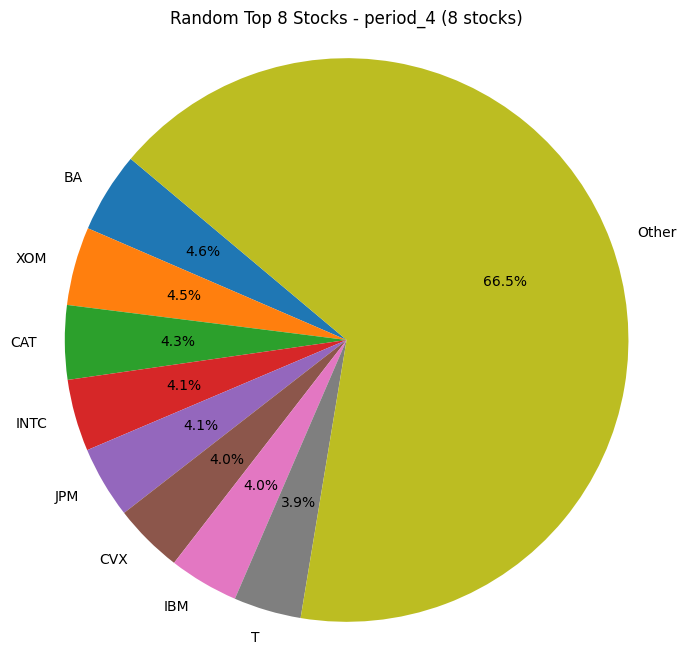

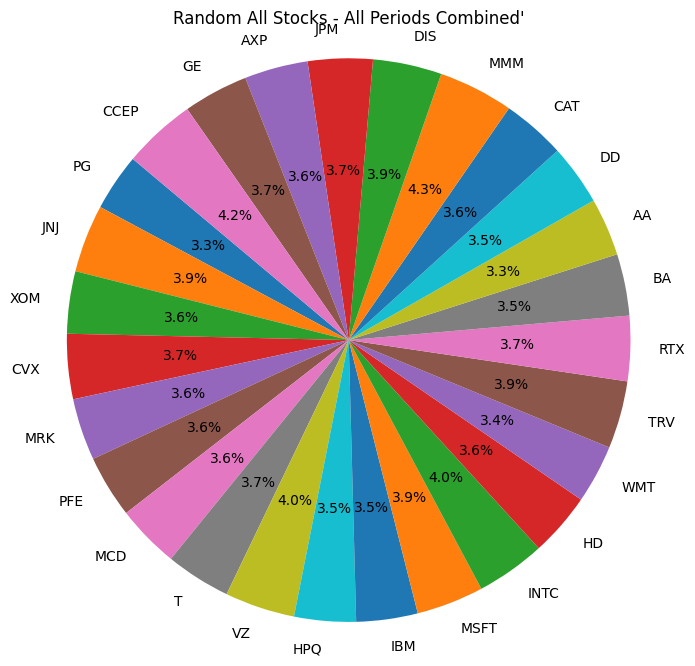

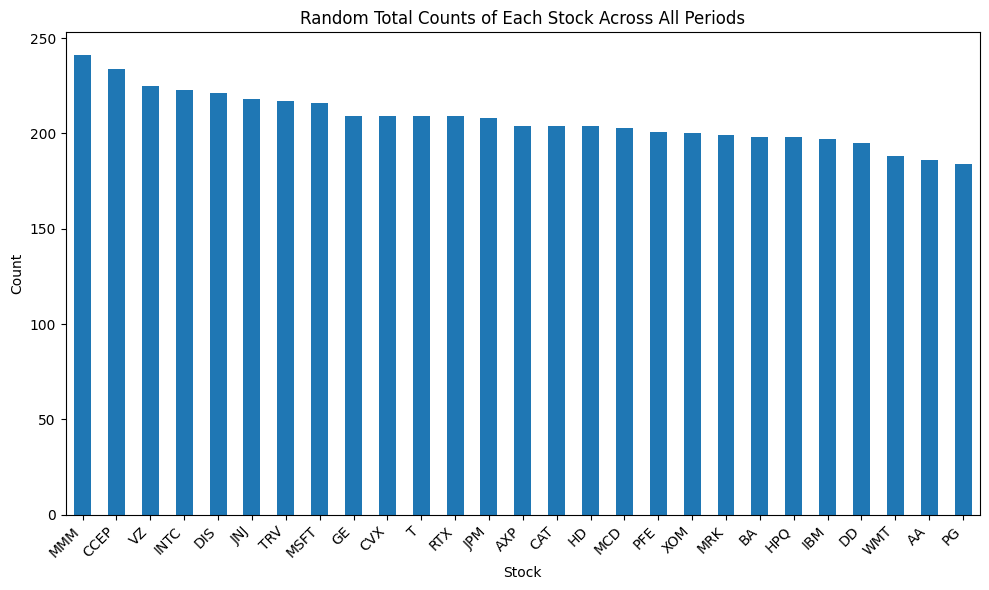

In [410]:
count_of_stocks(result_df_random,custom_tickers, "Random")

<class 'pandas.core.series.Series'>
period_1 (2 stocks)    [MRK, RTX, T, GE, PG, RTX, VZ, MSFT, VZ, HD, P...
Name: Stocks, dtype: object
MCD     18
T       16
MRK     14
PG      13
HD      12
VZ      11
PFE     10
CCEP    10
DD       8
JNJ      8
RTX      8
AXP      7
INTC     6
JPM      6
CVX      6
DIS      6
GE       6
IBM      6
AA       4
MMM      4
HPQ      4
TRV      3
WMT      3
MSFT     3
CAT      3
XOM      3
BA       2
Name: count, dtype: int64


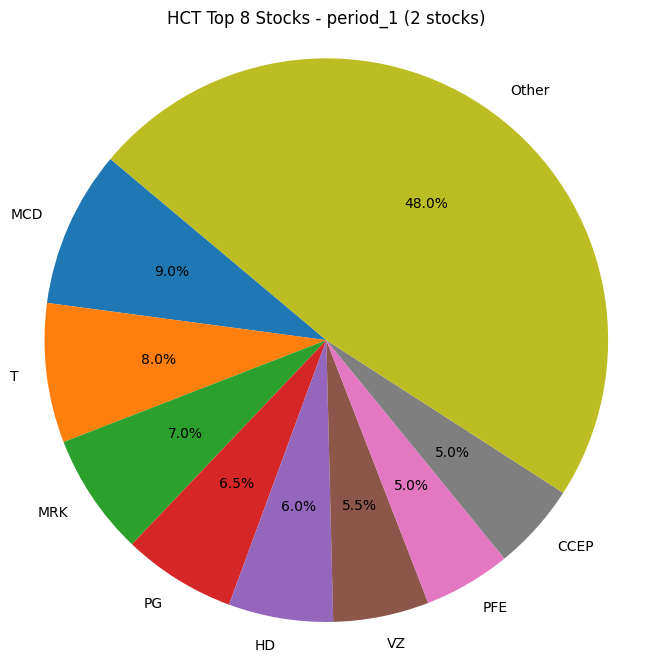

<class 'pandas.core.series.Series'>
period_1 (4 stocks)    [MRK, RTX, VZ, HPQ, PG, MMM, T, MSFT, JNJ, TRV...
Name: Stocks, dtype: object
IBM     34
JNJ     31
PG      30
VZ      29
CCEP    28
HPQ     27
MCD     23
MRK     23
MSFT    20
T       20
INTC    19
PFE     16
MMM     10
TRV      8
BA       8
DD       8
JPM      8
XOM      7
HD       7
RTX      7
WMT      7
CAT      6
DIS      5
CVX      5
AA       5
AXP      5
GE       4
Name: count, dtype: int64


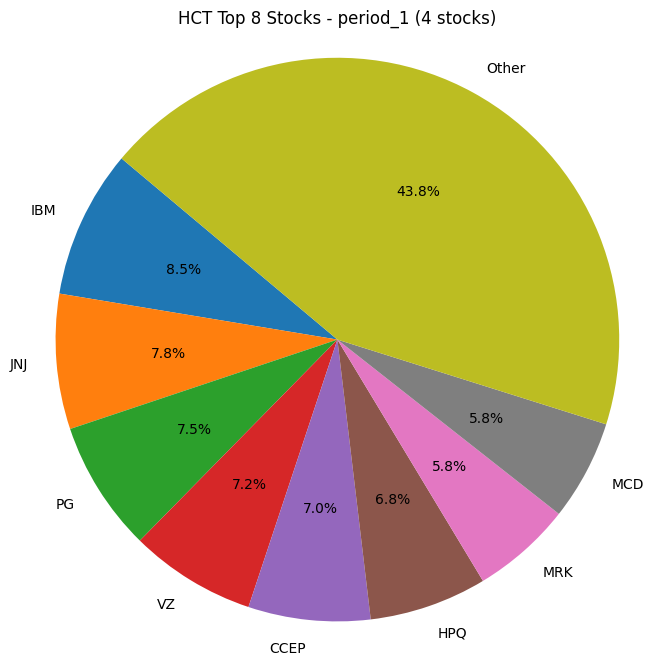

<class 'pandas.core.series.Series'>
period_1 (8 stocks)    [JNJ, CVX, MCD, T, HPQ, AA, DD, CCEP, PFE, CVX...
Name: Stocks, dtype: object
MCD     100
CCEP    100
T        58
VZ       42
MRK      30
CVX      29
INTC     28
DD       26
PFE      26
JNJ      25
IBM      25
MSFT     25
HD       24
WMT      24
CAT      23
XOM      23
GE       22
HPQ      22
RTX      21
PG       19
TRV      18
AA       18
BA       17
JPM      15
AXP      14
MMM      13
DIS      13
Name: count, dtype: int64


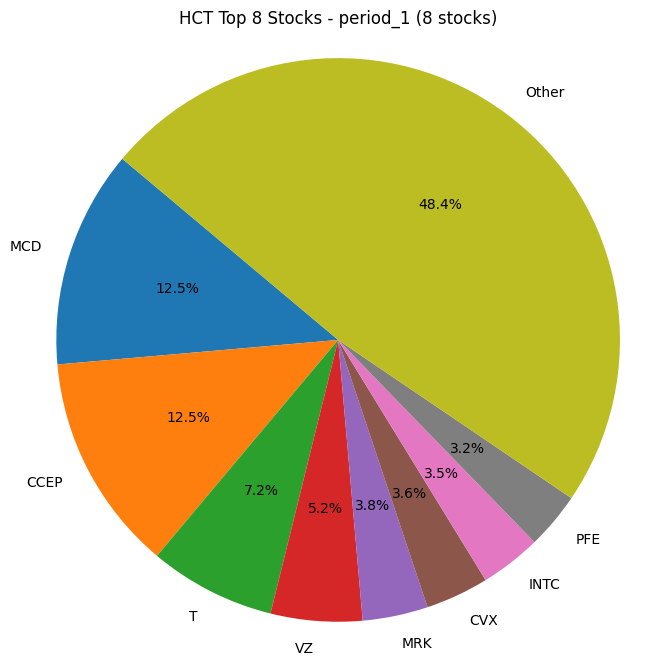

<class 'pandas.core.series.Series'>
period_2 (2 stocks)    [XOM, MSFT, PFE, INTC, XOM, CAT, CCEP, HD, PFE...
Name: Stocks, dtype: object
XOM     20
JNJ     17
PG      15
PFE     14
MRK     12
CVX     12
CCEP    10
RTX      9
T        8
DD       7
AA       7
MSFT     7
DIS      7
INTC     6
BA       6
TRV      6
IBM      5
MCD      5
WMT      5
HD       5
AXP      3
CAT      3
JPM      3
GE       2
HPQ      2
MMM      2
VZ       2
Name: count, dtype: int64


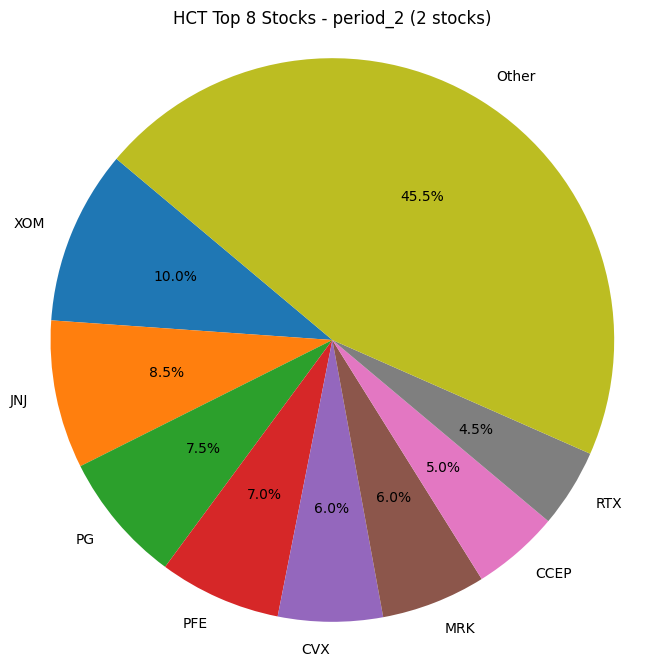

<class 'pandas.core.series.Series'>
period_2 (4 stocks)    [JNJ, CVX, TRV, IBM, CCEP, CVX, HD, JPM, JNJ, ...
Name: Stocks, dtype: object
CVX     55
XOM     45
PG      25
CCEP    22
MRK     21
JNJ     18
AA      18
VZ      15
PFE     14
HPQ     13
JPM     13
INTC    12
AXP     11
T       11
RTX     10
MCD     10
GE      10
WMT     10
TRV      9
CAT      9
DIS      9
HD       8
MSFT     8
IBM      7
BA       7
MMM      6
DD       4
Name: count, dtype: int64


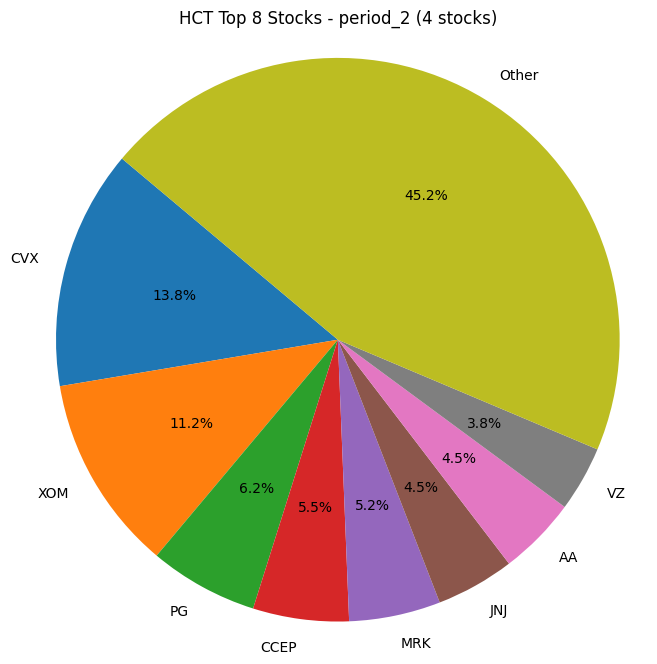

<class 'pandas.core.series.Series'>
period_2 (8 stocks)    [PG, JNJ, CVX, WMT, T, HPQ, TRV, CCEP, PG, PFE...
Name: Stocks, dtype: object
PG      100
CCEP    100
T        62
XOM      55
CVX      45
WMT      43
VZ       38
PFE      37
JNJ      34
MRK      29
DIS      29
MCD      28
MSFT     21
TRV      20
GE       18
CAT      16
JPM      15
INTC     14
HD       13
RTX      12
IBM      11
HPQ      11
MMM      11
AXP      10
BA       10
AA        9
DD        9
Name: count, dtype: int64


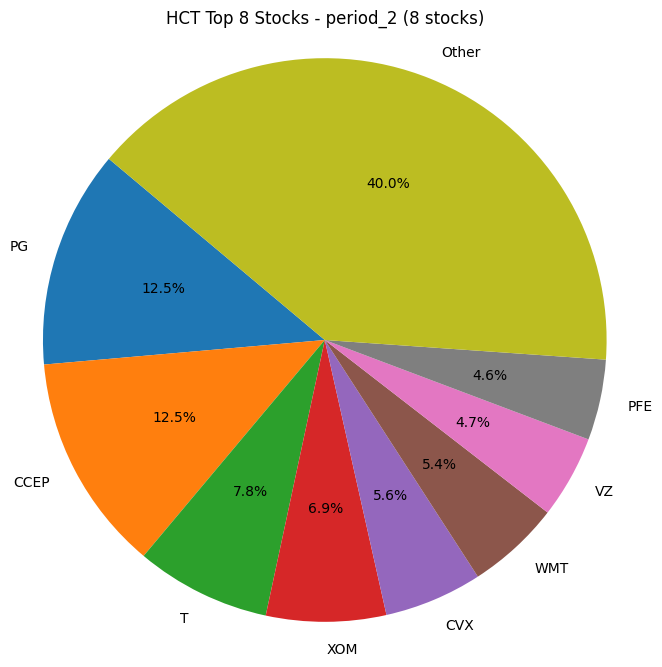

<class 'pandas.core.series.Series'>
period_3 (2 stocks)    [WMT, HD, PFE, DD, WMT, DD, CVX, CAT, JNJ, HD,...
Name: Stocks, dtype: object
MSFT    13
GE      12
IBM     12
RTX     12
JNJ     12
T       12
XOM     11
MMM     10
PG       9
PFE      9
MRK      8
DD       8
JPM      8
CAT      7
TRV      7
WMT      7
INTC     6
CCEP     6
MCD      5
AA       5
VZ       5
BA       4
HPQ      3
AXP      3
HD       2
CVX      2
DIS      2
Name: count, dtype: int64


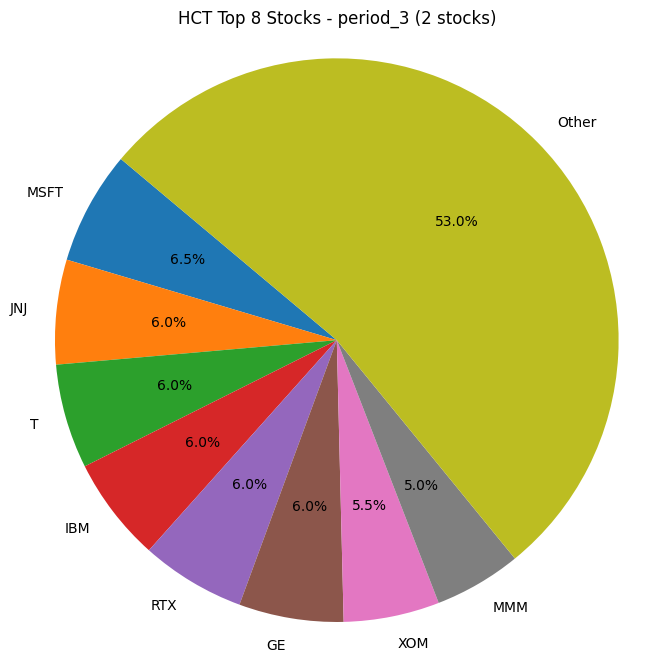

<class 'pandas.core.series.Series'>
period_3 (4 stocks)    [MRK, CVX, AA, GE, PG, T, BA, GE, TRV, VZ, HD,...
Name: Stocks, dtype: object
DD      41
JPM     30
GE      29
VZ      29
T       26
CVX     23
PFE     22
XOM     22
JNJ     17
RTX     15
MRK     12
MSFT    11
TRV     11
INTC    11
IBM     10
HD      10
AXP     10
MCD     10
CCEP    10
WMT      9
HPQ      8
PG       8
CAT      7
DIS      6
BA       5
AA       4
MMM      4
Name: count, dtype: int64


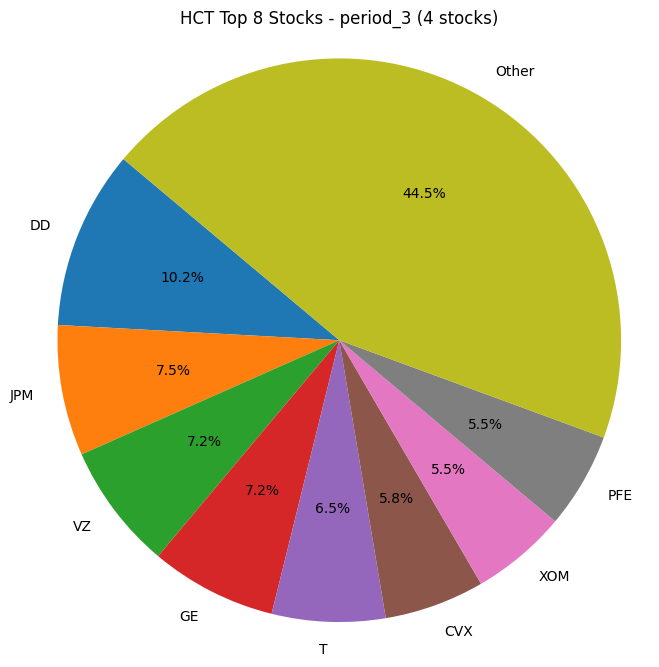

<class 'pandas.core.series.Series'>
period_3 (8 stocks)    [PFE, CVX, MCD, VZ, CCEP, TRV, DIS, JPM, PFE, ...
Name: Stocks, dtype: object
TRV     100
XOM      55
T        51
VZ       49
CVX      45
MSFT     35
DD       34
GE       33
JPM      33
WMT      33
MCD      32
PFE      30
HD       25
JNJ      24
PG       23
CCEP     23
MRK      23
INTC     21
MMM      20
IBM      18
AA       18
BA       15
CAT      15
HPQ      13
DIS      12
RTX      10
AXP      10
Name: count, dtype: int64


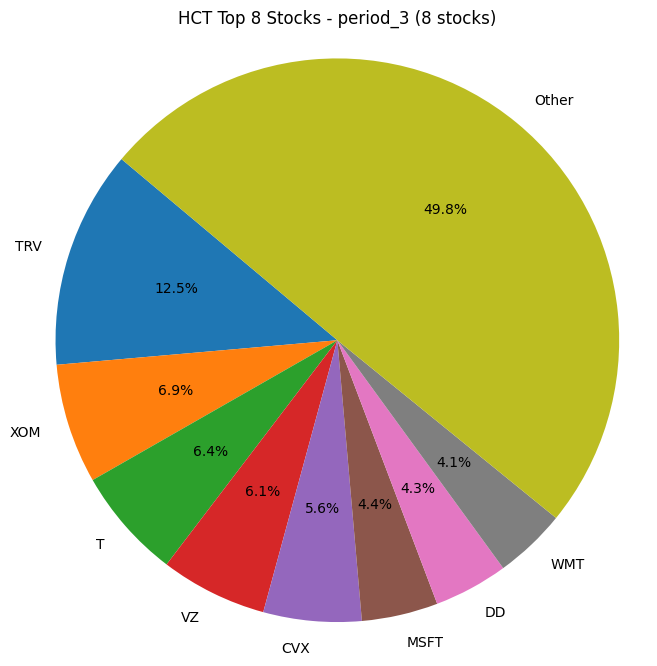

<class 'pandas.core.series.Series'>
period_4 (2 stocks)    [MCD, XOM, MRK, INTC, CCEP, INTC, JNJ, DD, PFE...
Name: Stocks, dtype: object
WMT     17
INTC    12
CCEP    12
PFE     12
MCD     11
MRK     10
VZ      10
PG      10
T       10
TRV      8
JNJ      8
AXP      7
GE       7
DD       7
AA       7
CAT      7
RTX      6
MMM      5
HPQ      5
HD       5
DIS      4
MSFT     4
XOM      4
BA       4
IBM      3
CVX      3
JPM      2
Name: count, dtype: int64


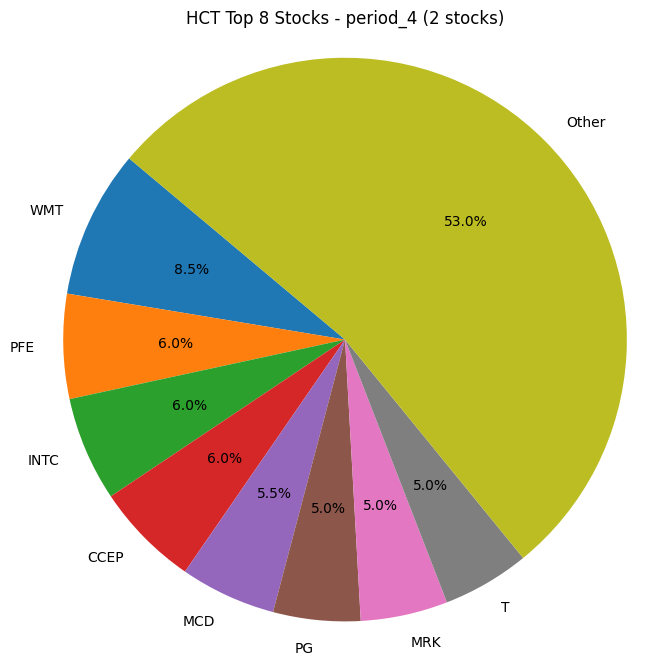

<class 'pandas.core.series.Series'>
period_4 (4 stocks)    [PG, MMM, HPQ, CCEP, PG, CVX, HD, CCEP, JNJ, A...
Name: Stocks, dtype: object
CCEP    100
HPQ      17
MSFT     17
JNJ      17
WMT      17
IBM      15
T        14
BA       13
XOM      13
HD       13
MCD      12
CAT      11
TRV      11
CVX      11
JPM      11
PG       10
DIS      10
VZ       10
MRK      10
PFE      10
DD        9
INTC      9
MMM       9
RTX       8
GE        8
AA        8
AXP       7
Name: count, dtype: int64


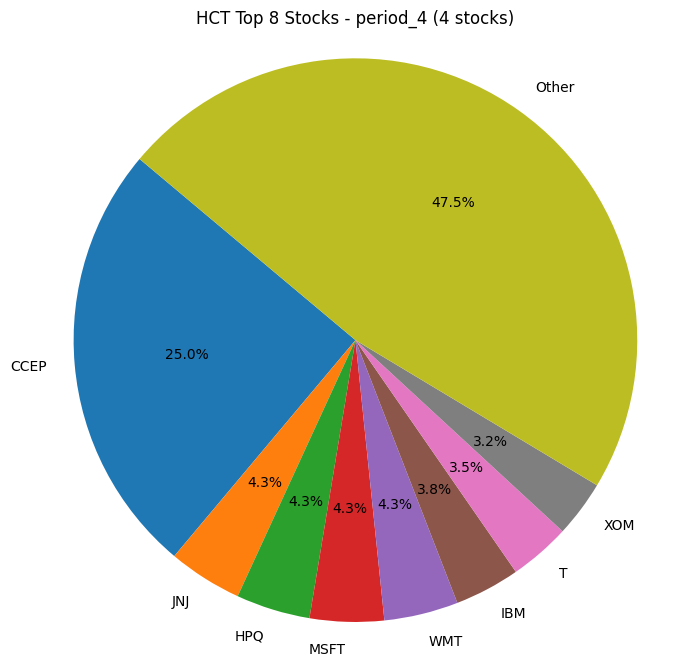

<class 'pandas.core.series.Series'>
period_4 (8 stocks)    [PG, PFE, MMM, T, IBM, TRV, DD, CCEP, PG, PFE,...
Name: Stocks, dtype: object
CCEP    100
VZ       55
T        45
AA       39
MRK      39
PFE      37
WMT      34
MCD      33
PG       33
DD       31
HPQ      31
CAT      30
TRV      28
IBM      28
MMM      26
JPM      25
AXP      24
JNJ      24
HD       23
MSFT     21
INTC     20
BA       19
XOM      14
GE       11
CVX      11
RTX      10
DIS       9
Name: count, dtype: int64


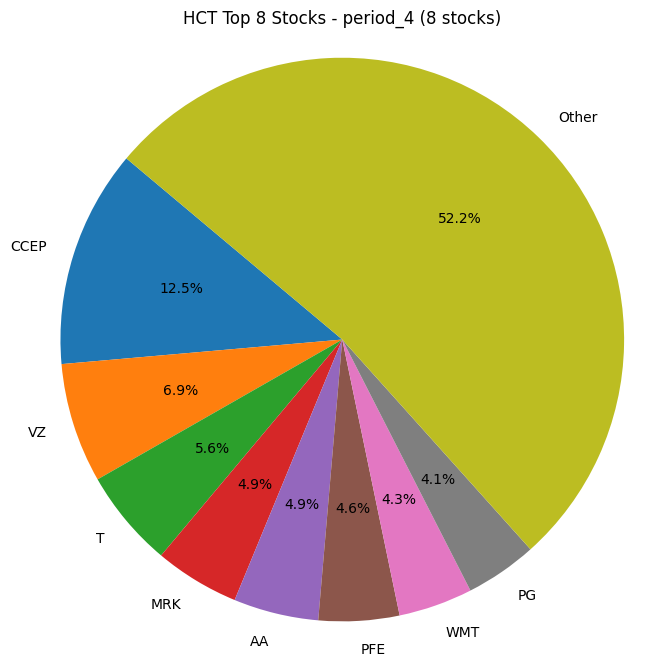

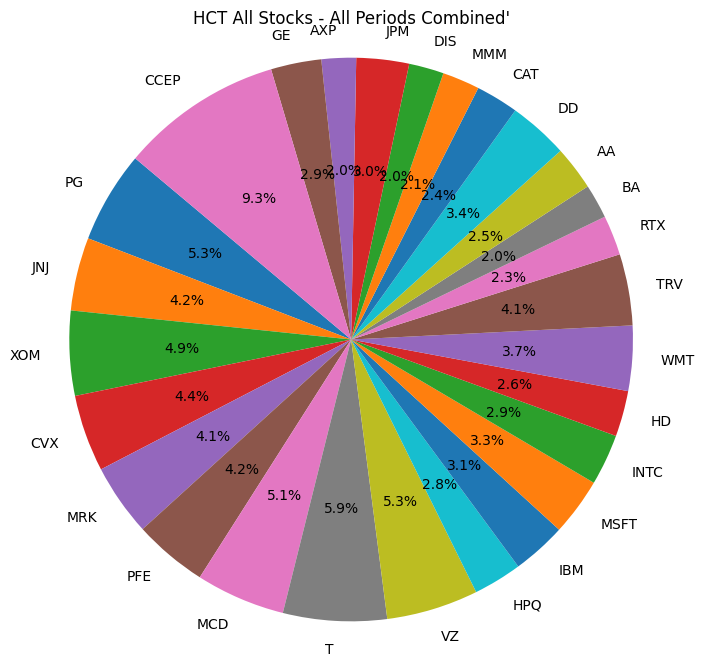

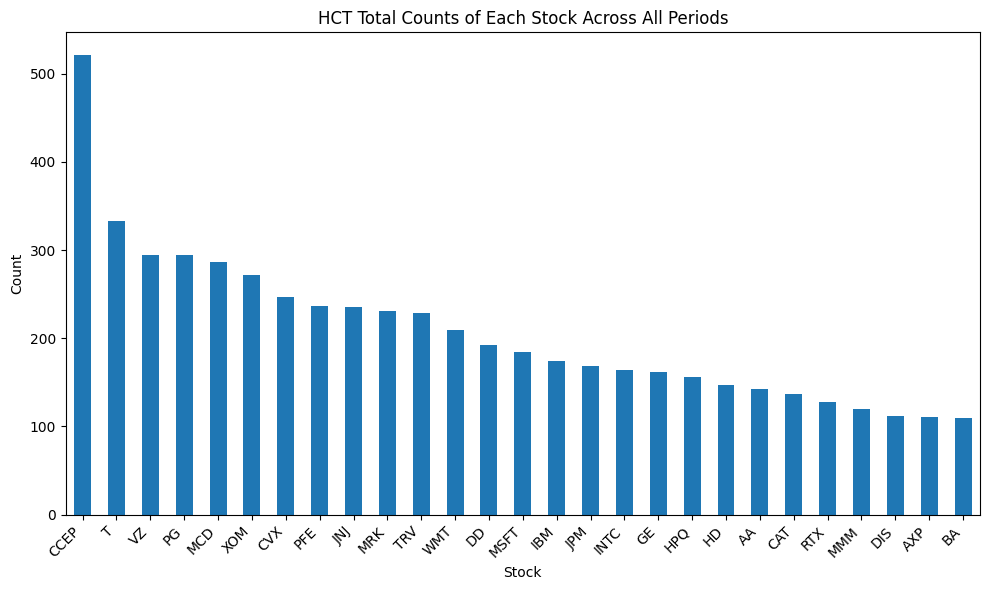

In [411]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

<class 'pandas.core.series.Series'>
period_1 (2 stocks)    [MRK, WMT]
Name: Stocks, dtype: object
MRK    1
WMT    1
Name: count, dtype: int64


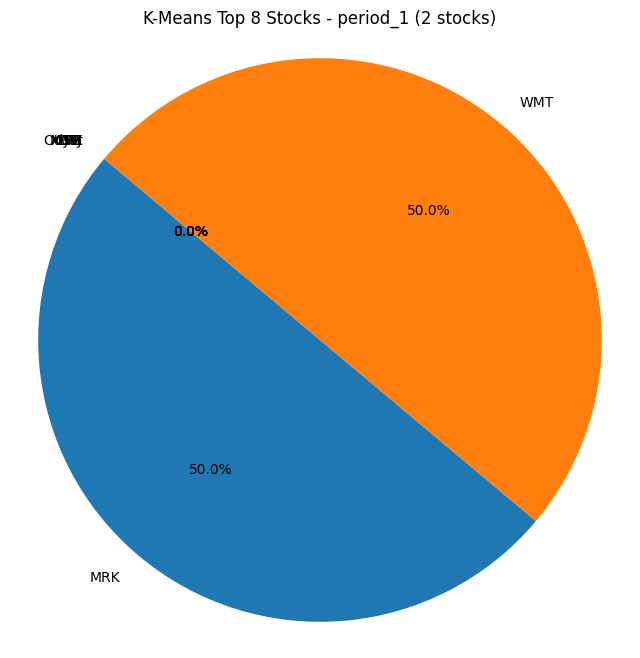

<class 'pandas.core.series.Series'>
period_1 (4 stocks)    [GE, MRK, HPQ, MCD]
Name: Stocks, dtype: object
GE     1
MRK    1
HPQ    1
MCD    1
Name: count, dtype: int64


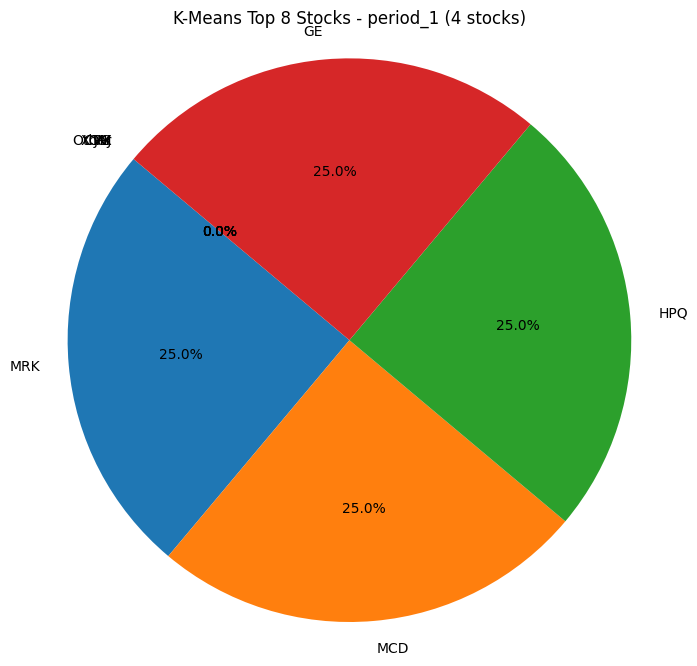

<class 'pandas.core.series.Series'>
period_1 (8 stocks)    [CCEP, WMT, GE, MRK, T, XOM, DIS, HPQ]
Name: Stocks, dtype: object
CCEP    1
WMT     1
GE      1
MRK     1
T       1
XOM     1
DIS     1
HPQ     1
Name: count, dtype: int64


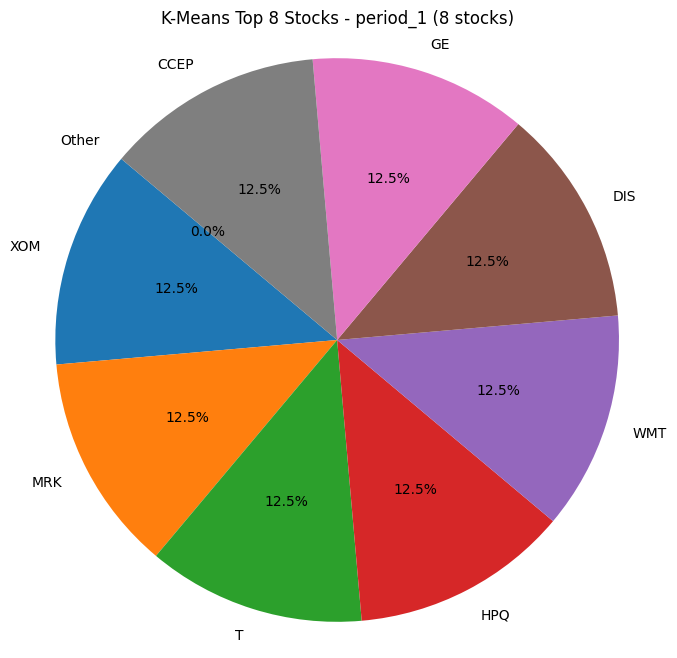

<class 'pandas.core.series.Series'>
period_2 (2 stocks)    [TRV, PFE]
Name: Stocks, dtype: object
TRV    1
PFE    1
Name: count, dtype: int64


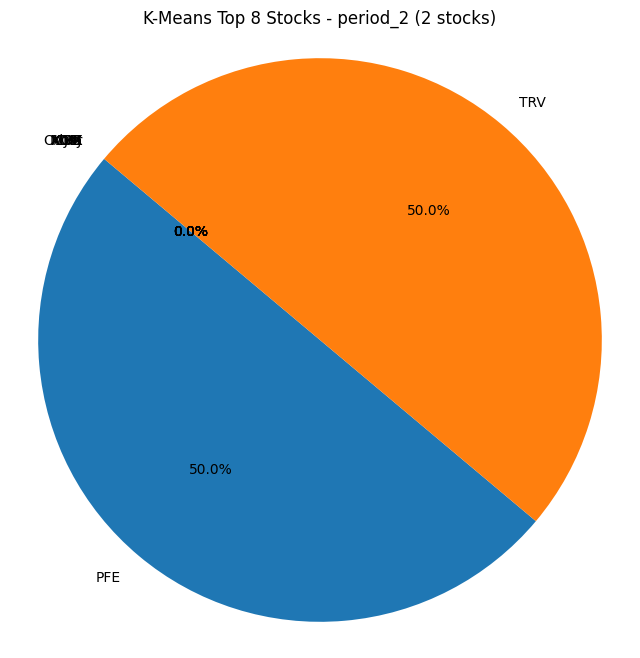

<class 'pandas.core.series.Series'>
period_2 (4 stocks)    [HD, TRV, PFE, XOM]
Name: Stocks, dtype: object
HD     1
TRV    1
PFE    1
XOM    1
Name: count, dtype: int64


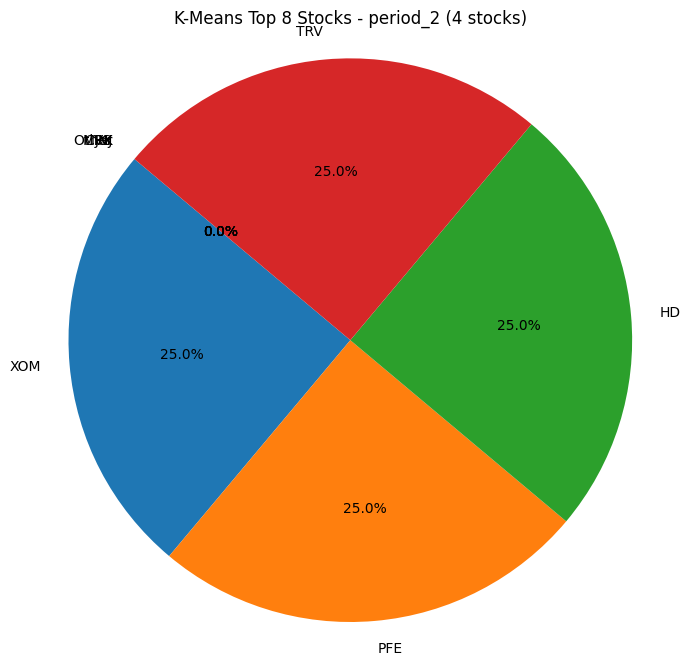

<class 'pandas.core.series.Series'>
period_2 (8 stocks)    [XOM, BA, TRV, JNJ, CAT, CCEP, VZ, PFE]
Name: Stocks, dtype: object
XOM     1
BA      1
TRV     1
JNJ     1
CAT     1
CCEP    1
VZ      1
PFE     1
Name: count, dtype: int64


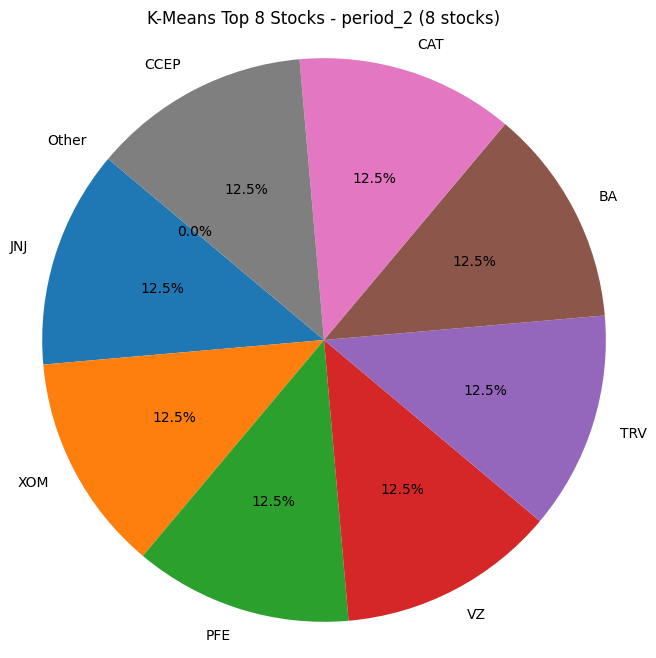

<class 'pandas.core.series.Series'>
period_3 (2 stocks)    [PFE, CCEP]
Name: Stocks, dtype: object
PFE     1
CCEP    1
Name: count, dtype: int64


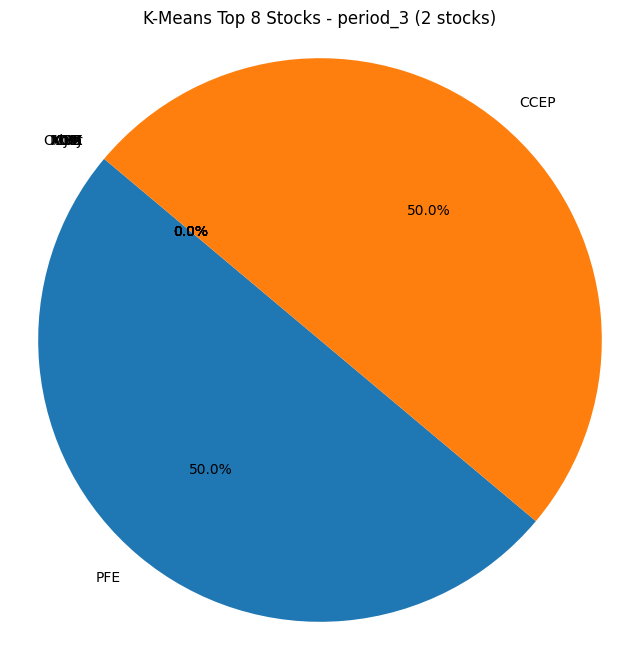

<class 'pandas.core.series.Series'>
period_3 (4 stocks)    [CCEP, DIS, PFE, HD]
Name: Stocks, dtype: object
CCEP    1
DIS     1
PFE     1
HD      1
Name: count, dtype: int64


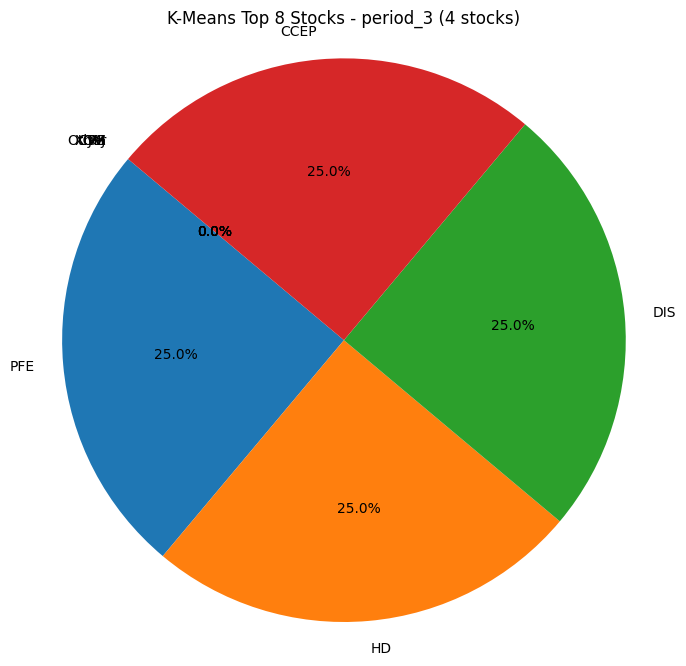

<class 'pandas.core.series.Series'>
period_3 (8 stocks)    [CVX, DIS, MCD, HD, TRV, INTC, CCEP, PFE]
Name: Stocks, dtype: object
CVX     1
DIS     1
MCD     1
HD      1
TRV     1
INTC    1
CCEP    1
PFE     1
Name: count, dtype: int64


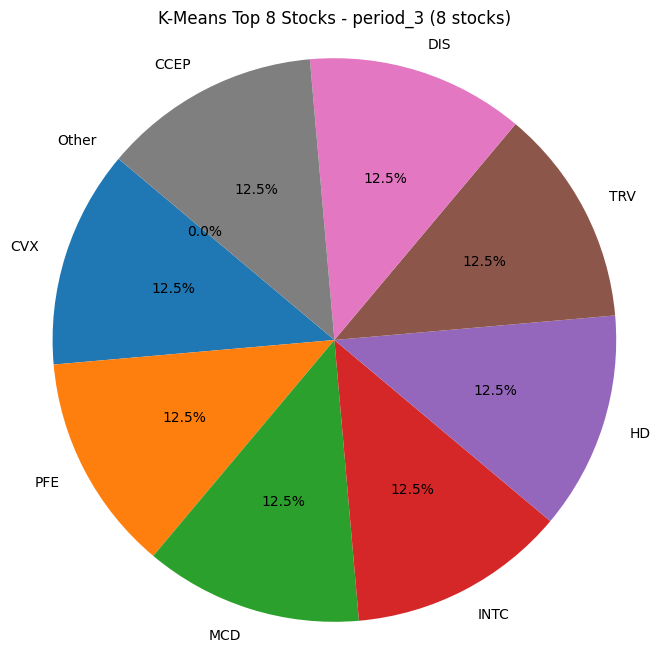

<class 'pandas.core.series.Series'>
period_4 (2 stocks)    [DIS, TRV]
Name: Stocks, dtype: object
DIS    1
TRV    1
Name: count, dtype: int64


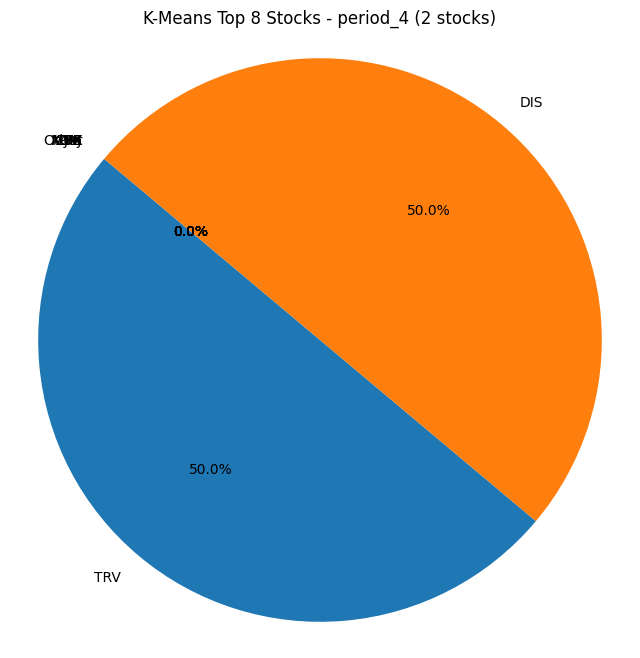

<class 'pandas.core.series.Series'>
period_4 (4 stocks)    [JNJ, TRV, CCEP, GE]
Name: Stocks, dtype: object
JNJ     1
TRV     1
CCEP    1
GE      1
Name: count, dtype: int64


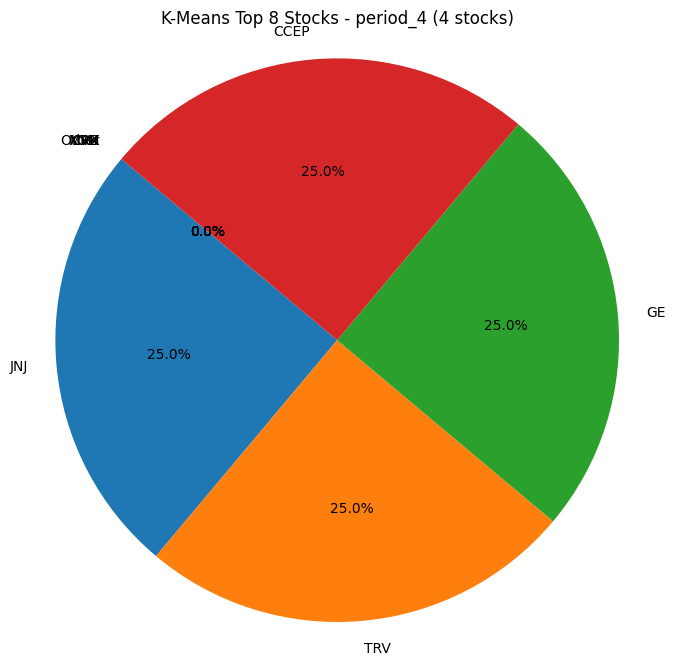

<class 'pandas.core.series.Series'>
period_4 (8 stocks)    [WMT, GE, T, MSFT, CCEP, JNJ, TRV, MCD]
Name: Stocks, dtype: object
WMT     1
GE      1
T       1
MSFT    1
CCEP    1
JNJ     1
TRV     1
MCD     1
Name: count, dtype: int64


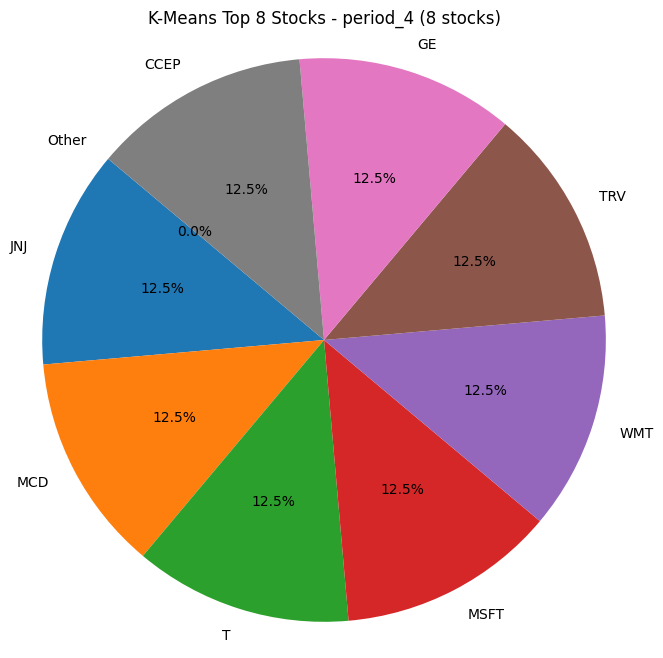

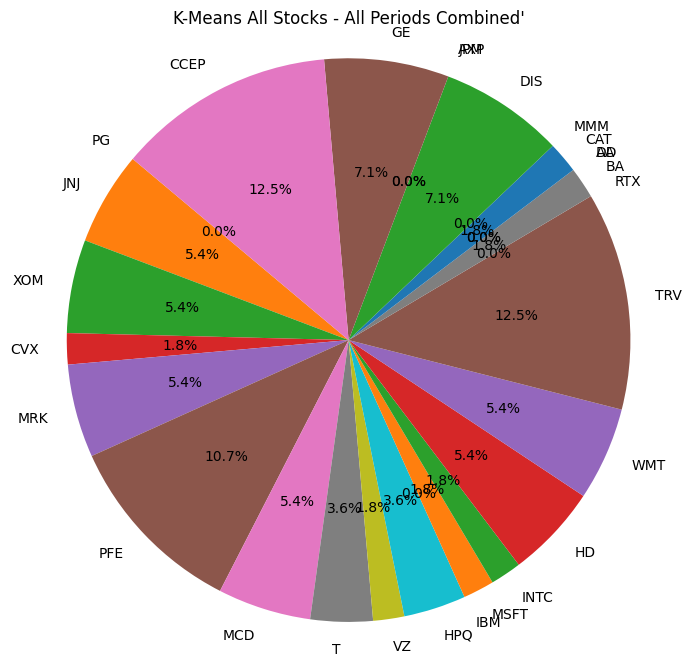

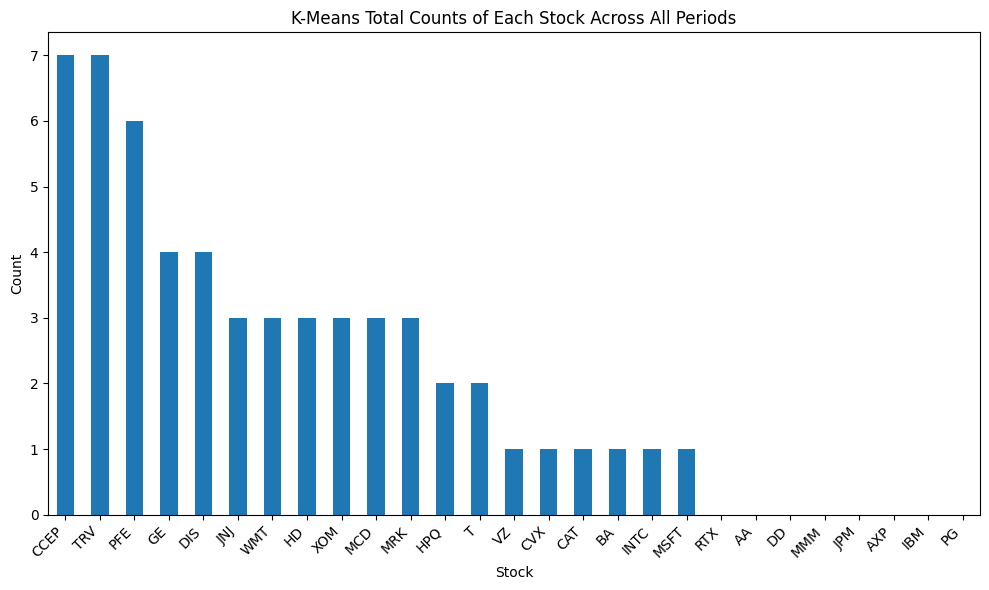

In [412]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

<class 'pandas.core.series.Series'>
period_1 (2 stocks)    [PG, JPM, T, CVX, CCEP, HPQ, MRK, DD, VZ, INTC...
Name: Stocks, dtype: object
PFE     17
JNJ     17
T       14
CCEP    14
MRK     13
VZ      13
PG      12
IBM      9
INTC     8
AA       7
MCD      7
HPQ      6
CAT      6
HD       6
MSFT     6
DD       5
CVX      5
MMM      5
WMT      5
AXP      5
GE       4
XOM      4
JPM      3
DIS      3
BA       3
RTX      2
TRV      1
Name: count, dtype: int64


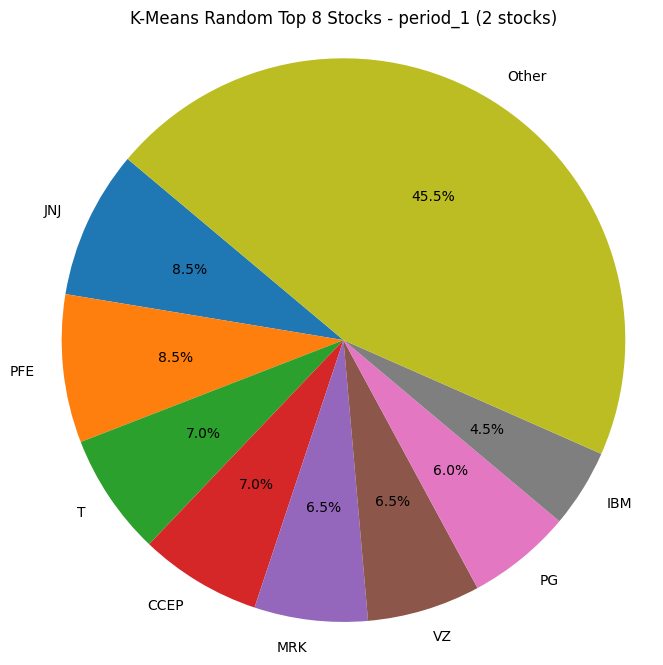

<class 'pandas.core.series.Series'>
period_1 (4 stocks)    [WMT, MRK, INTC, T, HD, PG, HPQ, VZ, AXP, PG, ...
Name: Stocks, dtype: object
T       38
VZ      35
IBM     31
HPQ     28
MCD     27
PFE     24
MRK     22
INTC    22
CCEP    22
MSFT    19
JNJ     18
BA      14
PG      14
GE      12
MMM     10
HD       8
JPM      8
WMT      8
RTX      6
CVX      6
AXP      6
DIS      6
DD       5
AA       4
XOM      3
TRV      2
CAT      2
Name: count, dtype: int64


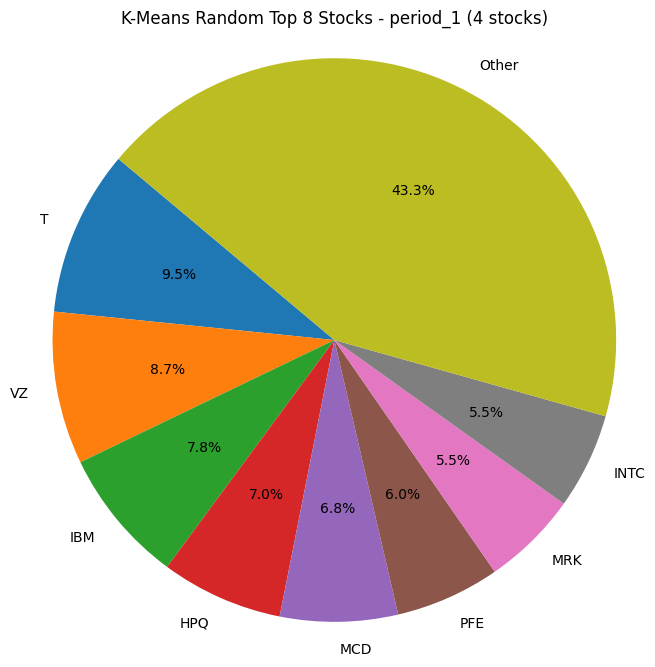

<class 'pandas.core.series.Series'>
period_1 (8 stocks)    [CCEP, CAT, TRV, PFE, VZ, CVX, DIS, INTC, CCEP...
Name: Stocks, dtype: object
CCEP    100
CVX      54
VZ       51
DIS      50
MCD      50
T        49
XOM      46
TRV      35
PG       30
INTC     27
IBM      26
MRK      26
MSFT     25
JNJ      24
AXP      24
HPQ      22
GE       21
CAT      20
JPM      20
PFE      20
AA       17
BA       13
RTX      13
DD       12
HD        9
MMM       9
WMT       7
Name: count, dtype: int64


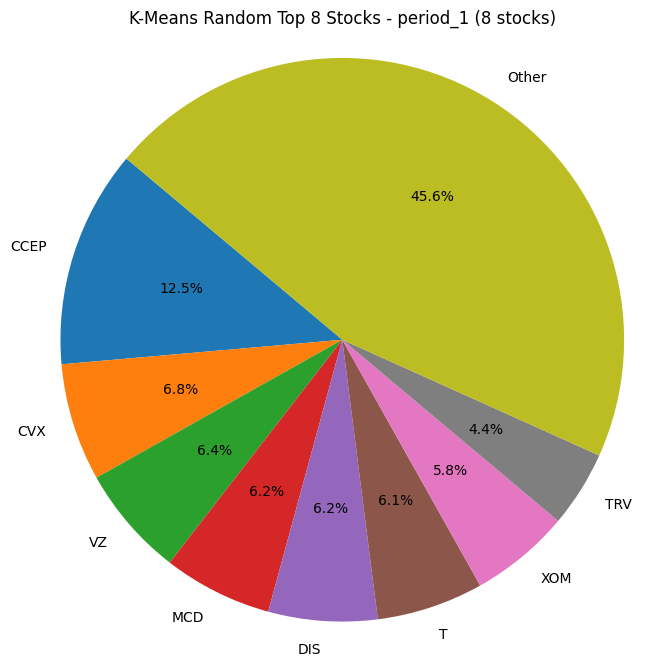

<class 'pandas.core.series.Series'>
period_2 (2 stocks)    [MCD, PFE, AA, PFE, GE, CVX, MMM, MRK, MCD, XO...
Name: Stocks, dtype: object
PG      19
JNJ     16
PFE     16
MRK     14
CVX     13
XOM     12
MCD     10
CCEP    10
CAT      9
HD       9
T        7
MMM      6
DD       5
AA       5
DIS      5
WMT      5
AXP      5
MSFT     4
INTC     4
JPM      4
RTX      4
VZ       4
IBM      4
HPQ      3
GE       3
BA       2
TRV      2
Name: count, dtype: int64


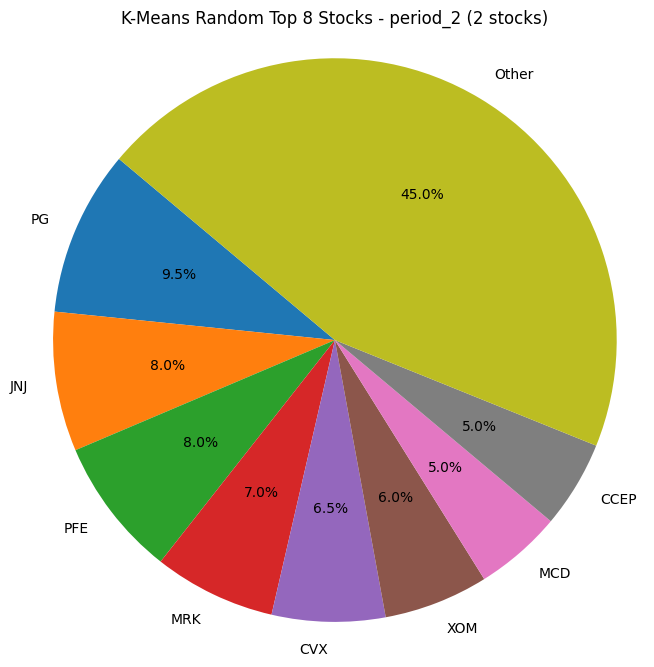

<class 'pandas.core.series.Series'>
period_2 (4 stocks)    [HD, DIS, JNJ, XOM, WMT, JPM, JNJ, XOM, DD, DI...
Name: Stocks, dtype: object
XOM     53
CVX     47
JNJ     25
HD      23
WMT     23
DD      23
CCEP    21
PG      20
MRK     18
CAT     18
PFE     16
AA      13
VZ      11
MMM      9
INTC     9
T        8
DIS      8
HPQ      7
GE       7
IBM      6
BA       6
MSFT     6
AXP      5
JPM      5
RTX      5
MCD      4
TRV      4
Name: count, dtype: int64


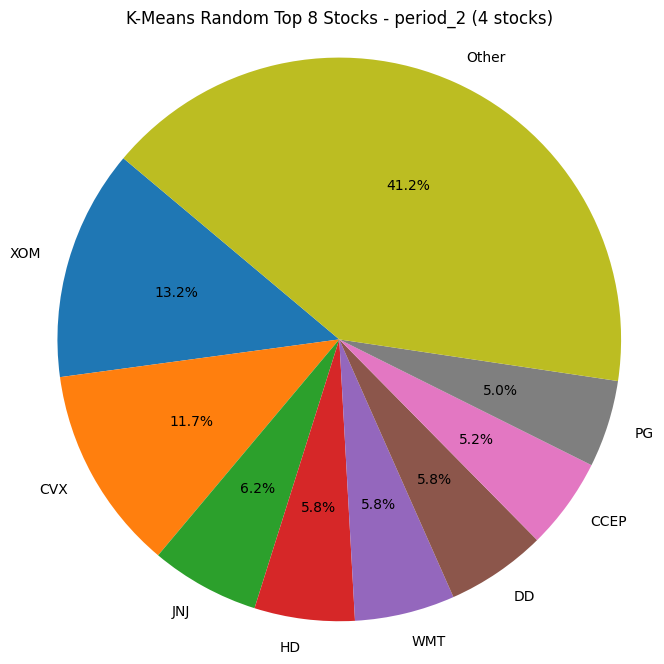

<class 'pandas.core.series.Series'>
period_2 (8 stocks)    [CVX, AXP, DIS, JNJ, AA, CCEP, T, PFE, CVX, JP...
Name: Stocks, dtype: object
CCEP    100
MRK      55
CVX      53
PG       52
T        51
VZ       49
JNJ      48
XOM      47
PFE      45
CAT      36
DD       33
AA       31
MSFT     23
HPQ      22
INTC     19
DIS      19
TRV      17
WMT      16
HD       16
JPM      12
RTX      11
BA       10
GE        9
IBM       8
MMM       8
MCD       7
AXP       3
Name: count, dtype: int64


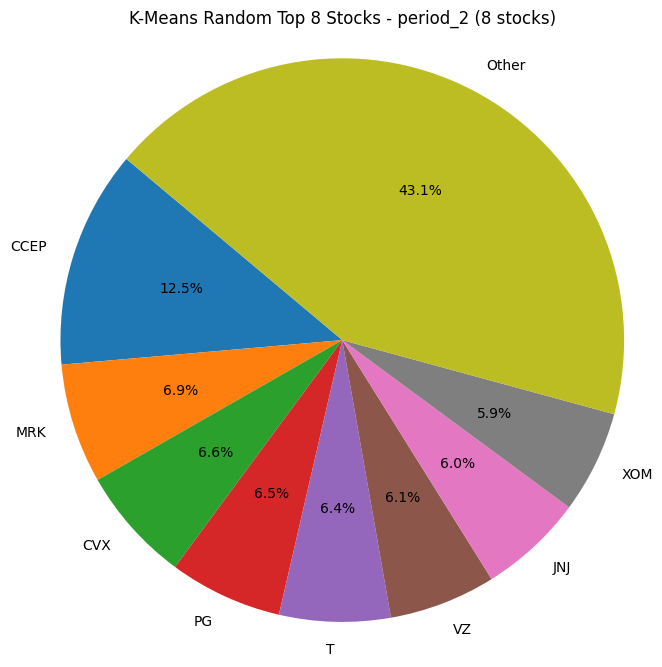

<class 'pandas.core.series.Series'>
period_3 (2 stocks)    [VZ, INTC, MSFT, AA, JNJ, IBM, MRK, BA, TRV, I...
Name: Stocks, dtype: object
MSFT    16
WMT     12
VZ      11
INTC    10
IBM     10
HPQ     10
CCEP    10
GE       9
T        9
HD       9
MCD      8
MRK      8
TRV      8
PG       7
BA       7
CVX      6
JNJ      6
AXP      6
CAT      5
XOM      5
DIS      4
DD       4
MMM      4
RTX      4
JPM      4
AA       4
PFE      4
Name: count, dtype: int64


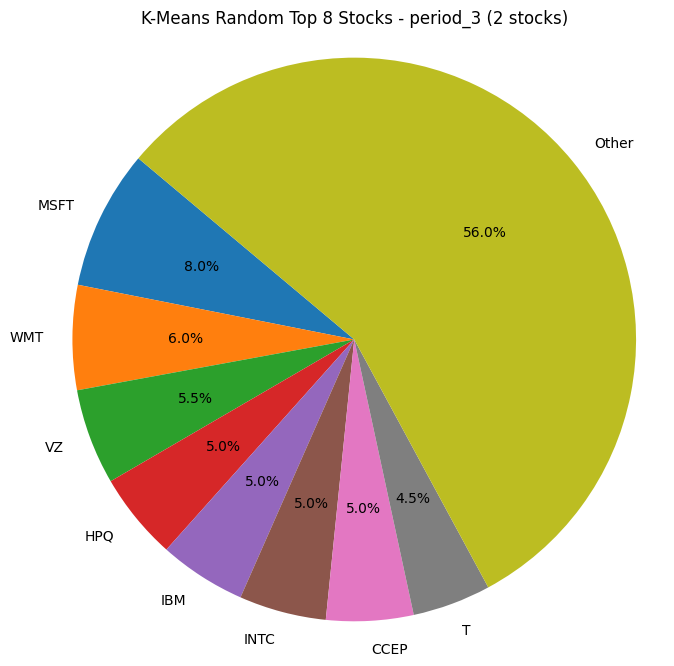

<class 'pandas.core.series.Series'>
period_3 (4 stocks)    [IBM, DD, JNJ, JPM, INTC, BA, MCD, HD, CCEP, M...
Name: Stocks, dtype: object
JPM     30
HD      30
CCEP    26
INTC    24
GE      20
AXP     20
IBM     18
CVX     16
MSFT    16
HPQ     16
MCD     15
MMM     14
VZ      14
DD      13
MRK     13
PFE     13
BA      12
TRV     11
AA      11
PG      11
WMT     10
XOM     10
RTX      9
DIS      8
T        7
CAT      7
JNJ      6
Name: count, dtype: int64


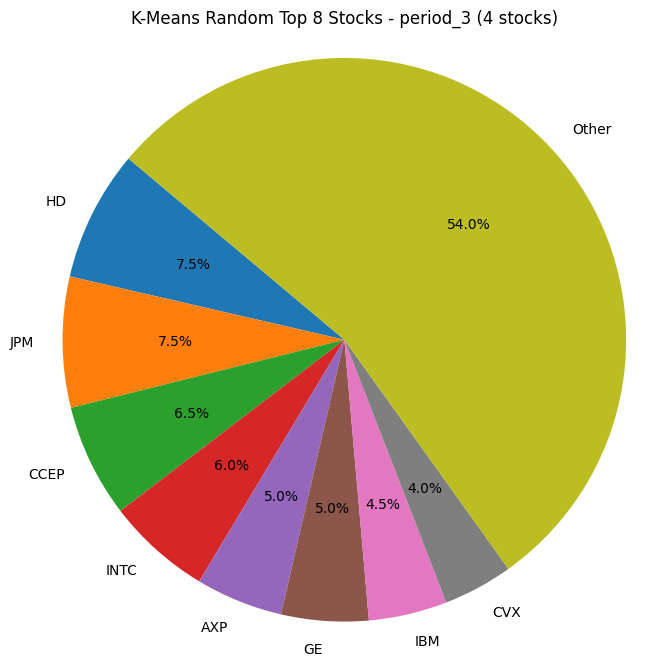

<class 'pandas.core.series.Series'>
period_3 (8 stocks)    [CVX, CAT, WMT, GE, TRV, MSFT, T, MRK, CVX, BA...
Name: Stocks, dtype: object
TRV     100
CVX      51
XOM      49
CCEP     38
PFE      37
MCD      37
MRK      35
T        33
WMT      33
JPM      30
PG       30
VZ       29
GE       29
JNJ      28
INTC     28
CAT      25
IBM      25
HD       24
HPQ      24
MSFT     23
BA       18
AXP      17
RTX      16
DD       15
DIS      10
AA        8
MMM       8
Name: count, dtype: int64


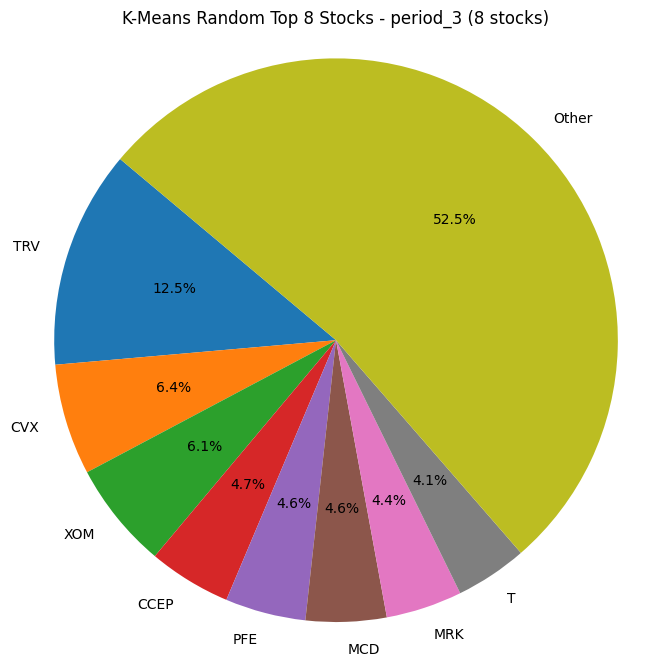

<class 'pandas.core.series.Series'>
period_4 (2 stocks)    [INTC, MCD, RTX, MRK, MMM, WMT, CVX, T, CVX, T...
Name: Stocks, dtype: object
T       14
PG      13
CCEP    11
JNJ     11
VZ      10
TRV     10
DIS      9
MCD      9
WMT      9
GE       9
HPQ      8
DD       8
PFE      7
INTC     7
HD       7
MSFT     6
JPM      6
CVX      6
MRK      6
AXP      6
XOM      6
CAT      6
RTX      5
AA       3
MMM      3
IBM      3
BA       2
Name: count, dtype: int64


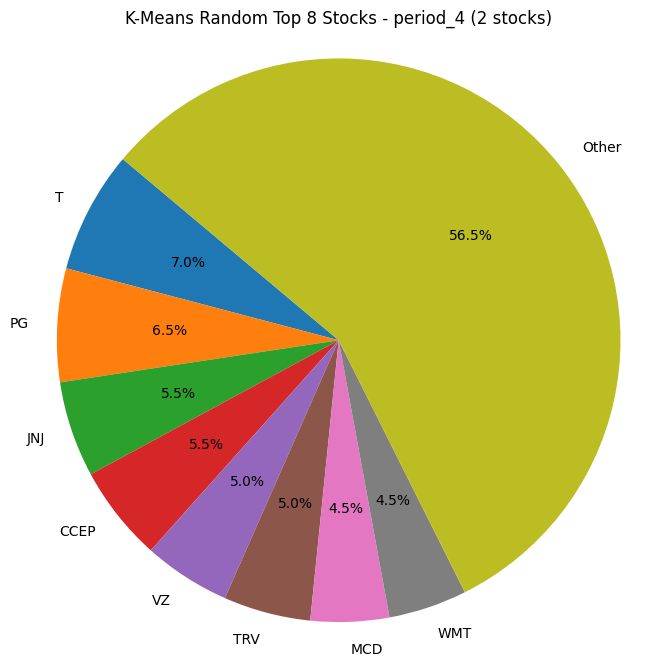

<class 'pandas.core.series.Series'>
period_4 (4 stocks)    [T, MSFT, CCEP, AA, MCD, IBM, CCEP, GE, MCD, H...
Name: Stocks, dtype: object
CCEP    100
MRK      17
RTX      17
T        16
JPM      16
MMM      15
PG       14
JNJ      13
GE       13
IBM      13
PFE      12
TRV      12
XOM      12
MSFT     12
HD       12
AA       11
HPQ      11
CVX      11
VZ       10
MCD       9
AXP       9
DIS       9
WMT       9
INTC      8
CAT       7
BA        7
DD        5
Name: count, dtype: int64


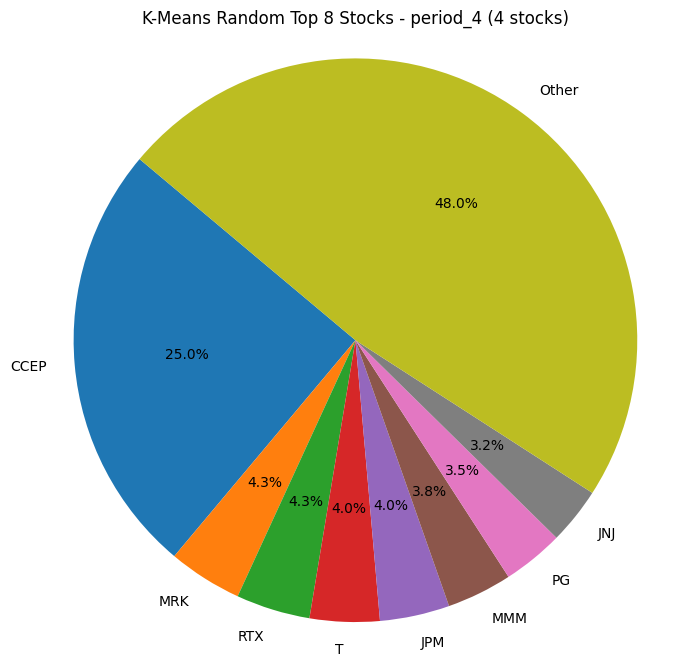

<class 'pandas.core.series.Series'>
period_4 (8 stocks)    [WMT, CVX, T, IBM, CCEP, JNJ, JPM, MCD, WMT, B...
Name: Stocks, dtype: object
WMT     100
CCEP    100
VZ       55
MCD      55
T        45
PG       45
PFE      40
JPM      34
MRK      33
INTC     29
HPQ      28
JNJ      27
AXP      27
IBM      26
HD       21
TRV      18
MSFT     17
BA       16
RTX      16
GE       12
DIS      11
CVX      11
MMM       9
DD        9
AA        7
XOM       5
CAT       4
Name: count, dtype: int64


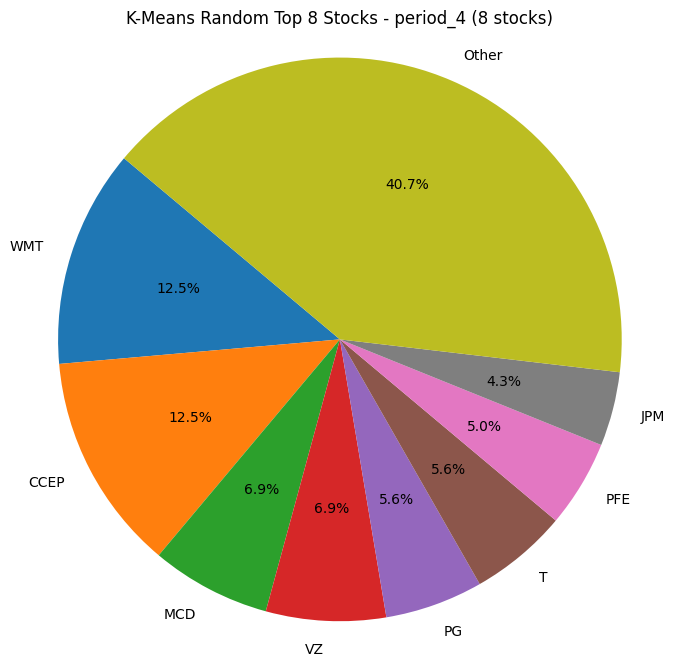

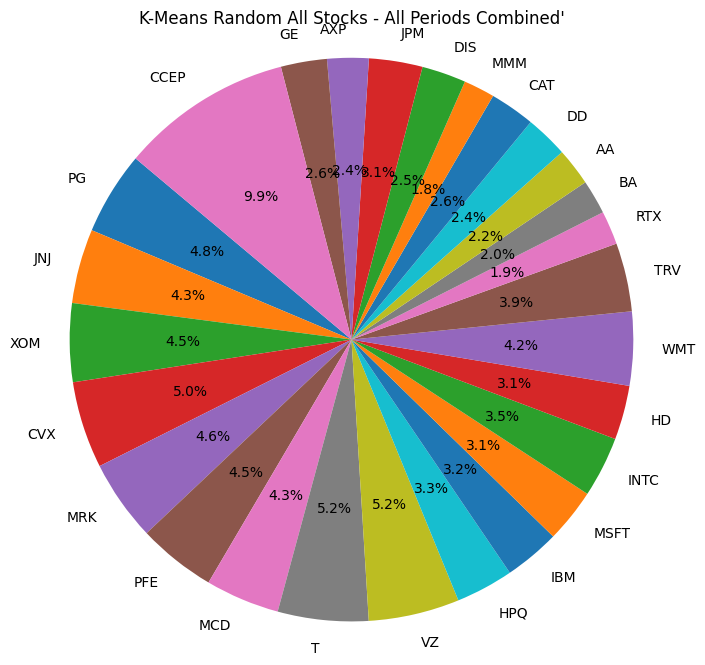

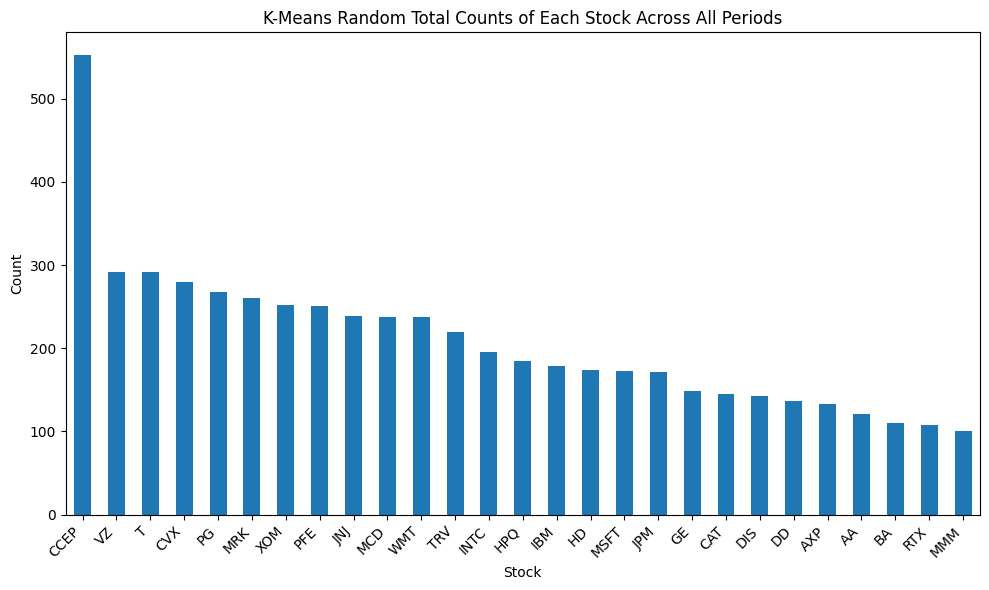

In [413]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

<class 'pandas.core.series.Series'>
period_1 (2 stocks)    [PG, TRV, MMM, MCD, CAT, TRV, MSFT, HD, BA, IB...
Name: Stocks, dtype: object
TRV     13
T       12
AXP     11
CAT     11
IBM     11
CVX     10
VZ      10
DD      10
HD      10
HPQ      9
MSFT     9
MMM      9
MCD      8
AA       7
BA       7
RTX      7
JPM      6
MRK      6
WMT      6
XOM      5
CCEP     5
DIS      4
PFE      4
INTC     4
GE       3
PG       2
JNJ      1
Name: count, dtype: int64


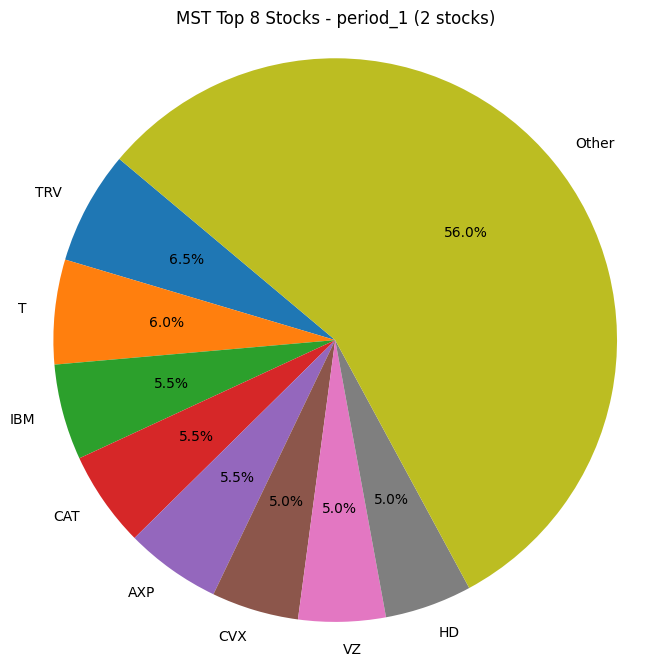

<class 'pandas.core.series.Series'>
period_1 (4 stocks)    [AA, JNJ, HPQ, TRV, AXP, JPM, HPQ, TRV, MMM, J...
Name: Stocks, dtype: object
CAT     26
HPQ     23
BA      22
XOM     19
TRV     19
GE      19
VZ      18
JNJ     18
INTC    17
IBM     17
MCD     16
AXP     16
HD      16
DIS     15
T       15
JPM     15
WMT     13
PFE     12
DD      12
MSFT    12
PG      11
MMM     11
CVX     10
CCEP     9
RTX      8
AA       7
MRK      4
Name: count, dtype: int64


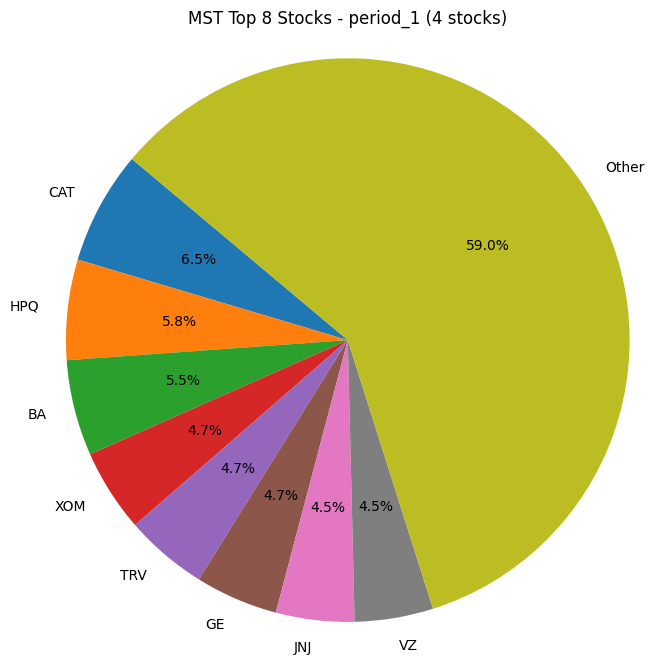

<class 'pandas.core.series.Series'>
period_1 (8 stocks)    [AXP, JPM, RTX, INTC, GE, IBM, TRV, PFE, AA, C...
Name: Stocks, dtype: object
IBM     55
AXP     50
AA      50
HPQ     45
VZ      40
RTX     36
GE      35
DIS     35
CCEP    32
CVX     32
TRV     31
WMT     30
BA      29
T       29
MCD     29
MSFT    25
INTC    24
PFE     24
HD      24
DD      23
PG      22
JPM     19
CAT     19
XOM     18
JNJ     15
MMM     15
MRK     14
Name: count, dtype: int64


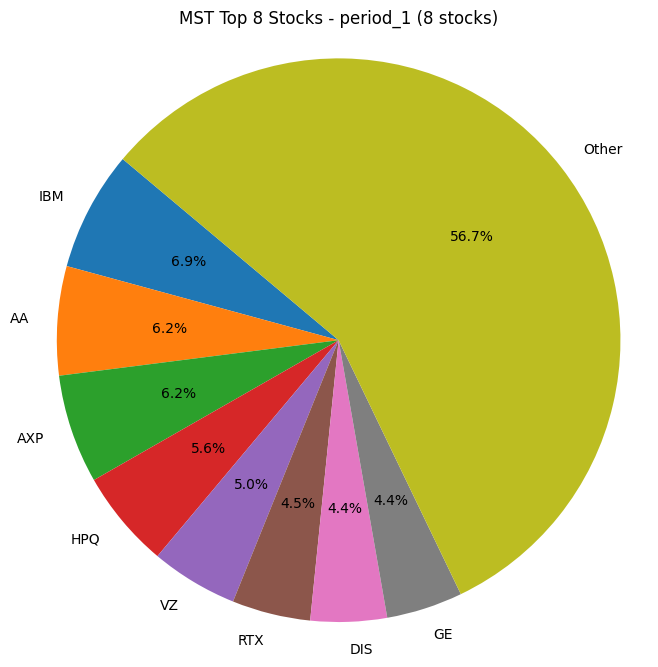

<class 'pandas.core.series.Series'>
period_2 (2 stocks)    [XOM, IBM, XOM, RTX, DIS, IBM, T, BA, T, CAT, ...
Name: Stocks, dtype: object
MRK     15
XOM     11
MCD     11
DD      11
INTC    11
MMM     11
HD      10
T       10
PG      10
RTX      9
JPM      9
TRV      8
BA       7
MSFT     7
IBM      7
WMT      6
GE       6
CVX      6
DIS      5
VZ       5
CAT      5
AXP      4
AA       4
JNJ      4
HPQ      3
PFE      3
CCEP     2
Name: count, dtype: int64


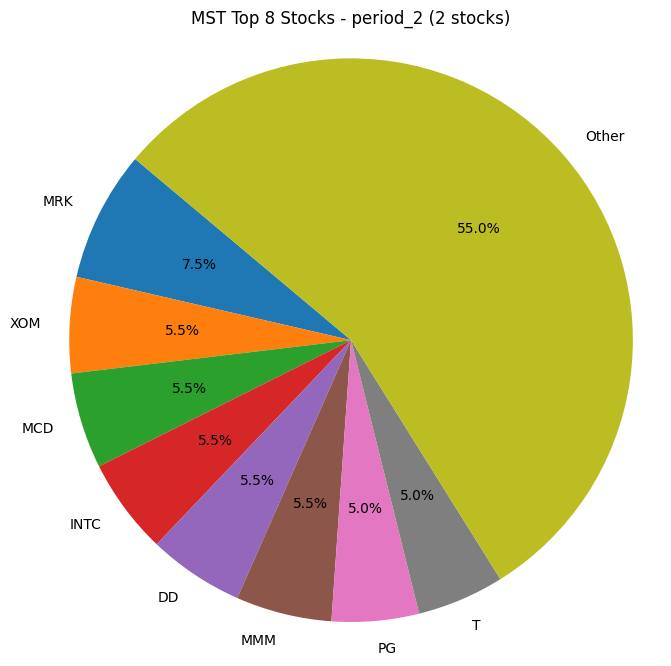

<class 'pandas.core.series.Series'>
period_2 (4 stocks)    [VZ, MMM, MSFT, HD, VZ, WMT, PFE, XOM, AA, HPQ...
Name: Stocks, dtype: object
INTC    25
XOM     24
AXP     19
HD      18
PFE     18
GE      17
DD      17
VZ      17
RTX     16
AA      16
WMT     16
MCD     16
DIS     15
IBM     15
MRK     15
MSFT    15
JPM     15
CAT     14
HPQ     13
MMM     13
JNJ     11
BA      11
T       10
TRV     10
CVX      9
PG       9
CCEP     6
Name: count, dtype: int64


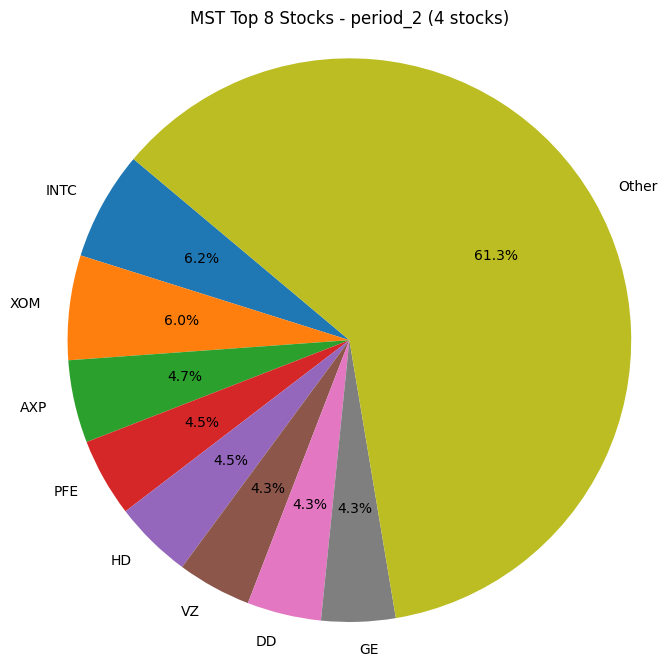

<class 'pandas.core.series.Series'>
period_2 (8 stocks)    [GE, MMM, CAT, CVX, HD, IBM, JPM, T, DIS, MRK,...
Name: Stocks, dtype: object
CCEP    51
IBM     50
HPQ     50
CVX     49
GE      37
MSFT    37
TRV     36
DIS     36
CAT     35
VZ      34
T       30
BA      28
RTX     27
AA      27
PFE     26
JNJ     26
PG      24
AXP     24
HD      23
MCD     22
XOM     21
JPM     21
DD      19
MMM     18
MRK     17
WMT     17
INTC    15
Name: count, dtype: int64


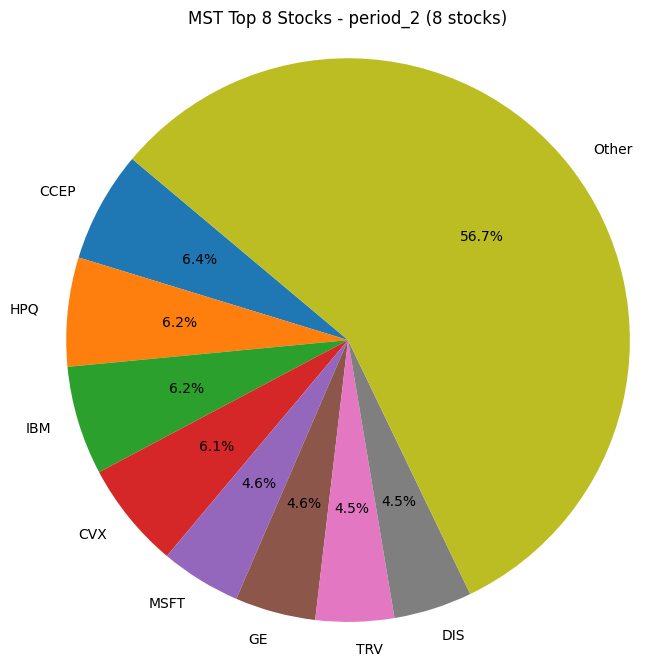

<class 'pandas.core.series.Series'>
period_3 (2 stocks)    [JPM, MSFT, JNJ, GE, INTC, GE, T, MSFT, VZ, PG...
Name: Stocks, dtype: object
DIS     18
PFE     15
PG      15
CAT     15
MSFT    14
GE      12
BA      11
TRV      8
T        8
CVX      8
CCEP     7
JNJ      6
HPQ      6
HD       6
DD       5
JPM      5
AA       5
INTC     5
XOM      4
AXP      4
IBM      4
WMT      4
VZ       4
MCD      3
MMM      3
MRK      3
RTX      2
Name: count, dtype: int64


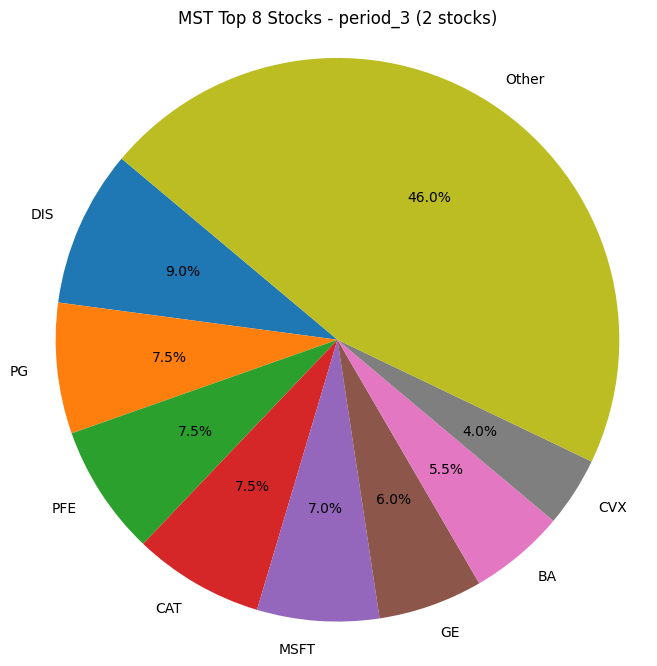

<class 'pandas.core.series.Series'>
period_3 (4 stocks)    [CVX, DIS, MRK, TRV, CCEP, DIS, MMM, MCD, XOM,...
Name: Stocks, dtype: object
WMT     25
TRV     20
DIS     20
RTX     19
MSFT    19
AXP     19
MCD     18
VZ      18
IBM     16
AA      16
T       15
DD      15
JPM     15
XOM     14
MMM     14
MRK     14
GE      13
HD      13
BA      13
PG      12
CAT     12
PFE     11
HPQ     10
CVX     10
CCEP    10
JNJ     10
INTC     9
Name: count, dtype: int64


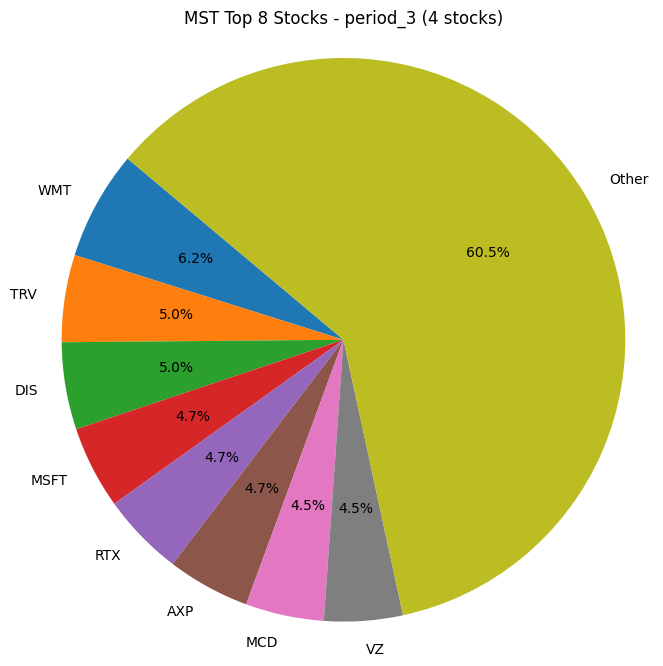

<class 'pandas.core.series.Series'>
period_3 (8 stocks)    [JPM, XOM, CAT, CCEP, MMM, INTC, WMT, PFE, JPM...
Name: Stocks, dtype: object
JPM     59
CVX     57
CCEP    43
AA      41
PFE     40
T       35
IBM     35
AXP     34
PG      32
XOM     31
INTC    31
BA      28
MSFT    28
DIS     27
WMT     26
MRK     24
HD      24
HPQ     23
TRV     23
CAT     23
GE      22
JNJ     22
DD      21
MCD     20
RTX     20
MMM     20
VZ      11
Name: count, dtype: int64


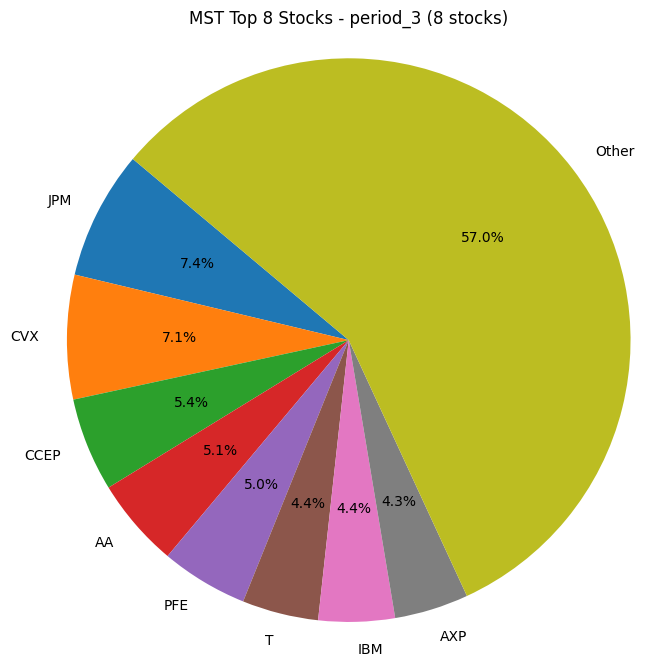

<class 'pandas.core.series.Series'>
period_4 (2 stocks)    [AA, JNJ, AXP, HD, DIS, XOM, GE, RTX, DD, MMM,...
Name: Stocks, dtype: object
MRK     13
GE      11
PFE     11
JPM     11
BA      10
DIS     10
HPQ     10
CCEP     9
XOM      9
JNJ      9
MSFT     8
DD       8
PG       8
T        7
CAT      7
RTX      7
INTC     6
MMM      6
AA       6
CVX      5
MCD      5
IBM      5
AXP      5
TRV      5
WMT      3
VZ       3
HD       3
Name: count, dtype: int64


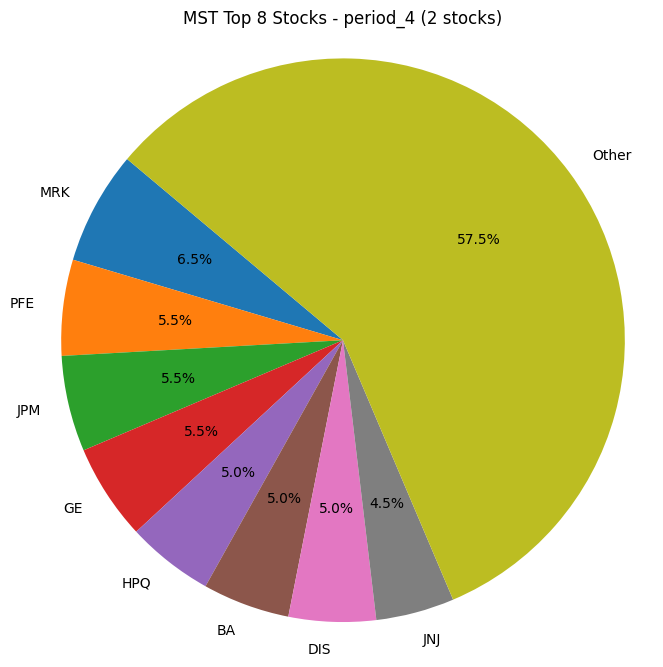

<class 'pandas.core.series.Series'>
period_4 (4 stocks)    [AXP, DD, IBM, INTC, CAT, DIS, IBM, XOM, BA, H...
Name: Stocks, dtype: object
IBM     25
MSFT    22
AA      21
WMT     21
PG      20
CVX     19
JPM     18
HD      17
PFE     16
AXP     16
HPQ     16
CAT     16
DD      15
T       15
INTC    15
CCEP    14
BA      14
DIS     14
XOM     12
MRK     11
JNJ     11
MMM     10
MCD     10
VZ       9
TRV      8
GE       8
RTX      7
Name: count, dtype: int64


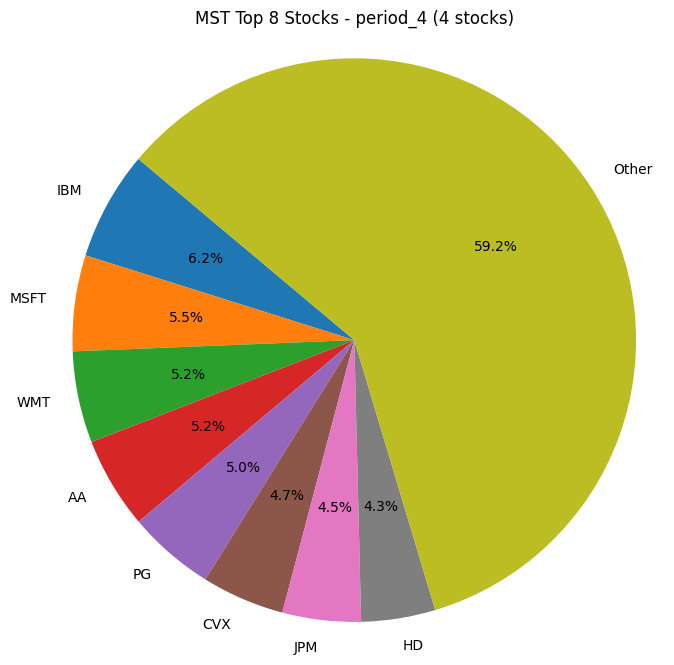

<class 'pandas.core.series.Series'>
period_4 (8 stocks)    [BA, CCEP, HPQ, GE, MSFT, MRK, WMT, XOM, AA, C...
Name: Stocks, dtype: object
XOM     56
DD      55
DIS     52
GE      48
HPQ     45
VZ      44
CVX     38
BA      38
JPM     34
TRV     34
AXP     33
WMT     32
CCEP    32
CAT     30
AA      29
HD      24
MSFT    21
PG      20
T       20
JNJ     19
PFE     18
MRK     17
IBM     17
RTX     14
INTC    12
MCD     10
MMM      8
Name: count, dtype: int64


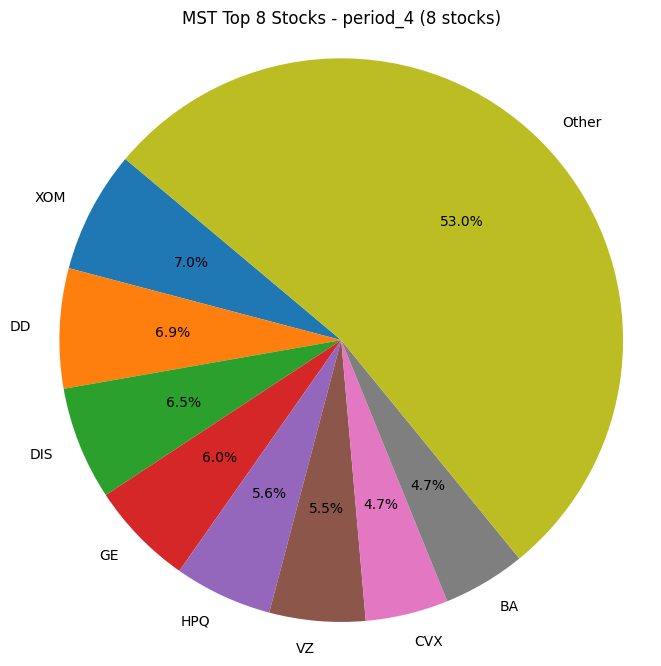

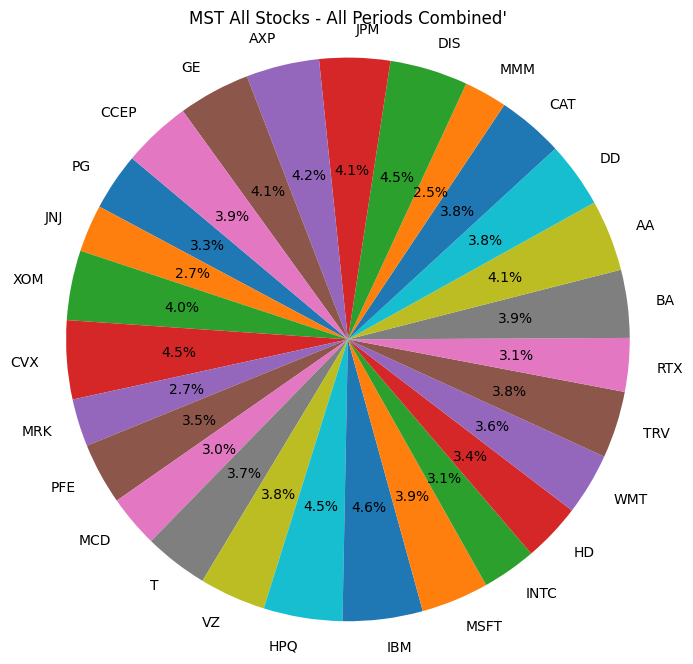

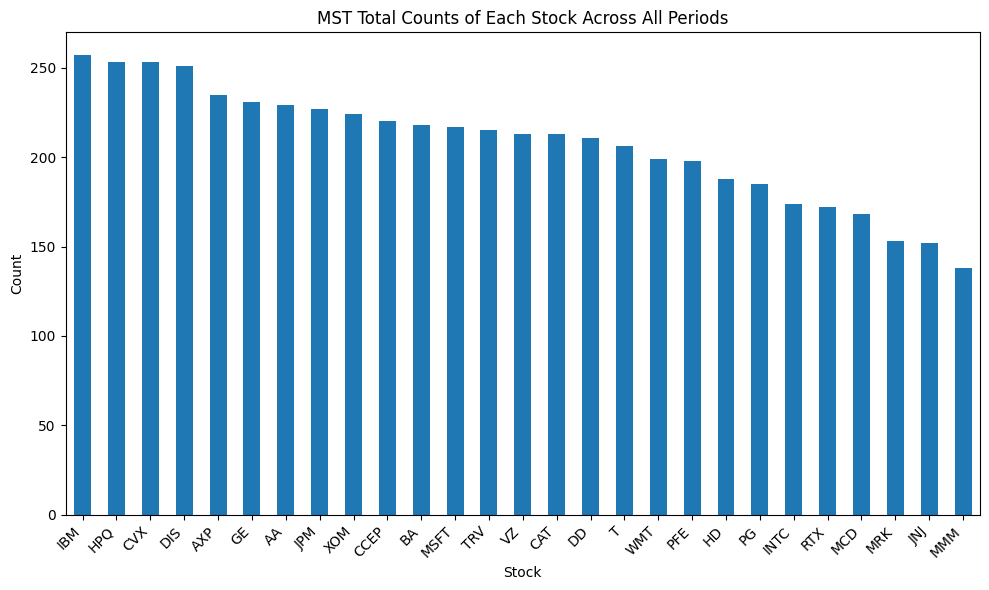

In [414]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [415]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 1.5, kmeans_rand_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

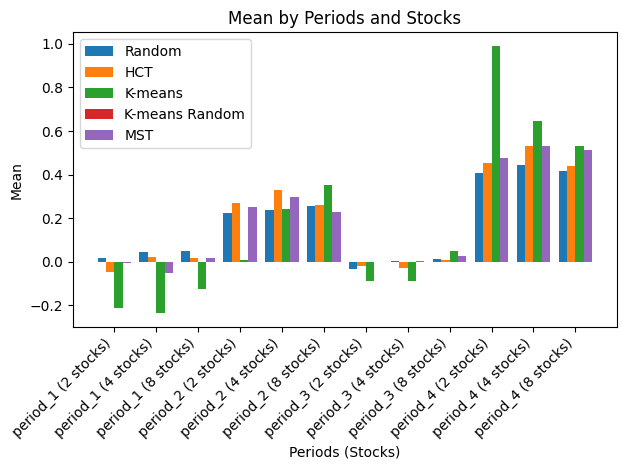

Total Average Mean of Random Values: 0.17380226647901317
Total Average Mean of Cluster Values: 0.18661068960344032
Total Average Mean of K-means Values: 0.17154203597025441
Total Average Mean of K-means Random Values: 0.1905468530923847
Total Average Mean of MST Values: 0.16443822884449022

Period 1 Average Mean of Random Values: 0.03819792667190639
Period 1 Average Mean of Cluster Values: -0.003049181617709866
Period 1 Average Mean of K-means Values: -0.19253420317477085
Period 1 Average Mean of K-means Random Values: -0.012953911994179402
Period 1 Average Mean of MST: 0.016408519747470318
Period 2 Average Mean of Random Values: 0.2404790183995771
Period 2 Average Mean of Cluster Values: 0.2874608286508054
Period 2 Average Mean of K-means Values: 0.19946825855504505
Period 2 Average Mean of K-means Random Values: 0.2586651033874004
Period 2 Average Mean of MST: 0.25560782457879955
Period 3 Average Mean of Random Values: -0.006166542309523519
Period 3 Average Mean of Cluster Values: -0

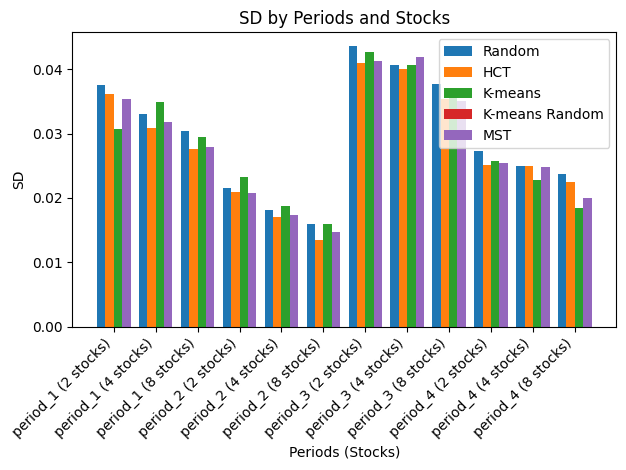

Total Average SD of Random Values: 0.0295447073947242
Total Average SD of Cluster Values: 0.027919724924978517
Total Average SD of K-means Values: 0.028228710816990393
Total Average SD of K-means Random Values: 0.02803897443102649
Total Average SD of MST Values: 0.030123363580331675

Period 1 Average SD of Random Values: 0.03364552468932542
Period 1 Average SD of Cluster Values: 0.03156069284008839
Period 1 Average SD of K-means Values: 0.031703903263429305
Period 1 Average SD of K-means Random Values: 0.03173229604429991
Period 1 Average SD of MST: 0.03466767573776866
Period 2 Average SD of Random Values: 0.01860255554947857
Period 2 Average SD of Cluster Values: 0.017172918080355495
Period 2 Average SD of K-means Values: 0.019286171396948545
Period 2 Average SD of K-means Random Values: 0.0175958258677444
Period 2 Average SD of MST: 0.01878975929474729
Period 3 Average SD of Random Values: 0.040610073133860614
Period 3 Average SD of Cluster Values: 0.0387940805530829
Period 3 Average

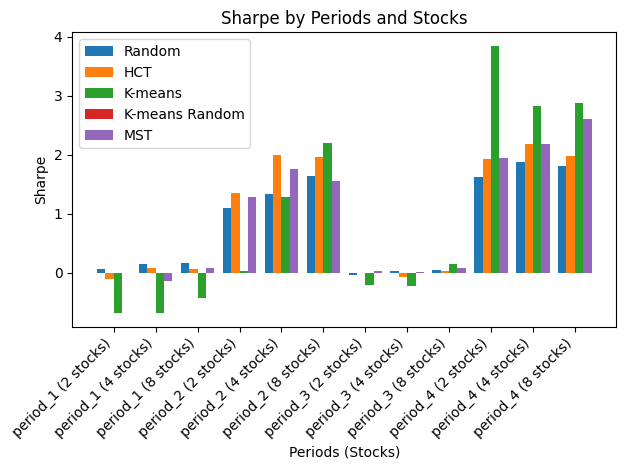

Total Average Sharpe of Random Values: 0.8131385052792756
Total Average Sharpe of Cluster Values: 0.9465878211687385
Total Average Sharpe of K-means Values: 0.9144627489382463
Total Average Sharpe of K-means Random Values: 0.9457208329521322
Total Average Sharpe of MST Values: 0.7705951562176921

Period 1 Average Sharpe of Random Values: 0.12537436620203202
Period 1 Average Sharpe of Cluster Values: 0.013956708909309654
Period 1 Average Sharpe of K-means Values: -0.6015371729312964
Period 1 Average Sharpe of K-means Random Values: -0.027673425094263498
Period 1 Average Sharpe of MST: 0.05115986714746774
Period 2 Average Sharpe of Random Values: 1.3557132623392192
Period 2 Average Sharpe of Cluster Values: 1.7705329483554297
Period 2 Average Sharpe of K-means Values: 1.1722762497655657
Period 2 Average Sharpe of K-means Random Values: 1.5298231394257344
Period 2 Average Sharpe of MST: 1.4372129729067815
Period 3 Average Sharpe of Random Values: 0.004153181310180769
Period 3 Average Shar

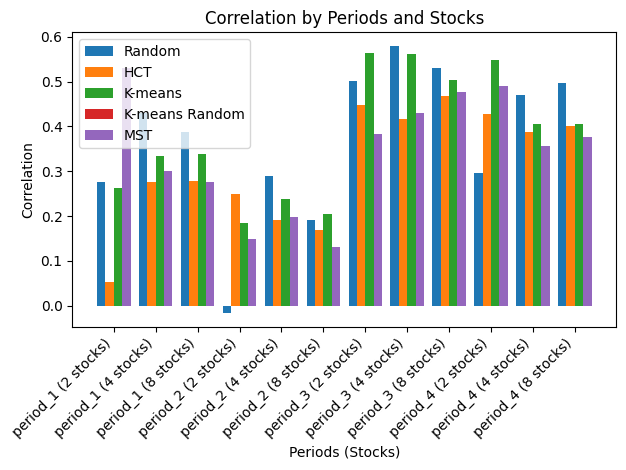

Total Average Correlation of Random Values: 0.3693521328384555
Total Average Correlation of Cluster Values: 0.313891682761649
Total Average Correlation of K-means Values: 0.37927635751560745
Total Average Correlation of K-means Random Values: 0.34171746098948885
Total Average Correlation of MST Values: 0.40147629694615045

Period 1 Average Correlation of Random Values: 0.364357448441098
Period 1 Average Correlation of Cluster Values: 0.20266066196268406
Period 1 Average Correlation of K-means Values: 0.3120438065135994
Period 1 Average Correlation of K-means Random Values: 0.3691754234018789
Period 1 Average Correlation of MST: 0.36290526094206205
Period 2 Average Correlation of Random Values: 0.15454191762383043
Period 2 Average Correlation of Cluster Values: 0.20286595898295343
Period 2 Average Correlation of K-means Values: 0.20928372621124322
Period 2 Average Correlation of K-means Random Values: 0.1597158380191682
Period 2 Average Correlation of MST: 0.24875839572628544
Period 3 A

In [416]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters)

In [417]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

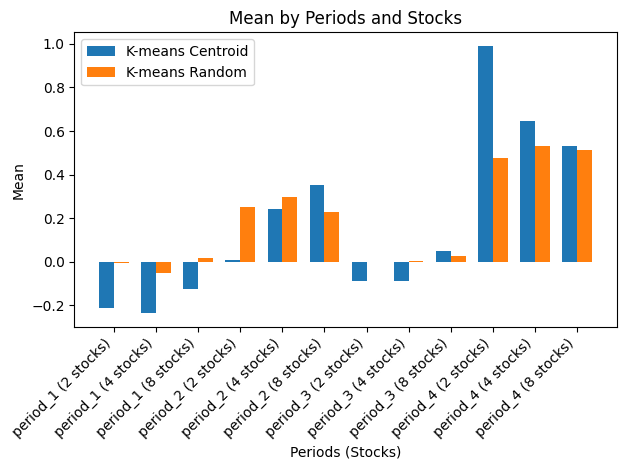

Total Average Mean of K-means Centroid Values: 0.17154203597025441
Total Average Mean of K-means Random Values: 0.1905468530923847

Period 1 Average Mean of K-means Centroid Values: -0.19253420317477085
Period 1 Average Mean of K-means Random Values: -0.012953911994179402
Period 2 Average Mean of K-means Centroid Values: 0.19946825855504505
Period 2 Average Mean of K-means Random Values: 0.2586651033874004
Period 3 Average Mean of K-means Centroid Values: -0.0433608849624653
Period 3 Average Mean of K-means Random Values: 0.010304919679473485


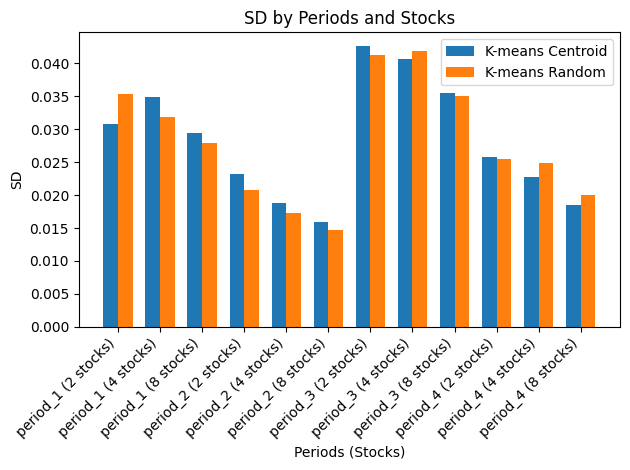

Total Average SD of K-means Centroid Values: 0.028228710816990393
Total Average SD of K-means Random Values: 0.02803897443102649

Period 1 Average SD of K-means Centroid Values: 0.031703903263429305
Period 1 Average SD of K-means Random Values: 0.03173229604429991
Period 2 Average SD of K-means Centroid Values: 0.019286171396948545
Period 2 Average SD of K-means Random Values: 0.0175958258677444
Period 3 Average SD of K-means Centroid Values: 0.039580481510487354
Period 3 Average SD of K-means Random Values: 0.03939674154899324


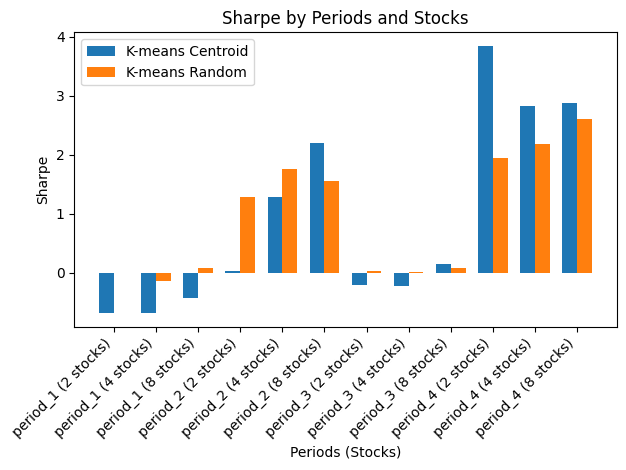

Total Average Sharpe of K-means Centroid Values: 0.9144627489382463
Total Average Sharpe of K-means Random Values: 0.9457208329521322

Period 1 Average Sharpe of K-means Centroid Values: -0.6015371729312964
Period 1 Average Sharpe of K-means Random Values: -0.027673425094263498
Period 2 Average Sharpe of K-means Centroid Values: 1.1722762497655657
Period 2 Average Sharpe of K-means Random Values: 1.5298231394257344
Period 3 Average Sharpe of K-means Centroid Values: -0.09740950157456296
Period 3 Average Sharpe of K-means Random Values: 0.03885919113885817


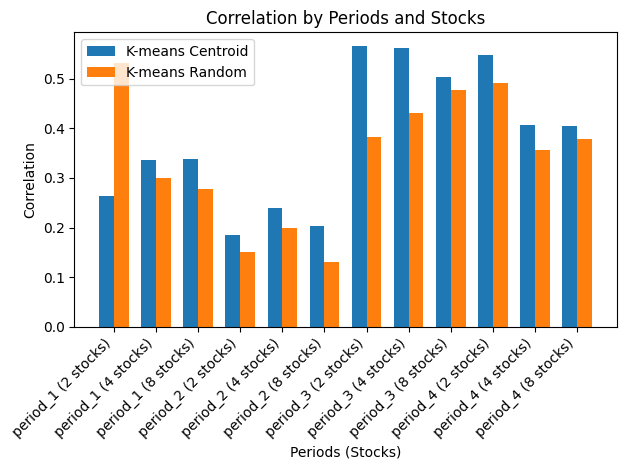

Total Average Correlation of K-means Centroid Values: 0.37927635751560745
Total Average Correlation of K-means Random Values: 0.34171746098948885

Period 1 Average Correlation of K-means Centroid Values: 0.3120438065135994
Period 1 Average Correlation of K-means Random Values: 0.3691754234018789
Period 2 Average Correlation of K-means Centroid Values: 0.20928372621124322
Period 2 Average Correlation of K-means Random Values: 0.1597158380191682
Period 3 Average Correlation of K-means Centroid Values: 0.5430710843581775
Period 3 Average Correlation of K-means Random Values: 0.42998104996228625


In [418]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

In [419]:
############# Out of sampling testing: other stocks ##############

In [420]:
custom_tickers_test = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "REGN", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]

In [421]:
period_dfs_test, correlation_matrices_test, distance_matrices_test = data_prep(custom_tickers_test, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_64084/1257815715.py:29: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

In [422]:
result_df_random_test = calculate_metrics_for_random_selection(period_dfs_test, num_stocks_list)
result_df_random_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.822485,0.060986,1.551443,0.314620,"[ORLY, ORCL, ADI, BIIB, INCY, ADI, MCHP, INCY,..."
period_1 (4 stocks),0.858280,0.052708,1.749263,0.358555,"[JBHT, ILMN, SHPG, VRTX, VRTX, ORCL, JBHT, FAS..."
period_1 (8 stocks),0.723417,0.045442,1.636559,0.197161,"[PCAR, BIIB, ILMN, NVDA, MCHP, MAR, ISRG, LRCX..."
period_2 (2 stocks),0.954763,0.036686,2.244839,0.156890,"[INTU, CTSH, MAT, VRTX, ISRG, EA, SRCL, EBAY, ..."
period_2 (4 stocks),0.998180,0.031375,2.988254,0.287637,"[TXN, ILMN, MAT, ADP, ILMN, TXN, AMZN, MNST, V..."
period_2 (8 stocks),0.804156,0.027445,2.853553,0.161181,"[CSCO, ADI, KLAC, AMZN, TSCO, TXN, AAPL, XRAY,..."
period_3 (2 stocks),0.240479,0.051101,0.457306,0.290138,"[EA, VRTX, CSX, AMZN, INTC, WBA, PCAR, VRTX, A..."
period_3 (4 stocks),0.203092,0.044432,0.461659,0.467786,"[MCHP, KLAC, AAPL, MAT, SHPG, BIIB, MSFT, REGN..."
period_3 (8 stocks),0.226038,0.039808,0.566830,0.420399,"[ISRG, MNST, GILD, BIIB, VOD, CSX, TSCO, ROST,..."
period_4 (2 stocks),1.113794,0.033581,3.191848,0.609478,"[XRAY, ADP, ADP, WBA, PAYX, BIIB, SRCL, NTAP, ..."


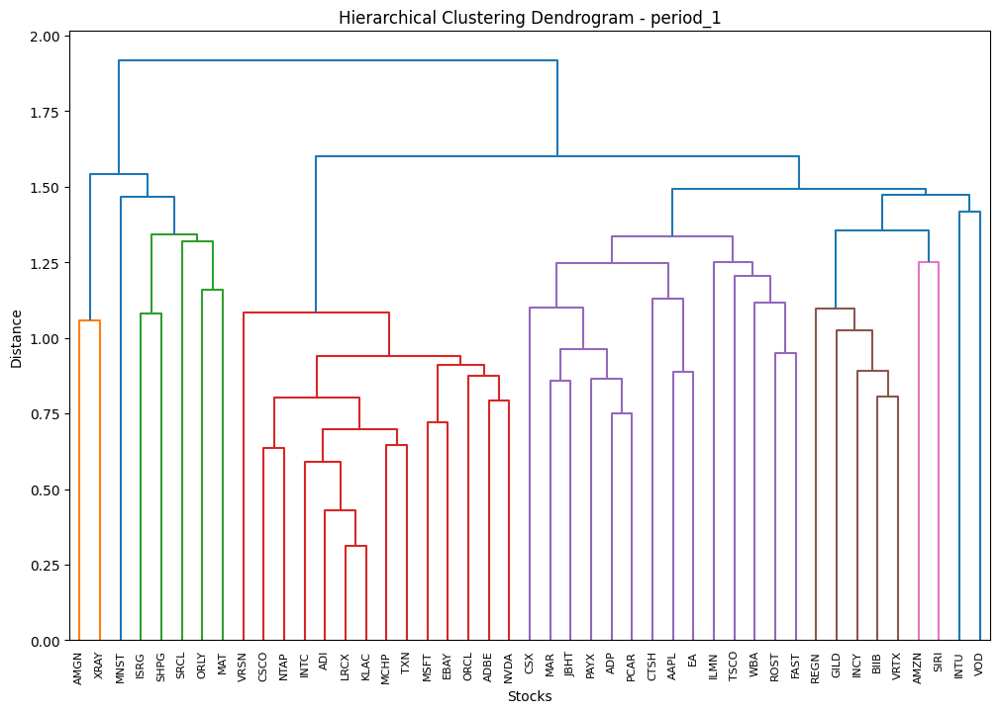

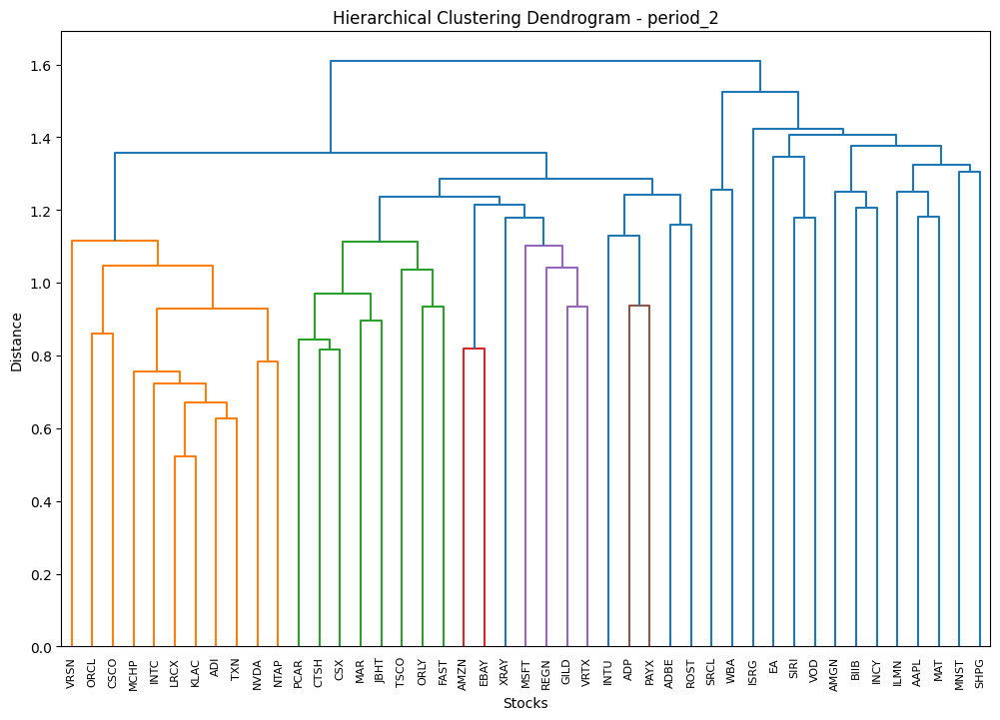

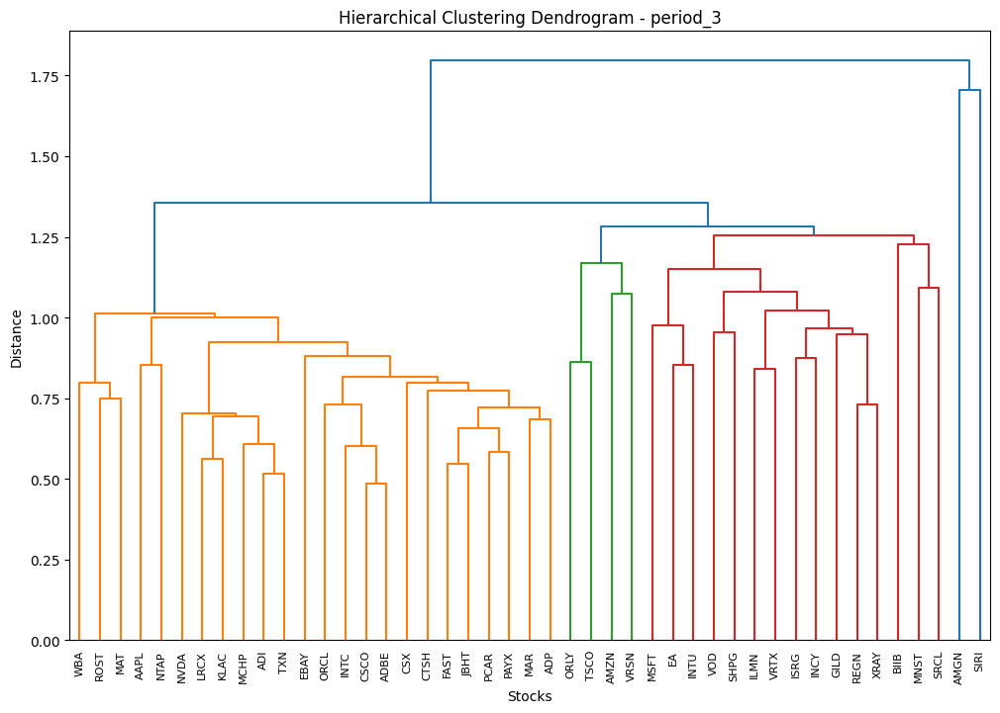

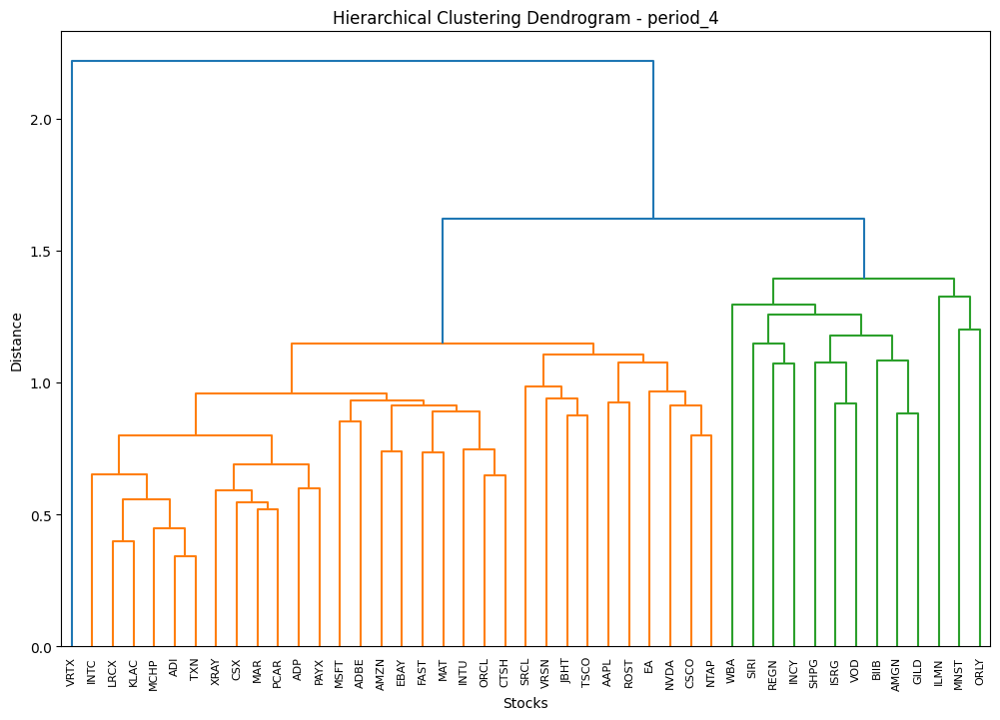

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.498523,0.061388,0.902974,0.380557,"[BIIB, ORCL, EA, ADI, ISRG, ORCL, SRCL, TXN, I..."
period_1 (4 stocks),0.796073,0.050118,1.660446,0.185766,"[INTU, ORCL, ROST, PAYX, GILD, ADI, TSCO, JBHT..."
period_1 (8 stocks),0.671292,0.043127,1.583088,0.202755,"[AAPL, EBAY, TXN, AMGN, INCY, SRCL, ROST, ADP,..."
period_2 (2 stocks),1.040827,0.035802,2.520555,0.235853,"[AMGN, GILD, MAT, ADP, AMGN, JBHT, WBA, AMZN, ..."
period_2 (4 stocks),0.887294,0.032985,2.556379,0.244372,"[VOD, MSFT, FAST, ADI, WBA, REGN, EBAY, INTU, ..."
period_2 (8 stocks),0.731130,0.024865,2.842223,0.187627,"[MAT, VRTX, XRAY, ADI, ORCL, MAR, SIRI, WBA, M..."
period_3 (2 stocks),0.238938,0.050965,0.455628,0.291040,"[INTC, INCY, ADP, VOD, ORCL, BIIB, MAR, GILD, ..."
period_3 (4 stocks),0.241855,0.043753,0.561974,0.321563,"[MAT, REGN, ADI, AMGN, AAPL, VRSN, CSCO, SRCL,..."
period_3 (8 stocks),0.095198,0.040771,0.229893,0.295416,"[EA, REGN, MCHP, PCAR, AMGN, BIIB, ORLY, SIRI,..."
period_4 (2 stocks),1.350605,0.035597,3.906437,0.333284,"[CTSH, ILMN, INTU, ILMN, CSX, ILMN, SRCL, VRTX..."


In [423]:
all_cluster_stocks_HCT_test = HCT(correlation_matrices_test)
result_df_HCT_test = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT_test, period_dfs_test)
result_df_HCT_test

In [424]:
all_cluster_stocks_kmeans_test, centroid_vectors_test = generate_clusters_and_centroids(periods, distance_matrices_test,custom_tickers_test)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [425]:
result_df_kmeans_rand_test = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans_test, period_dfs_test)
result_df_kmeans_rand_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.549132,0.060203,1.004135,0.381651,"[AAPL, GILD, KLAC, GILD, MSFT, FAST, INTC, INC..."
period_1 (4 stocks),0.575663,0.050911,1.245127,0.294602,"[SIRI, ADBE, AMGN, CTSH, SHPG, NTAP, GILD, PCA..."
period_1 (8 stocks),0.512217,0.046159,1.168578,0.230705,"[ILMN, AAPL, FAST, NTAP, ORLY, VOD, SIRI, REGN..."
period_2 (2 stocks),1.014608,0.037180,2.431441,0.177618,"[ADI, ROST, LRCX, MAT, CSCO, MNST, ADI, SRCL, ..."
period_2 (4 stocks),0.782114,0.030976,2.392204,0.146264,"[SIRI, INCY, WBA, ORCL, MSFT, INCY, ORLY, NTAP..."
period_2 (8 stocks),0.996285,0.027031,3.600219,0.221056,"[MAT, CSCO, EA, ISRG, AMGN, PCAR, VRSN, SIRI, ..."
period_3 (2 stocks),0.228286,0.050928,0.444962,0.609458,"[REGN, CSX, REGN, ADI, INCY, VRSN, GILD, NVDA,..."
period_3 (4 stocks),0.295073,0.044680,0.665076,0.373979,"[SHPG, SRCL, ADP, VOD, SIRI, INTU, JBHT, GILD,..."
period_3 (8 stocks),0.226843,0.041289,0.552204,0.354270,"[CSCO, VRTX, FAST, AMZN, TXN, ROST, MNST, EA, ..."
period_4 (2 stocks),1.152565,0.033510,3.406644,0.284770,"[NTAP, ORLY, MAR, VRTX, CTSH, ORLY, ADBE, EA, ..."


In [426]:
result_df_kmeans_test, stocks_by_period_kmeans_test = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans_test, period_dfs_test, centroid_vectors_test,distance_matrices_test)
result_df_kmeans_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.215358,0.081922,0.262882,0.300087,"[MSFT, ILMN]"
period_1 (4 stocks),0.463037,0.048472,0.955261,0.295580,"[ORLY, MSFT, INCY, JBHT]"
period_1 (8 stocks),0.908590,0.047710,1.904416,0.259322,"[ILMN, CTSH, JBHT, INTC, ORLY, VOD, EA, INCY]"
period_2 (2 stocks),0.465786,0.025783,1.806555,0.247714,"[PCAR, MAT]"
period_2 (4 stocks),0.685271,0.029888,2.292825,0.282969,"[MSFT, MAT, FAST, NVDA]"
period_2 (8 stocks),0.502725,0.021465,2.342118,0.225238,"[MAT, NVDA, MSFT, ADP, PAYX, FAST, SHPG, VOD]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ILMN, ROST]"
period_3 (4 stocks),0.677081,0.046861,1.444862,0.368352,"[ISRG, INTU, EBAY, ILMN]"
period_3 (8 stocks),0.282509,0.045092,0.626511,0.420322,"[ADP, ILMN, MAR, REGN, NVDA, ROST, MNST, INTU]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[AMZN, SHPG]"


In [427]:
count_of_stocks(result_df_random_test,custom_tickers_test)

TypeError: count_of_stocks() missing 1 required positional argument: 'experiment_name'

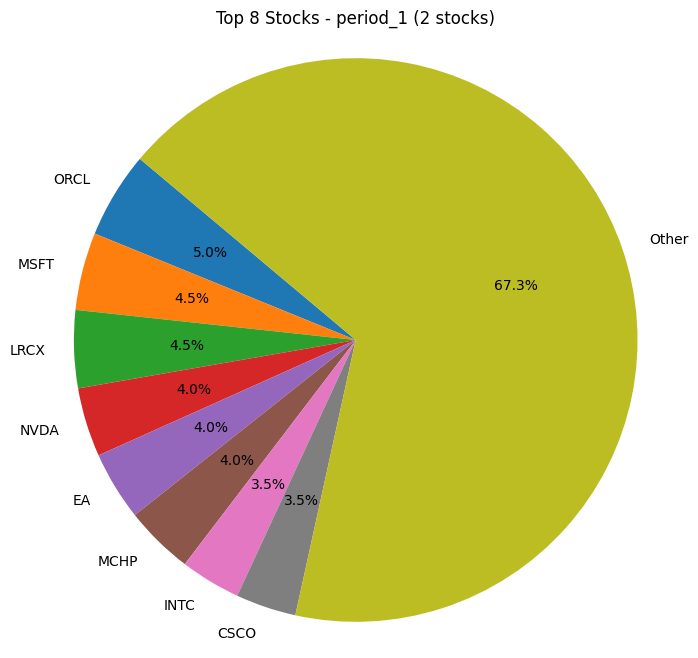

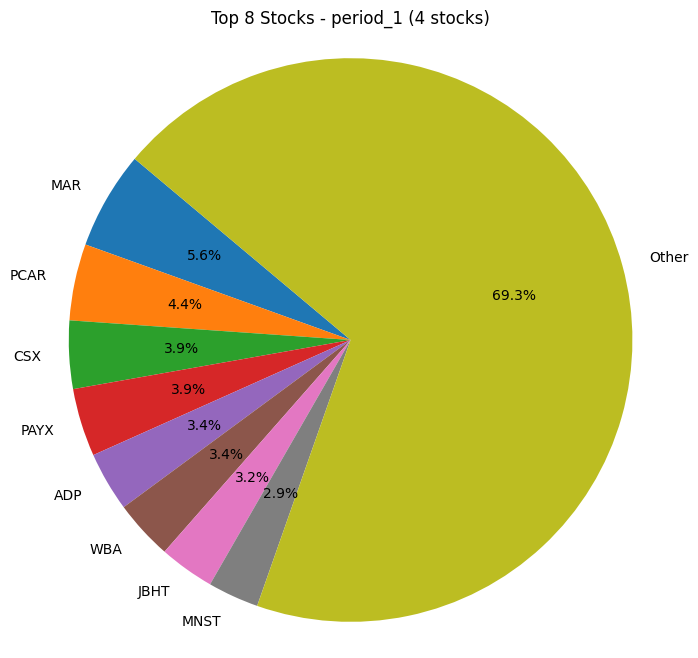

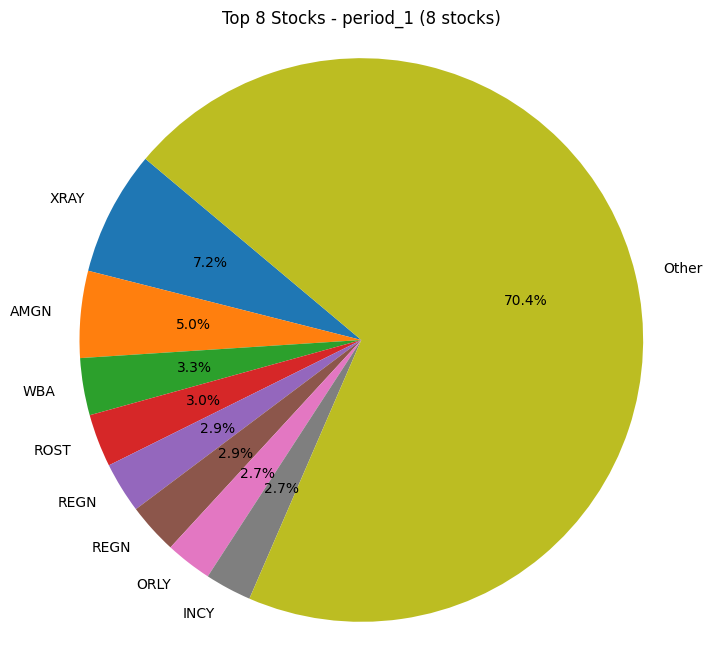

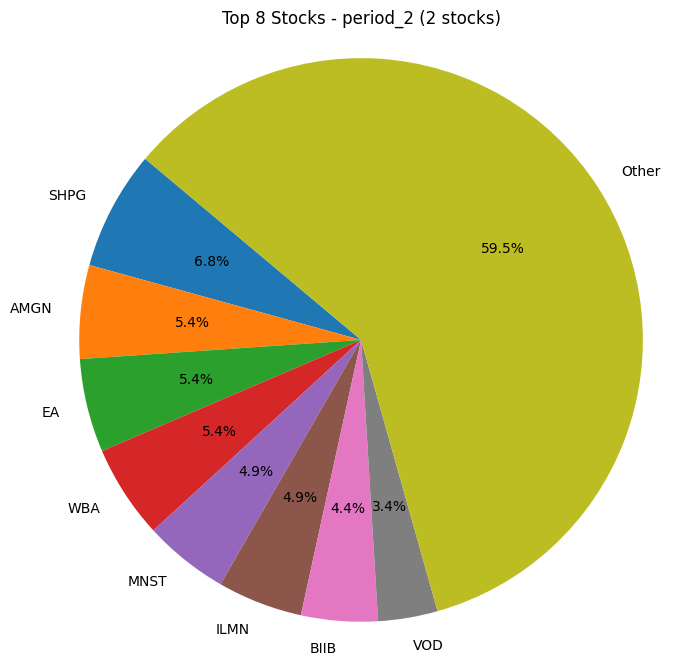

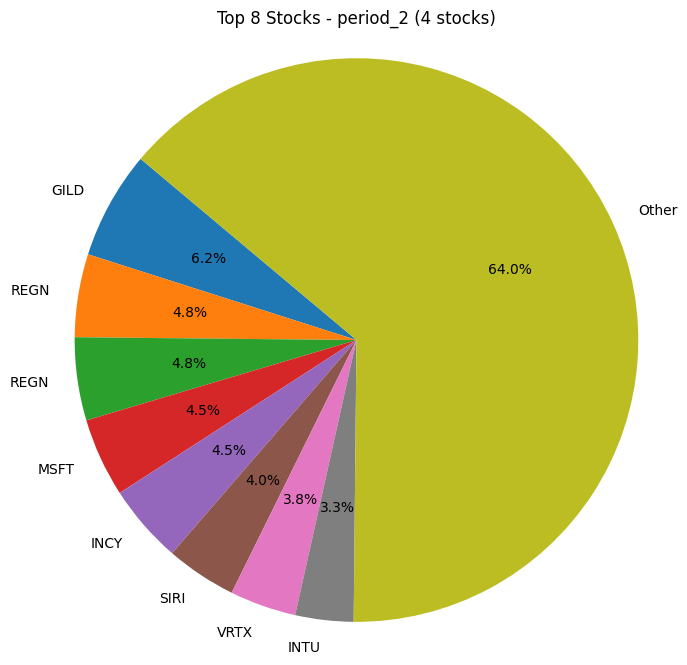

...

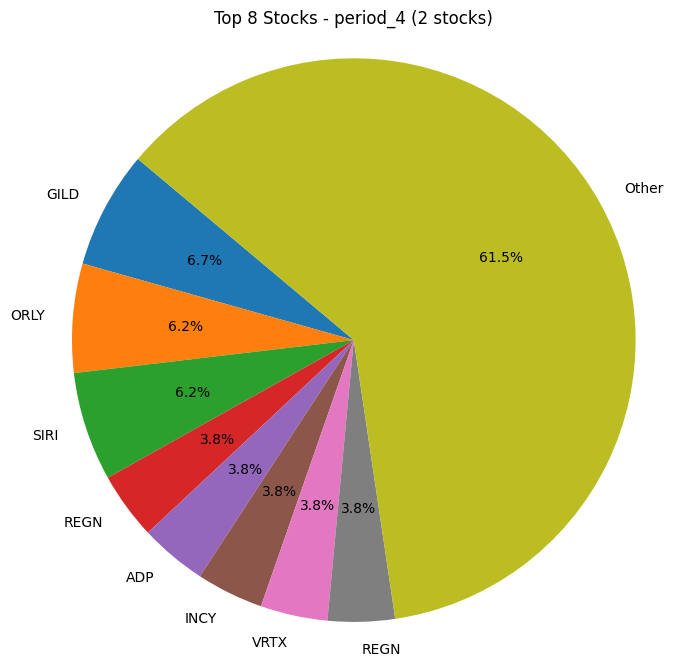

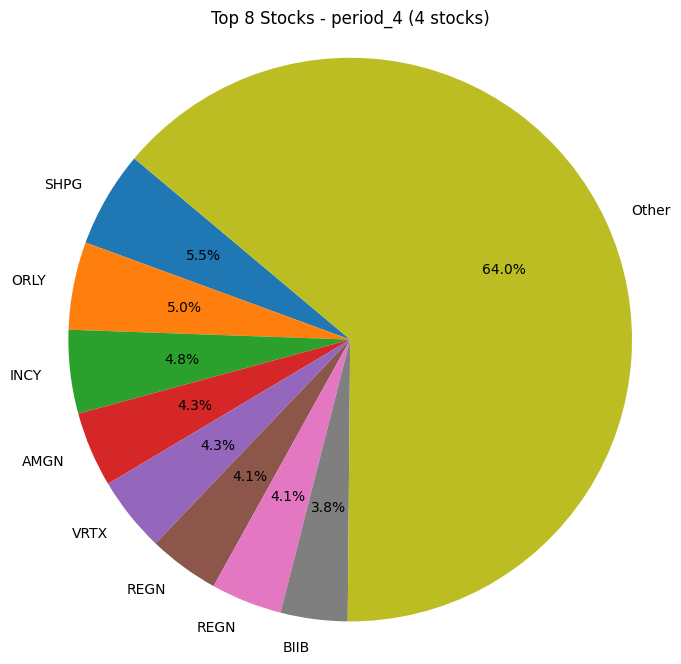

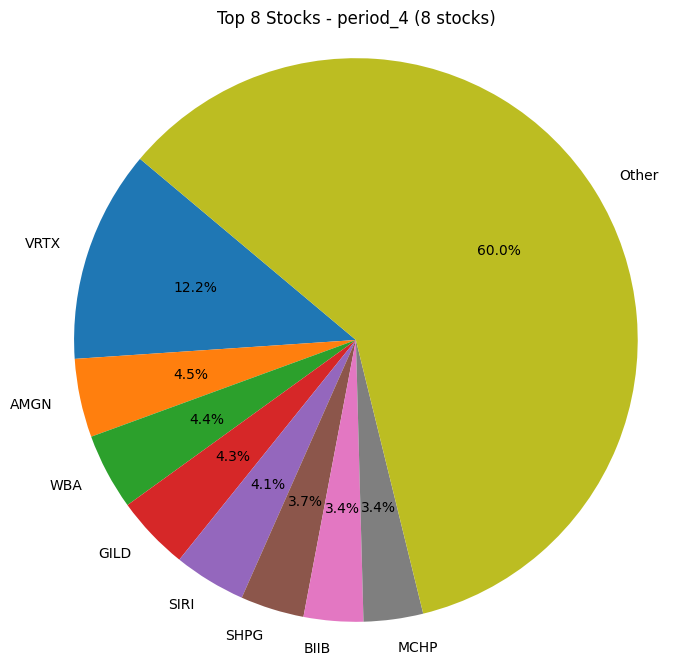

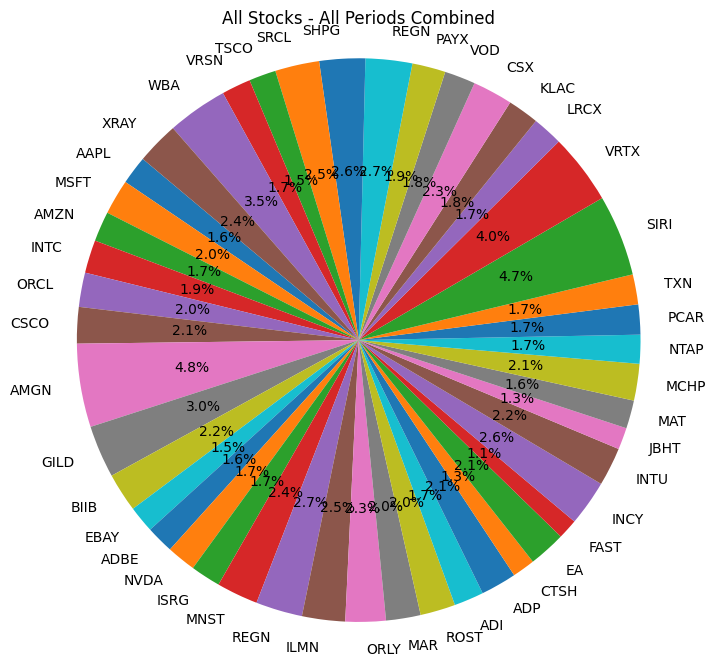

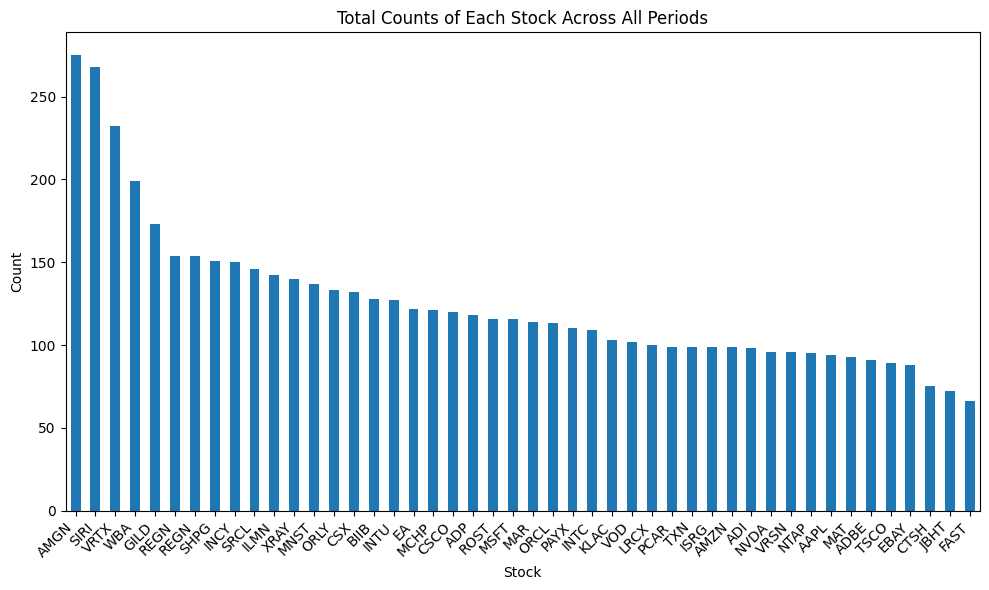

In [ ]:
count_of_stocks(result_df_HCT_test,custom_tickers_test)

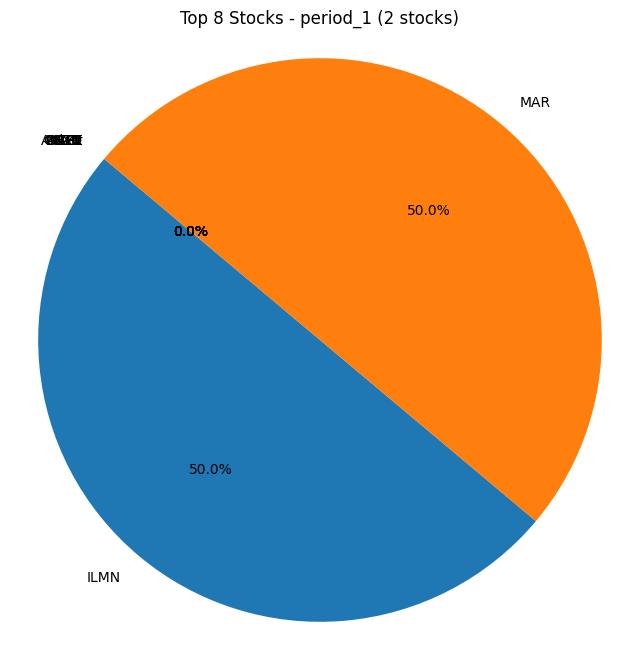

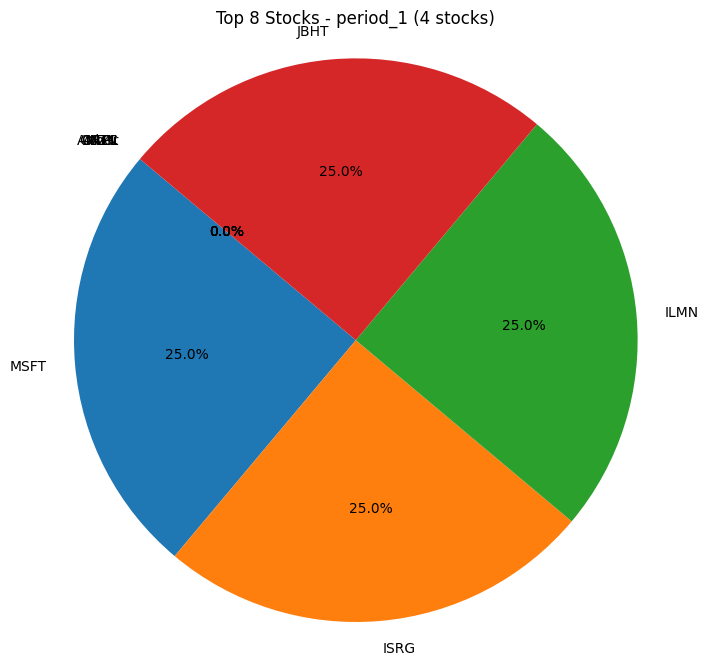

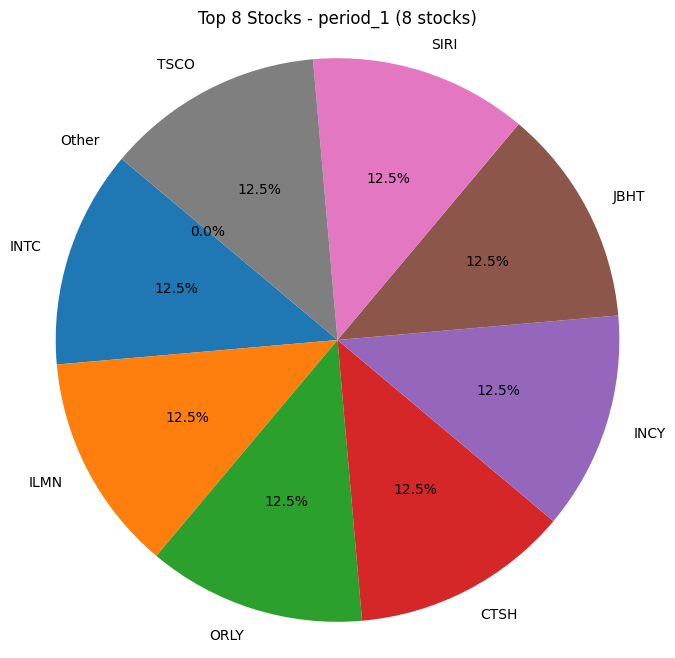

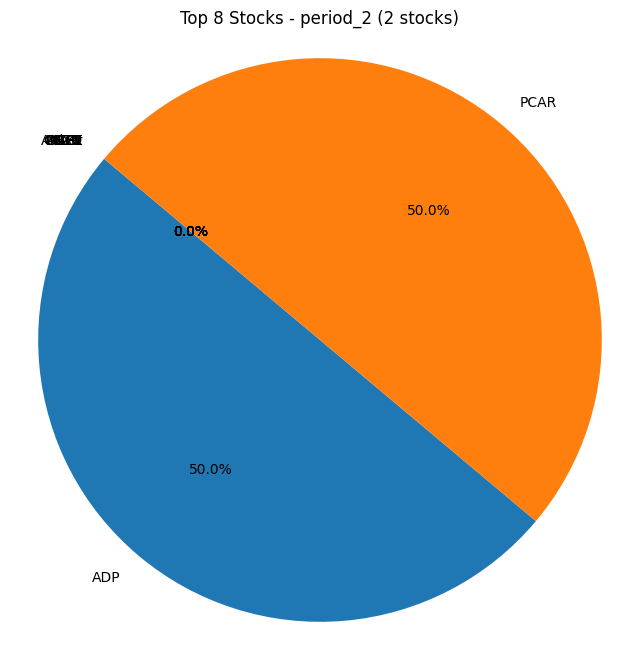

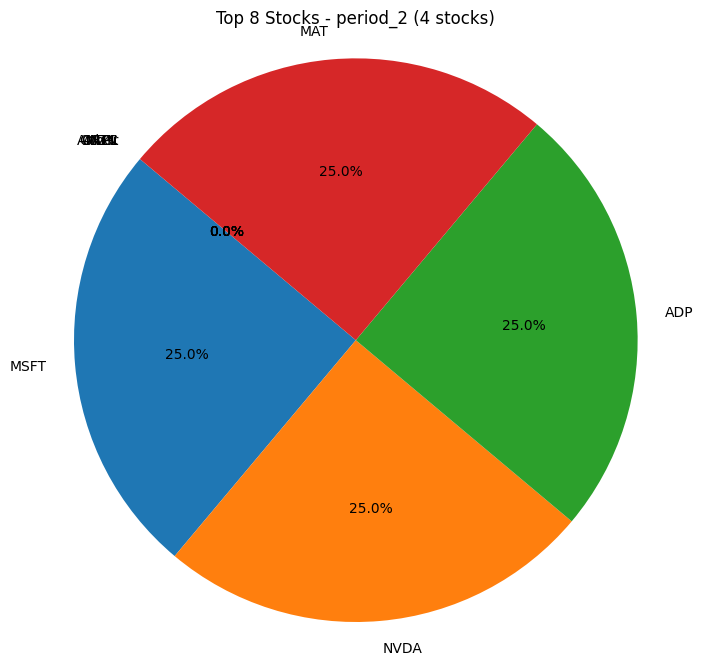

...

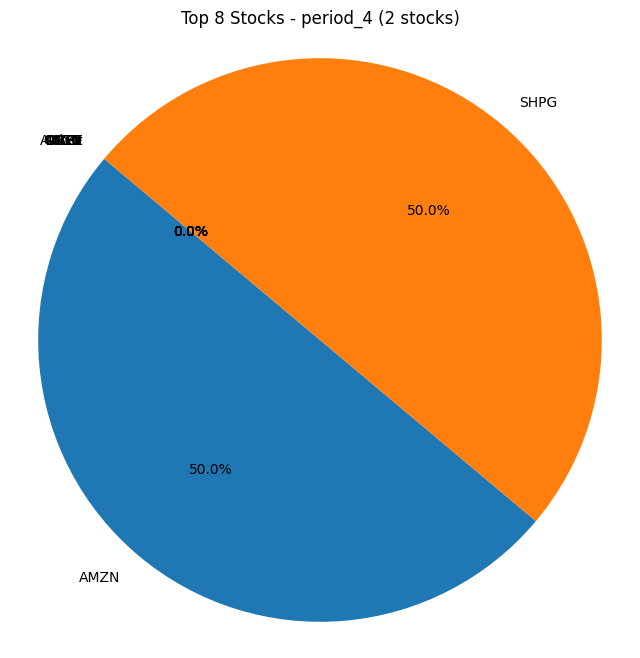

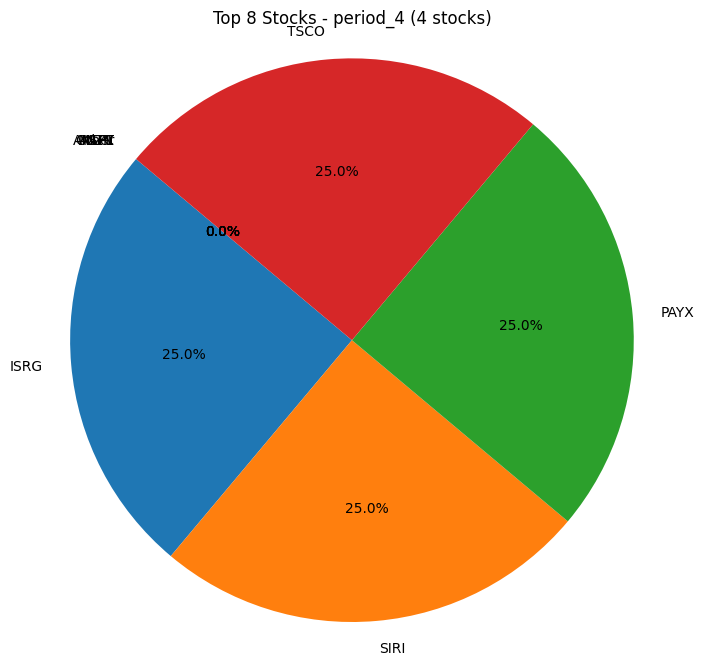

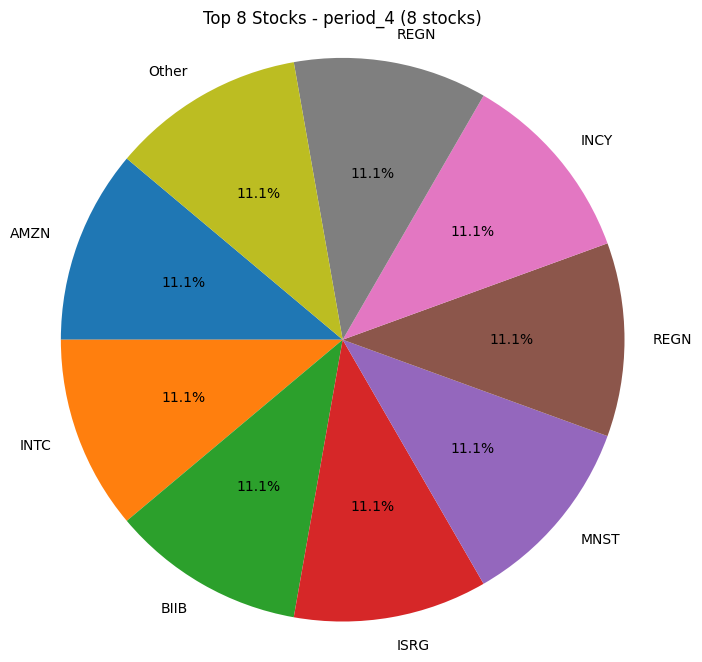

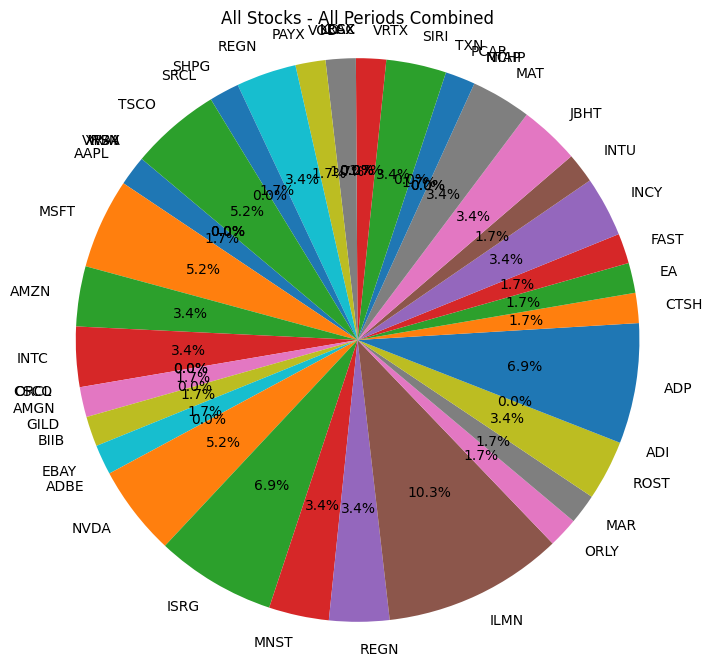

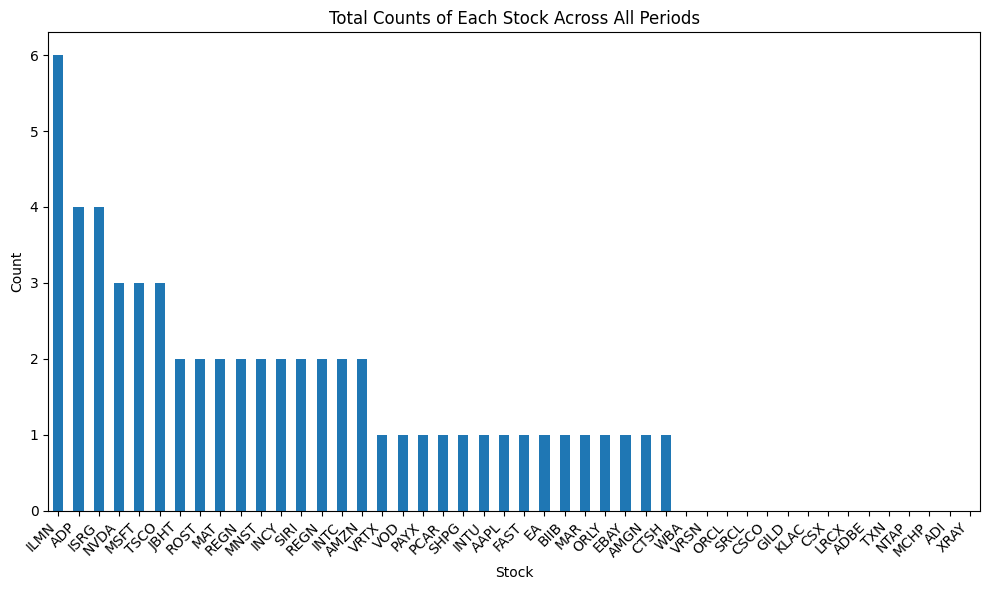

In [ ]:
count_of_stocks(result_df_kmeans_test,custom_tickers_test)

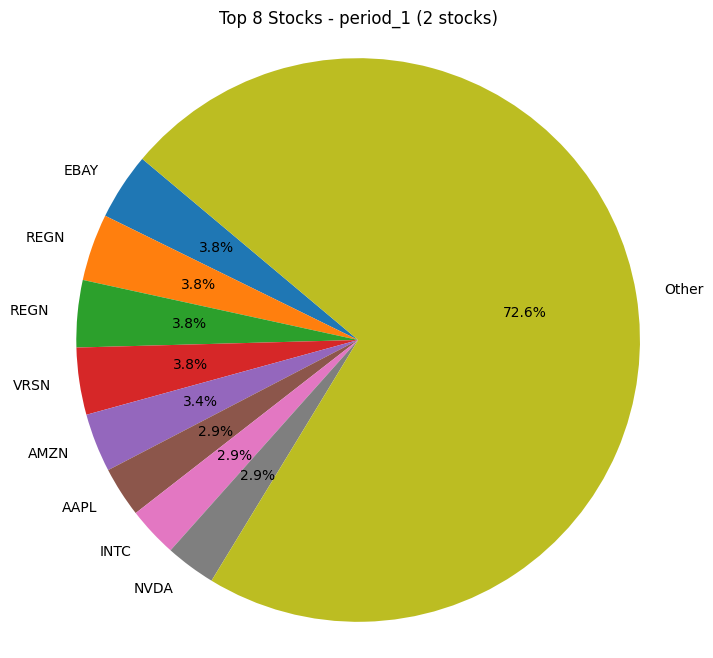

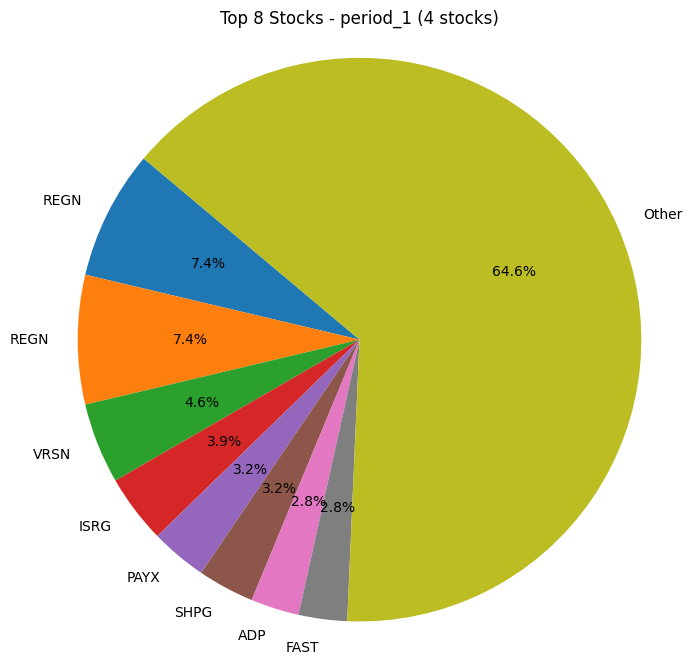

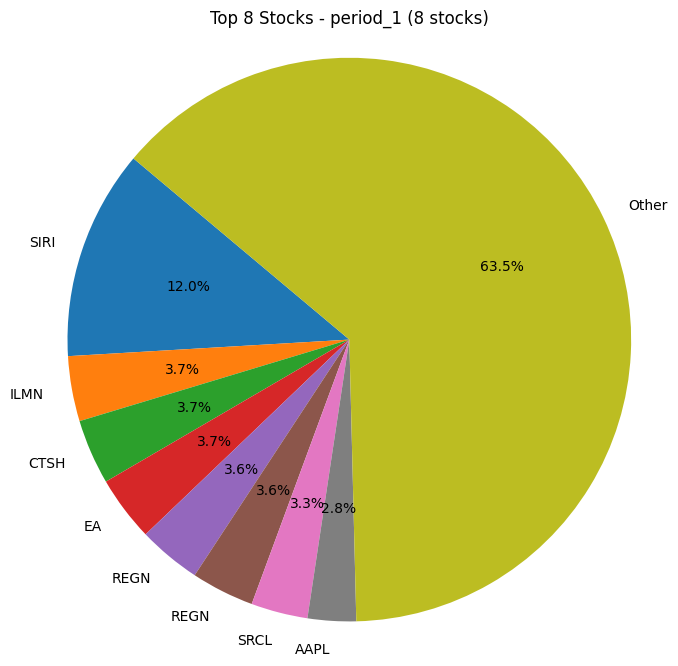

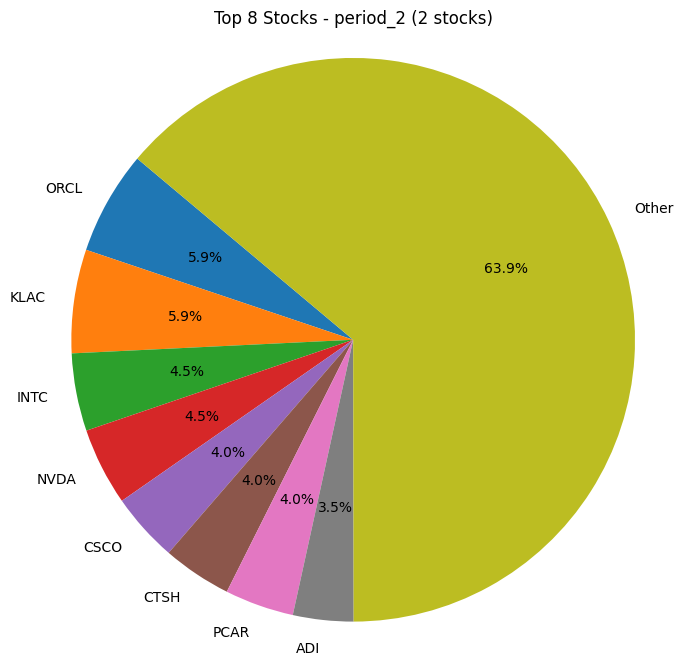

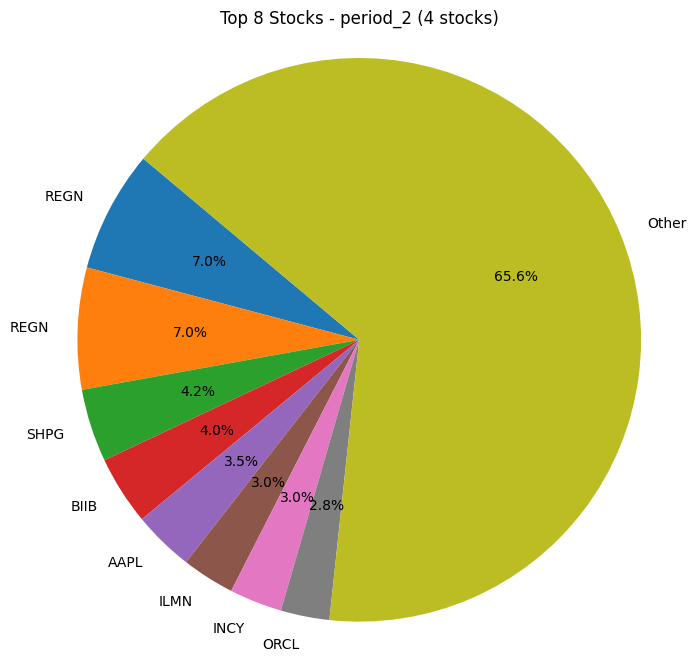

...

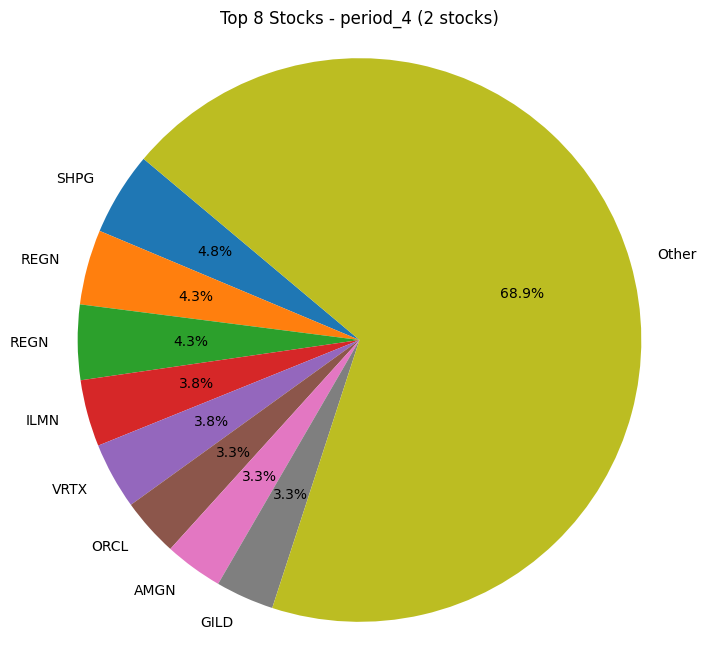

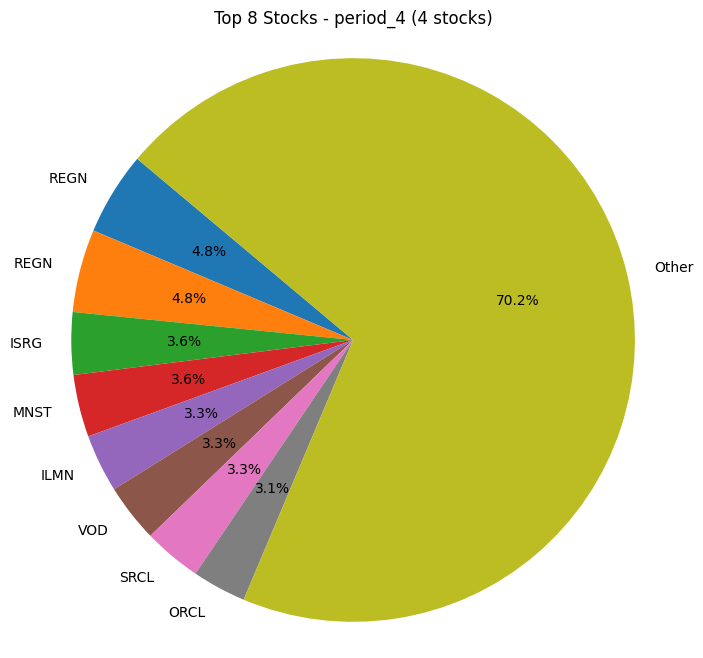

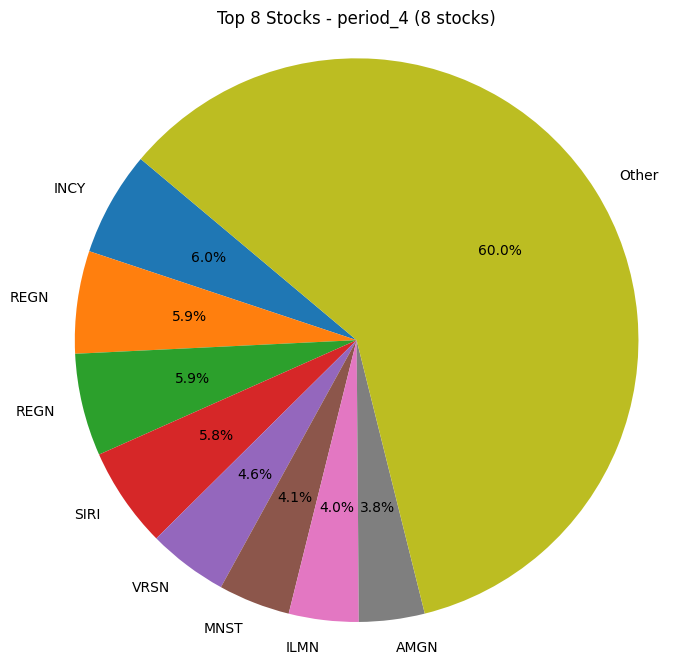

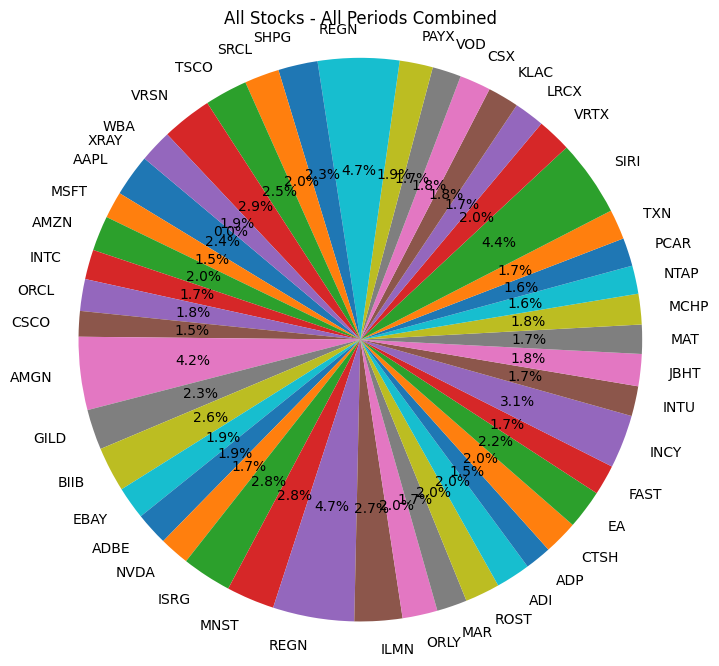

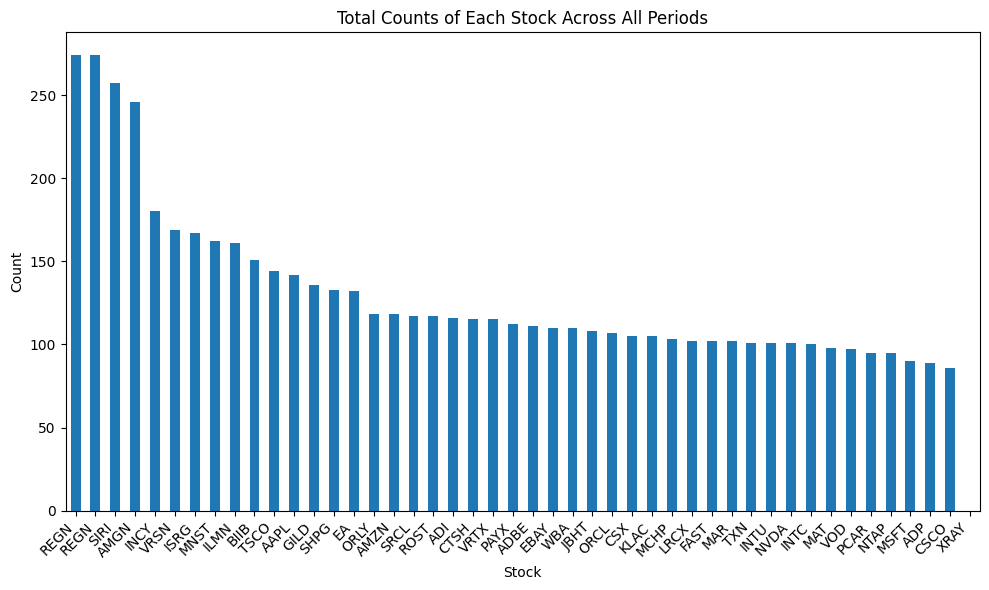

In [ ]:
count_of_stocks(result_df_kmeans_rand_test,custom_tickers_test)

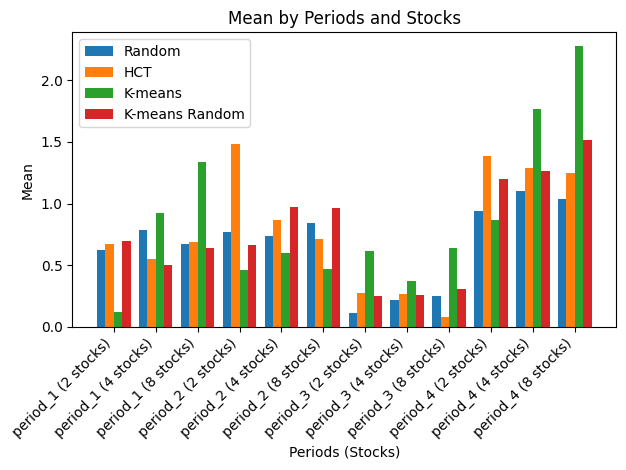

Total Average Mean of Random Values: 0.6753172162923514
Total Average Mean of Cluster Values: 0.7924239582892442
Total Average Mean of K-means Values: 0.8706744533325006
Total Average Mean of K-means Random Values: 0.7688877220060264

Period 1 Average Mean of Random Values: 0.6934134114068592
Period 1 Average Mean of Cluster Values: 0.6392891804163199
Period 1 Average Mean of K-means Values: 0.7941954983627905
Period 1 Average Mean of K-means Random Values: 0.611295894425576
Period 2 Average Mean of Random Values: 0.7834820116293617
Period 2 Average Mean of Cluster Values: 1.017907803184503
Period 2 Average Mean of K-means Values: 0.5117284264907999
Period 2 Average Mean of K-means Random Values: 0.8689324266356957
Period 3 Average Mean of Random Values: 0.19518569061573532
Period 3 Average Mean of Cluster Values: 0.20664224433739933
Period 3 Average Mean of K-means Values: 0.5407461456392261
Period 3 Average Mean of K-means Random Values: 0.2698027073455467


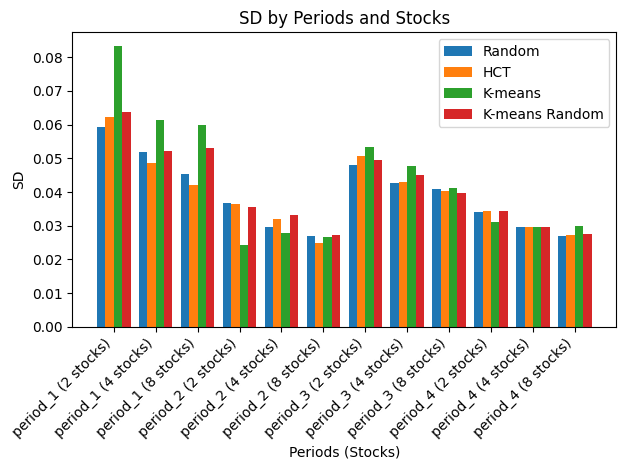

Total Average SD of Random Values: 0.03936480085341466
Total Average SD of Cluster Values: 0.039287170644134714
Total Average SD of K-means Values: 0.0430231426203641
Total Average SD of K-means Random Values: 0.04090516636360022

Period 1 Average SD of Random Values: 0.05227619864910523
Period 1 Average SD of Cluster Values: 0.05100299096995567
Period 1 Average SD of K-means Values: 0.06823529019807394
Period 1 Average SD of K-means Random Values: 0.05631018934800922
Period 2 Average SD of Random Values: 0.031073463648881337
Period 2 Average SD of Cluster Values: 0.03116087805679651
Period 2 Average SD of K-means Values: 0.026298493553294822
Period 2 Average SD of K-means Random Values: 0.03212153418516187
Period 3 Average SD of Random Values: 0.04383570796675095
Period 3 Average SD of Cluster Values: 0.04467652221094781
Period 3 Average SD of K-means Values: 0.04737572878455839
Period 3 Average SD of K-means Random Values: 0.04468098837111051


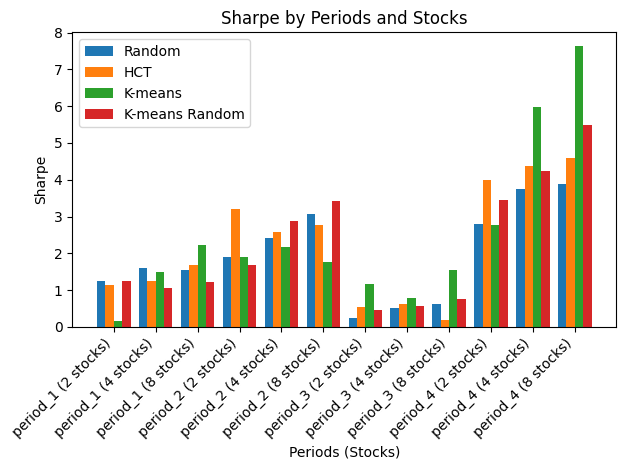

Total Average Sharpe of Random Values: 1.9606042083648394
Total Average Sharpe of Cluster Values: 2.2425421056465438
Total Average Sharpe of K-means Values: 2.463632981030717
Total Average Sharpe of K-means Random Values: 2.2085851048504943

Period 1 Average Sharpe of Random Values: 1.4632901915401948
Period 1 Average Sharpe of Cluster Values: 1.3479850571397574
Period 1 Average Sharpe of K-means Values: 1.2925953550151572
Period 1 Average Sharpe of K-means Random Values: 1.1717909404922395
Period 2 Average Sharpe of Random Values: 2.458024686513517
Period 2 Average Sharpe of Cluster Values: 2.8567315651453904
Period 2 Average Sharpe of K-means Values: 1.9415780265133147
Period 2 Average Sharpe of K-means Random Values: 2.663437520518148
Period 3 Average Sharpe of Random Values: 0.45066426406518206
Period 3 Average Sharpe of Cluster Values: 0.4491258469970892
Period 3 Average Sharpe of K-means Values: 1.1596332024742273
Period 3 Average Sharpe of K-means Random Values: 0.60589089521379

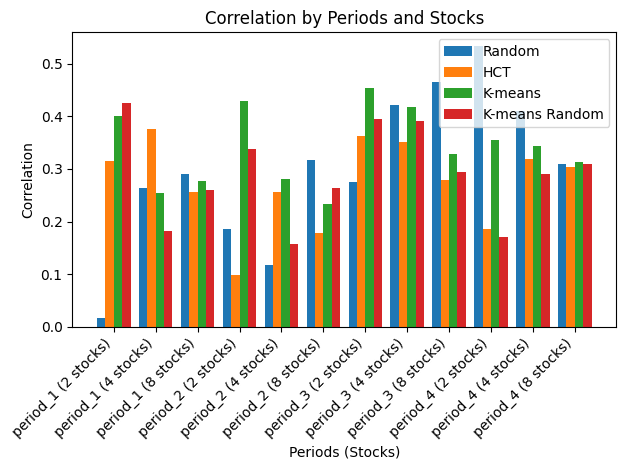

Total Average Correlation of Random Values: 0.3004777399132921
Total Average Correlation of Cluster Values: 0.27375953500989203
Total Average Correlation of K-means Values: 0.34064518053081566
Total Average Correlation of K-means Random Values: 0.28973957134331446

Period 1 Average Correlation of Random Values: 0.19044091452550438
Period 1 Average Correlation of Cluster Values: 0.3155397581543871
Period 1 Average Correlation of K-means Values: 0.3105145315127061
Period 1 Average Correlation of K-means Random Values: 0.2887856477285052
Period 2 Average Correlation of Random Values: 0.20675129067518871
Period 2 Average Correlation of Cluster Values: 0.17843979369718044
Period 2 Average Correlation of K-means Values: 0.314967007753322
Period 2 Average Correlation of K-means Random Values: 0.2533226037846821
Period 3 Average Correlation of Random Values: 0.3876022336859057
Period 3 Average Correlation of Cluster Values: 0.33104270526999346
Period 3 Average Correlation of K-means Values: 0.

In [ ]:
# Plotting Mean
plot_metric('Mean',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting SD
plot_metric('SD',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test,result_df_HCT_test,result_df_kmeans_test,result_df_kmeans_rand_test)

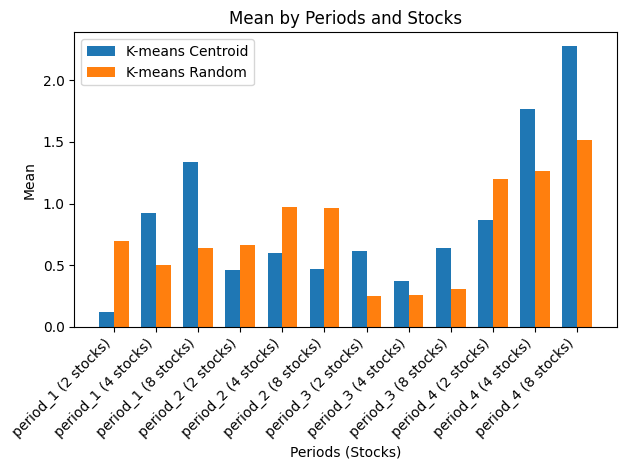

Total Average Mean of K-means Centroid Values: 0.8706744533325006
Total Average Mean of K-means Random Values: 0.7688877220060264

Period 1 Average Mean of K-means Centroid Values: 0.7941954983627905
Period 1 Average Mean of K-means Random Values: 0.611295894425576
Period 2 Average Mean of K-means Centroid Values: 0.5117284264907999
Period 2 Average Mean of K-means Random Values: 0.8689324266356957
Period 3 Average Mean of K-means Centroid Values: 0.5407461456392261
Period 3 Average Mean of K-means Random Values: 0.2698027073455467


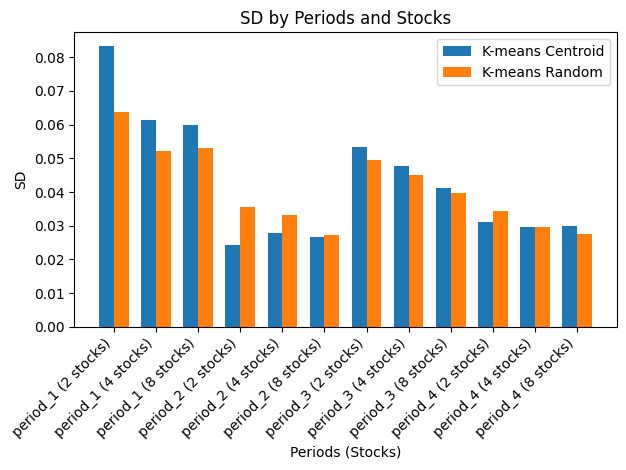

Total Average SD of K-means Centroid Values: 0.0430231426203641
Total Average SD of K-means Random Values: 0.04090516636360022

Period 1 Average SD of K-means Centroid Values: 0.06823529019807394
Period 1 Average SD of K-means Random Values: 0.05631018934800922
Period 2 Average SD of K-means Centroid Values: 0.026298493553294822
Period 2 Average SD of K-means Random Values: 0.03212153418516187
Period 3 Average SD of K-means Centroid Values: 0.04737572878455839
Period 3 Average SD of K-means Random Values: 0.04468098837111051


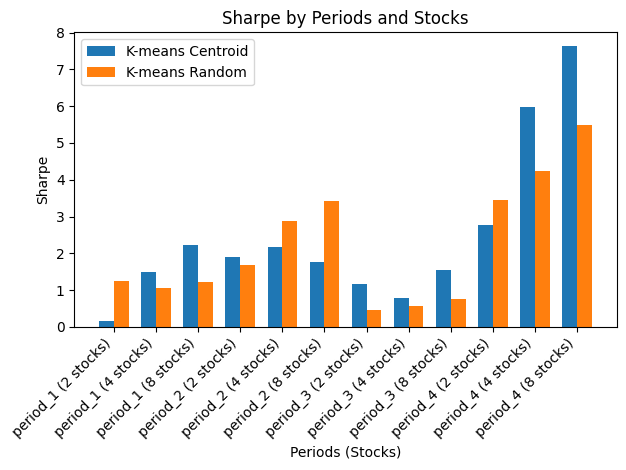

Total Average Sharpe of K-means Centroid Values: 2.463632981030717
Total Average Sharpe of K-means Random Values: 2.2085851048504943

Period 1 Average Sharpe of K-means Centroid Values: 1.2925953550151572
Period 1 Average Sharpe of K-means Random Values: 1.1717909404922395
Period 2 Average Sharpe of K-means Centroid Values: 1.9415780265133147
Period 2 Average Sharpe of K-means Random Values: 2.663437520518148
Period 3 Average Sharpe of K-means Centroid Values: 1.1596332024742273
Period 3 Average Sharpe of K-means Random Values: 0.6058908952137949


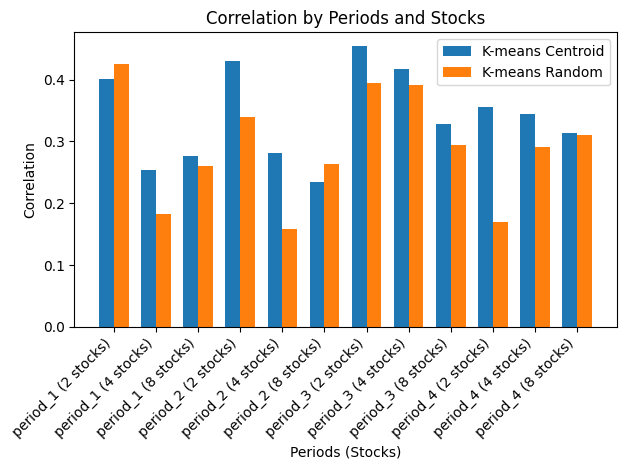

Total Average Correlation of K-means Centroid Values: 0.34064518053081566
Total Average Correlation of K-means Random Values: 0.28973957134331446

Period 1 Average Correlation of K-means Centroid Values: 0.3105145315127061
Period 1 Average Correlation of K-means Random Values: 0.2887856477285052
Period 2 Average Correlation of K-means Centroid Values: 0.314967007753322
Period 2 Average Correlation of K-means Random Values: 0.2533226037846821
Period 3 Average Correlation of K-means Centroid Values: 0.39983293268663433
Period 3 Average Correlation of K-means Random Values: 0.3598107385166829


In [ ]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test,result_df_kmeans_rand_test)

In [ ]:
############# Out of sampling testing: time ##############

In [ ]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [ ]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.241678,0.021878,1.163386,0.245861,"[AA, CCEP, RTX, CCEP, JNJ, MCD, MSFT, JNJ, VZ,..."
period_2 (4 stocks),0.250166,0.018189,1.412586,0.248187,"[MRK, INTC, TRV, AA, JNJ, TRV, AXP, T, JPM, TR..."
period_2 (8 stocks),0.252920,0.016039,1.593786,0.243866,"[WMT, DD, CVX, MSFT, HD, MMM, CAT, JNJ, IBM, J..."
period_3 (2 stocks),-0.026146,0.043353,-0.027864,0.498808,"[VZ, DIS, AXP, CVX, PFE, MSFT, RTX, AXP, AXP, ..."
period_3 (4 stocks),-0.002835,0.040080,0.008177,0.502647,"[TRV, XOM, T, CCEP, JNJ, RTX, MSFT, MRK, VZ, A..."
period_3 (8 stocks),0.008229,0.037767,0.028591,0.501178,"[CAT, JPM, GE, WMT, MCD, INTC, AA, PG, MSFT, H..."
period_4 (2 stocks),0.437802,0.026878,1.791739,0.486938,"[MRK, HPQ, AXP, VZ, PFE, GE, CAT, JNJ, GE, AA,..."
period_4 (4 stocks),0.431008,0.024567,1.846613,0.484428,"[PG, INTC, HD, WMT, MSFT, DIS, HPQ, PFE, JNJ, ..."
period_4 (8 stocks),0.425528,0.023559,1.853174,0.487766,"[DD, XOM, AXP, VZ, JNJ, WMT, MMM, MRK, PFE, BA..."


In [ ]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [ ]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.227042,0.020999,1.156117,0.176825,"[MRK, CVX, MRK, MSFT, T, MMM, MRK, CAT, JNJ, J..."
period_2 (4 stocks),0.211021,0.017471,1.243383,0.187956,"[PFE, DD, VZ, HPQ, JNJ, CVX, T, IBM, PFE, AXP,..."
period_2 (8 stocks),0.268396,0.014876,1.826186,0.197064,"[PG, WMT, MCD, VZ, MSFT, GE, DD, CCEP, JNJ, WM..."
period_3 (2 stocks),-0.009692,0.040095,-0.004918,0.480954,"[MRK, GE, PFE, MCD, CCEP, AXP, XOM, DD, PG, RT..."
period_3 (4 stocks),0.008188,0.037495,0.031757,0.496780,"[MRK, CVX, CAT, T, JNJ, CVX, DIS, HPQ, PFE, XO..."
period_3 (8 stocks),0.028406,0.033904,0.088772,0.509732,"[PG, PFE, CVX, DIS, T, GE, BA, CCEP, PG, MRK, ..."
period_4 (2 stocks),0.436854,0.026219,1.772562,0.450080,"[T, DD, VZ, RTX, MSFT, JPM, WMT, CAT, CVX, HD,..."
period_4 (4 stocks),0.424279,0.025193,1.724072,0.502015,"[TRV, CVX, CAT, JPM, TRV, CVX, IBM, GE, PFE, V..."
period_4 (8 stocks),0.478793,0.021945,2.208157,0.478457,"[PG, XOM, WMT, VZ, CCEP, TRV, DIS, DD, PFE, CV..."


In [ ]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.234669,0.020762,1.206930,0.178847,"[AA, T, AA, VZ, AXP, PG, MSFT, JNJ, WMT, JNJ, ..."
period_2 (4 stocks),0.239406,0.017340,1.422585,0.202206,"[DD, HPQ, PG, VZ, BA, IBM, PFE, MCD, CVX, IBM,..."
period_2 (8 stocks),0.249284,0.014365,1.761489,0.179552,"[MMM, IBM, T, AXP, CCEP, MRK, MCD, WMT, CVX, M..."
period_3 (2 stocks),-0.025724,0.040901,-0.041138,0.480801,"[GE, CCEP, CAT, XOM, CAT, JNJ, RTX, PFE, GE, C..."
period_3 (4 stocks),0.007041,0.037130,0.033119,0.499026,"[XOM, IBM, WMT, CCEP, XOM, BA, HPQ, CCEP, XOM,..."
period_3 (8 stocks),0.027464,0.034446,0.083189,0.508535,"[CCEP, DD, XOM, JNJ, VZ, PG, JPM, MMM, CCEP, M..."
period_4 (2 stocks),0.437291,0.025930,1.785472,0.437571,"[VZ, BA, TRV, HD, MRK, AA, PG, CCEP, XOM, DD, ..."
period_4 (4 stocks),0.494131,0.024338,2.087869,0.477804,"[IBM, JNJ, TRV, HD, DIS, MSFT, XOM, AXP, RTX, ..."
period_4 (8 stocks),0.444447,0.023785,1.884310,0.494417,"[DD, VZ, DIS, MSFT, MRK, AXP, CVX, MCD, DD, T,..."


In [ ]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [ ]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),-0.062222,0.024382,-0.255193,0.150983,"[WMT, MRK]"
period_2 (4 stocks),0.330144,0.016778,1.967776,0.167622,"[GE, DIS, MRK, MCD]"
period_2 (8 stocks),0.230732,0.014030,1.644535,0.166317,"[MMM, HPQ, T, GE, CCEP, MRK, MCD, WMT]"
period_3 (2 stocks),-0.152147,0.038371,-0.396513,0.452278,"[TRV, PFE]"
period_3 (4 stocks),-0.118939,0.034844,-0.341347,0.448383,"[XOM, TRV, HD, PFE]"
period_3 (8 stocks),-0.030560,0.032367,-0.094418,0.502617,"[CCEP, HD, XOM, PFE, VZ, PG, TRV, MMM]"
period_4 (2 stocks),0.762271,0.027727,2.749165,0.232697,"[PFE, CCEP]"
period_4 (4 stocks),1.099584,0.024861,4.422877,0.398478,"[DIS, PFE, CCEP, HD]"
period_4 (8 stocks),0.662594,0.024142,2.744514,0.452874,"[DD, VZ, DIS, INTC, CCEP, AXP, CVX, MCD]"


In [ ]:
count_of_stocks(result_df_random_test1)

TypeError: count_of_stocks() missing 1 required positional argument: 'custom_tickers'

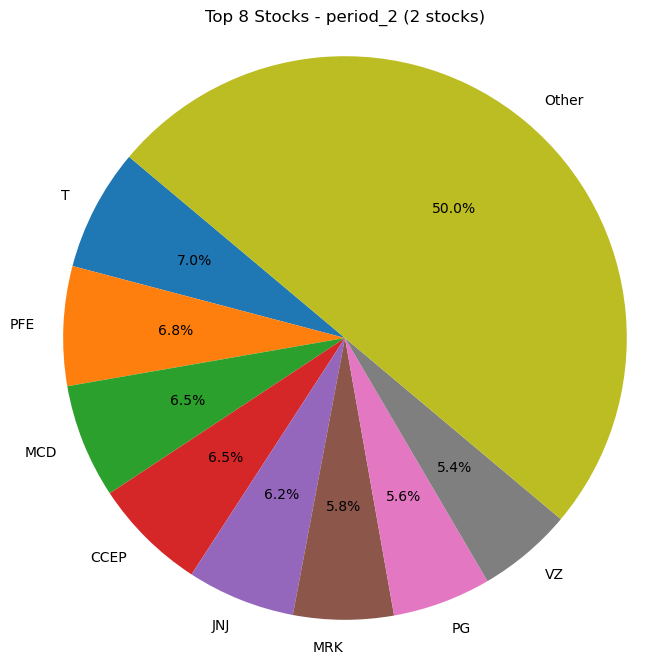

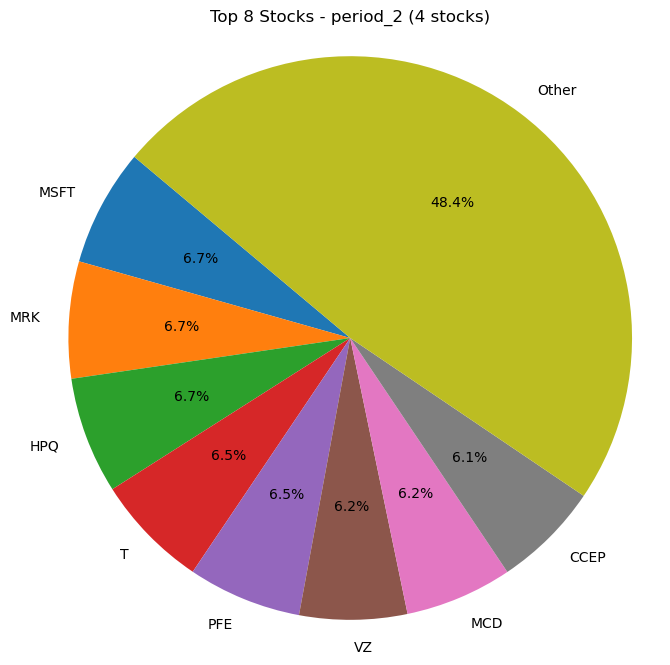

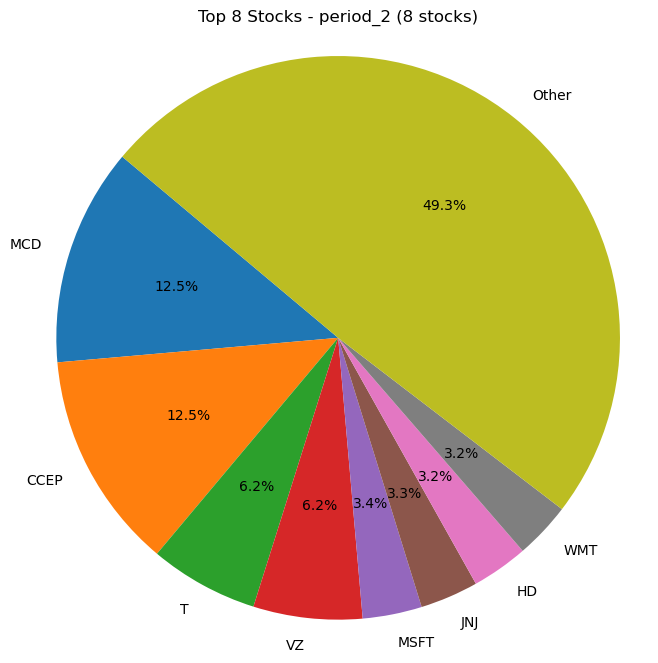

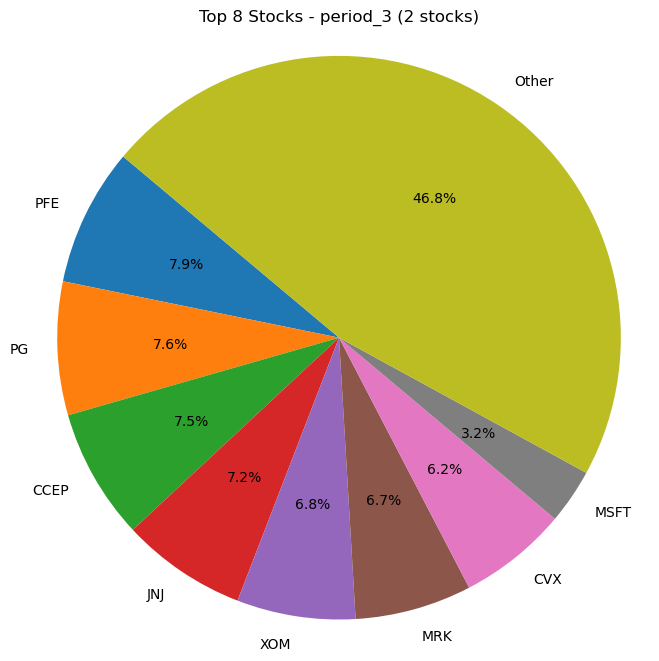

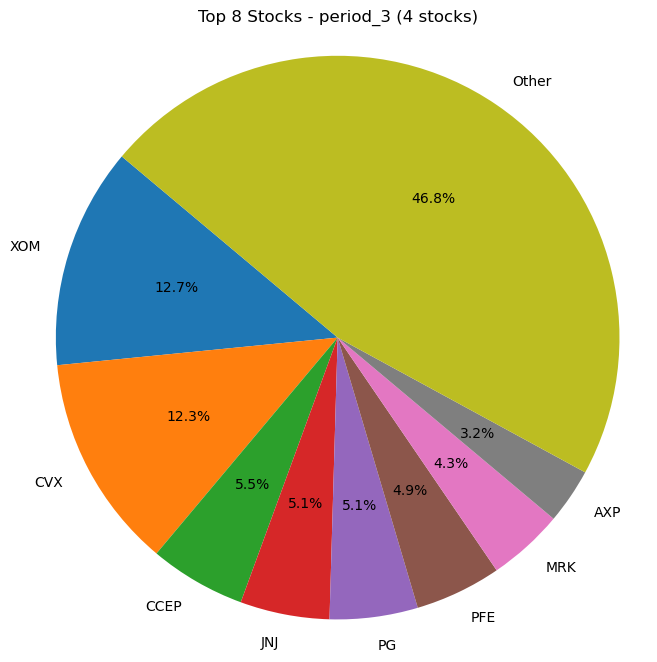

...

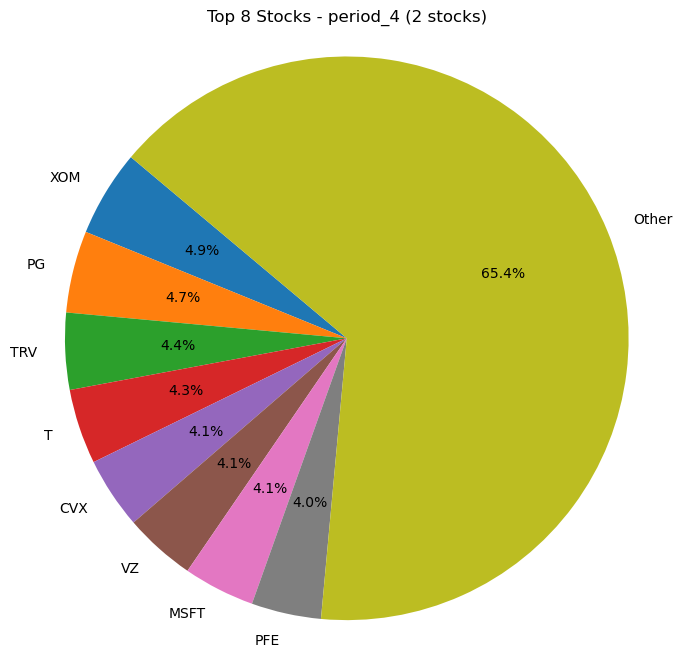

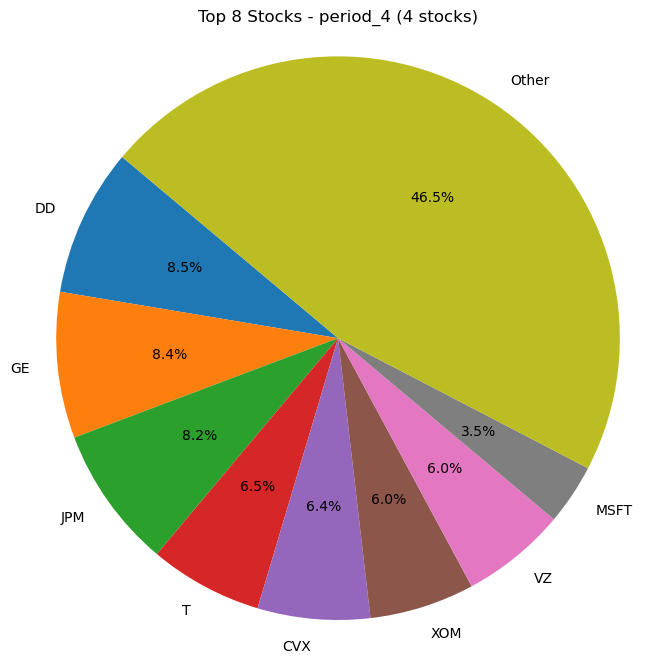

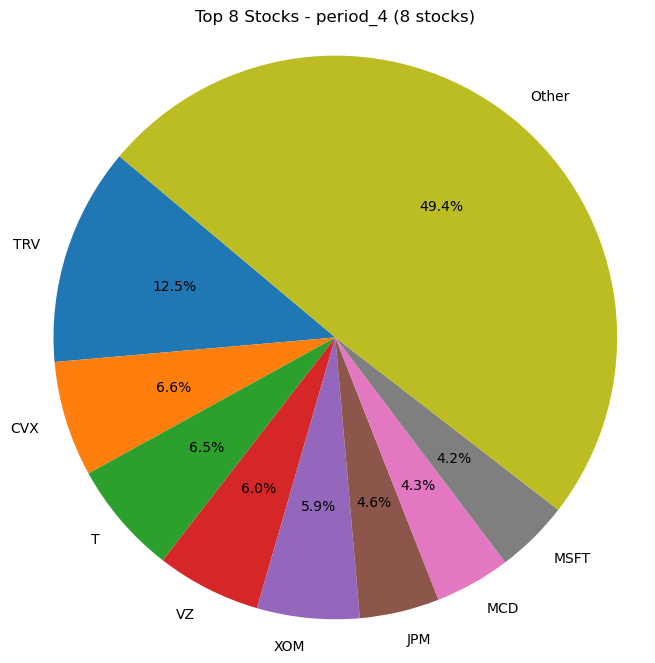

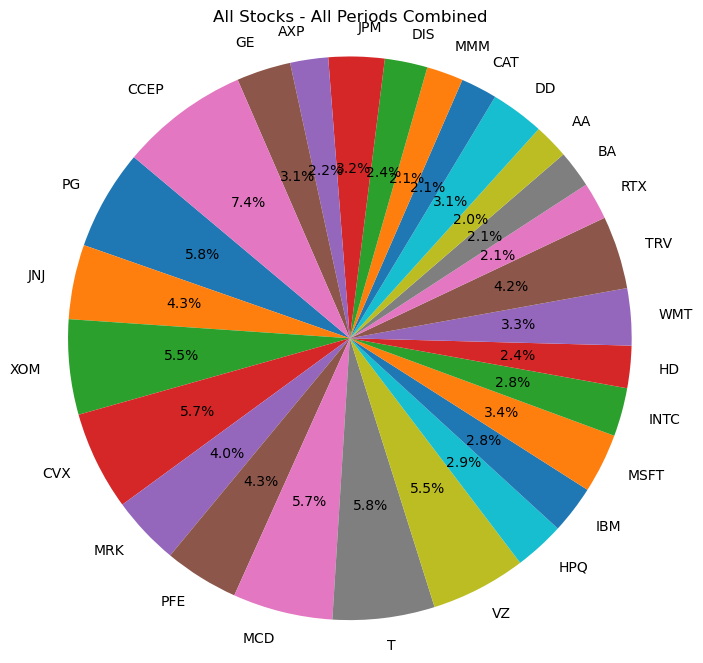

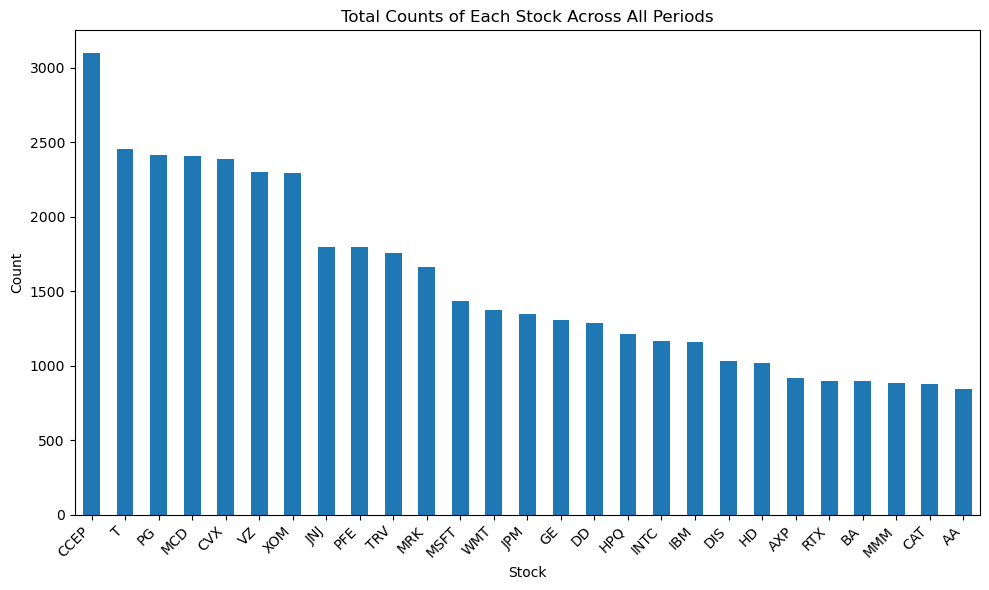

In [ ]:
count_of_stocks(result_df_HCT_test1)

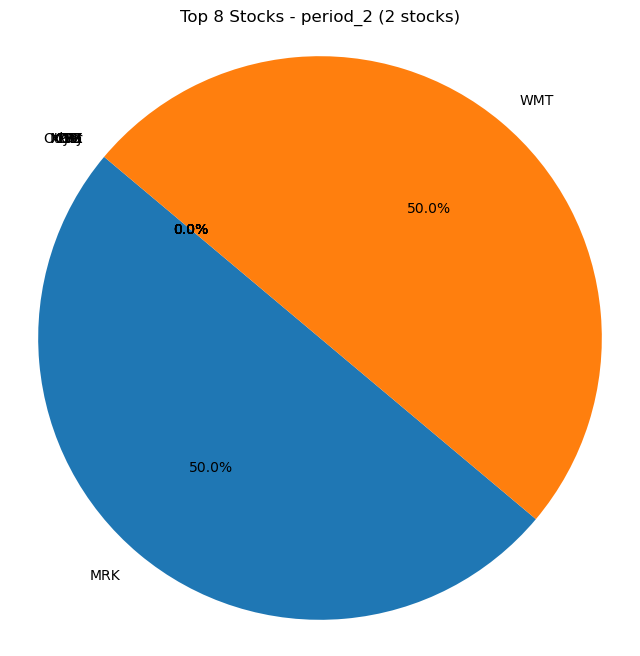

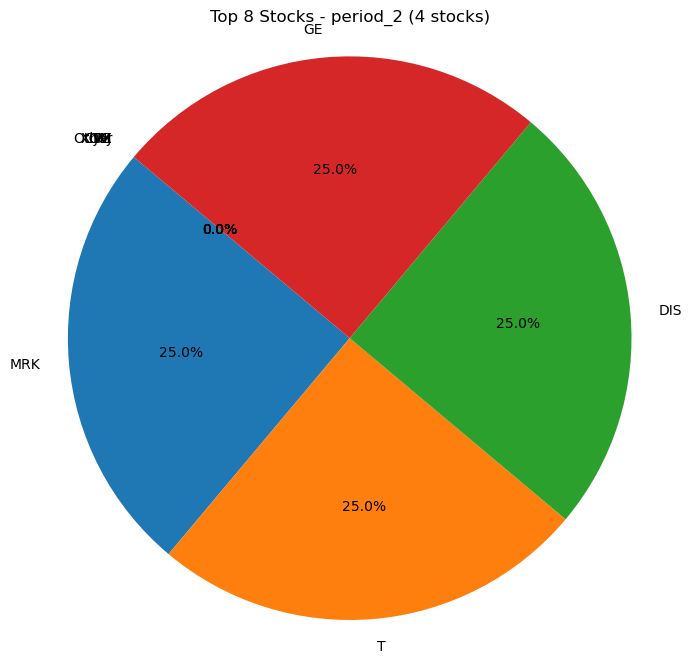

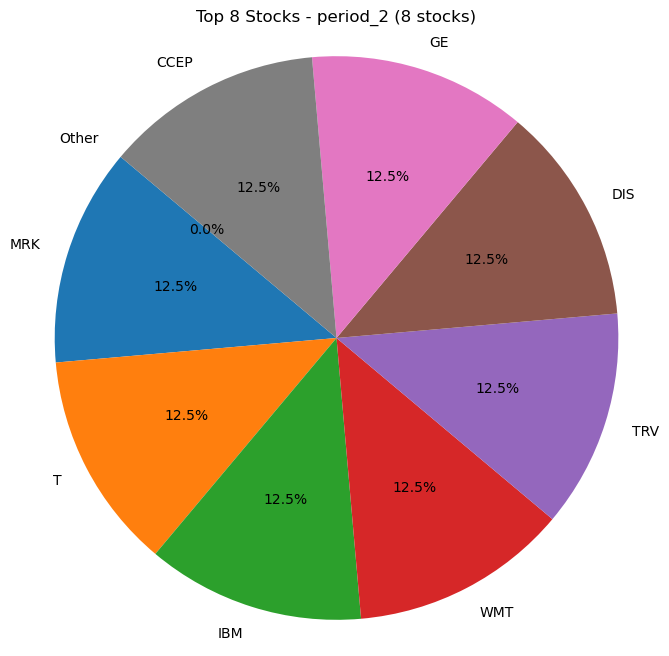

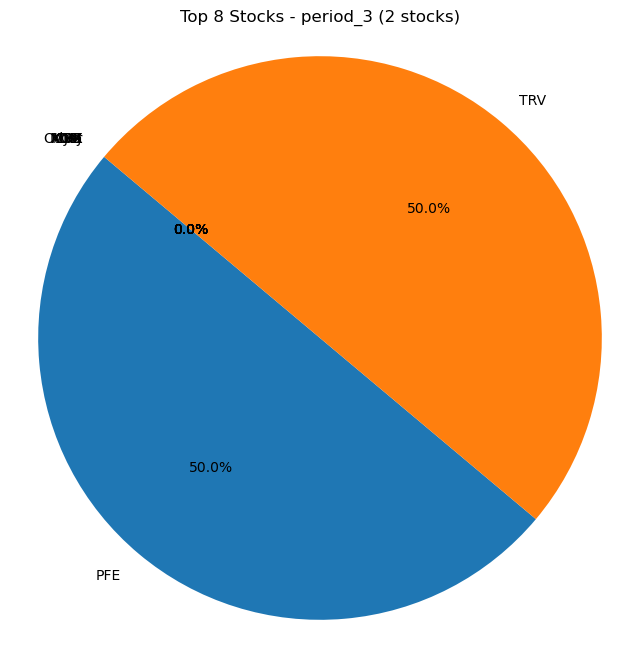

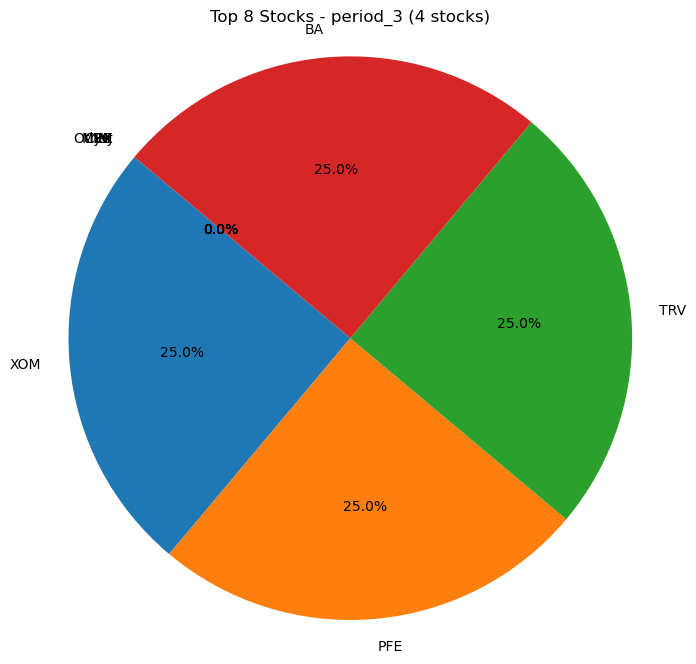

...

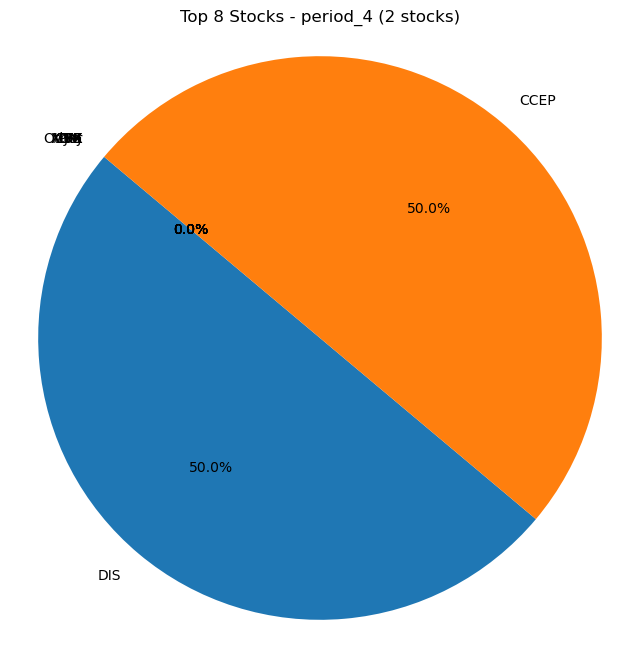

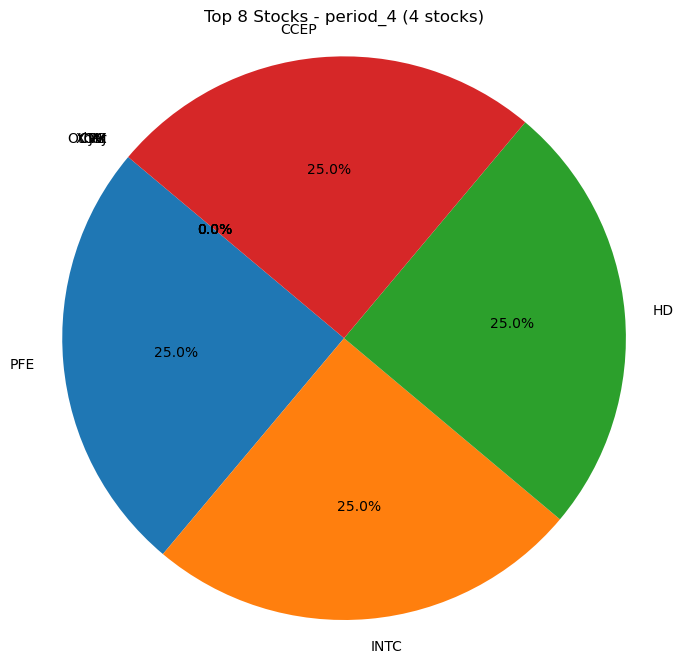

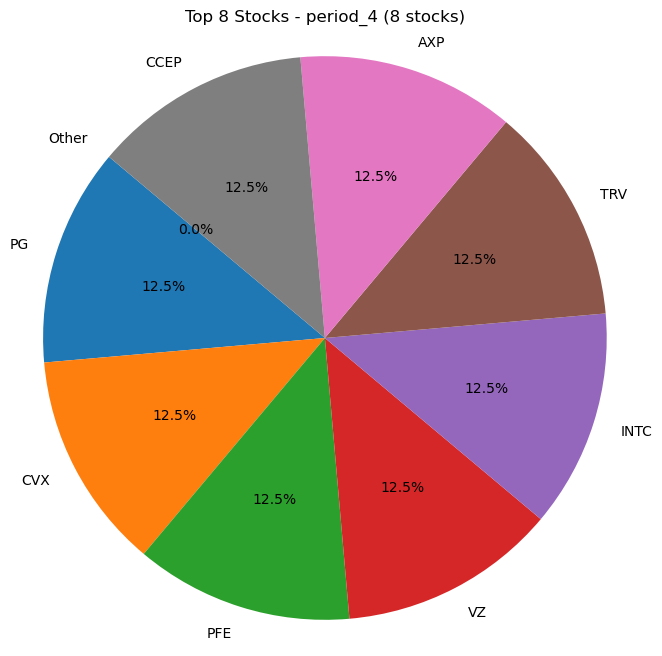

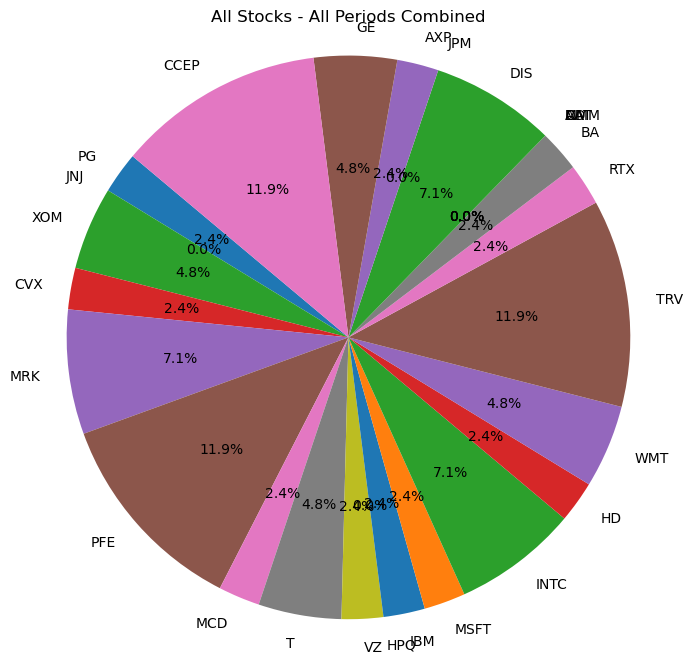

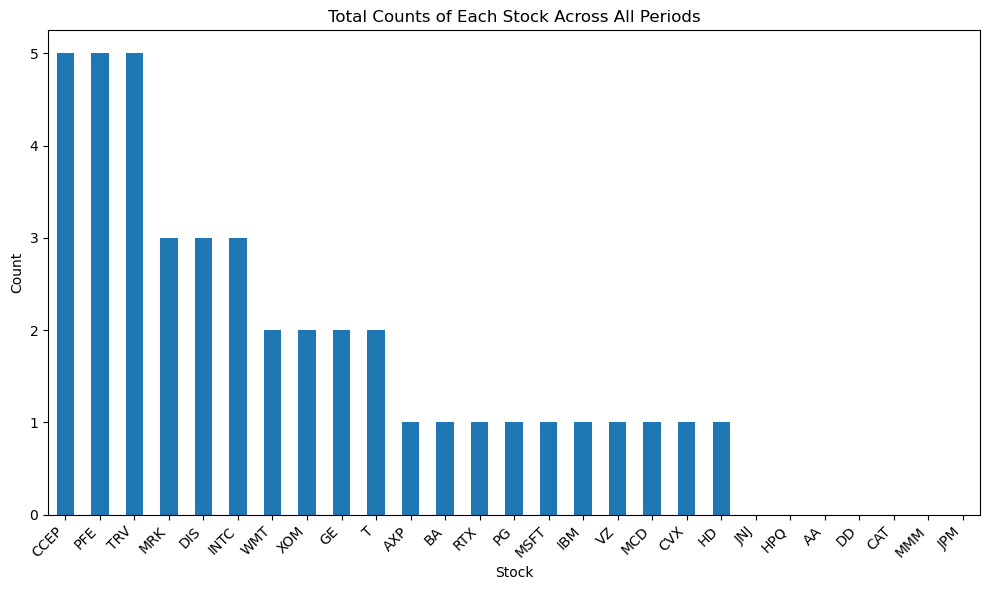

In [ ]:
count_of_stocks(result_df_kmeans_test1)

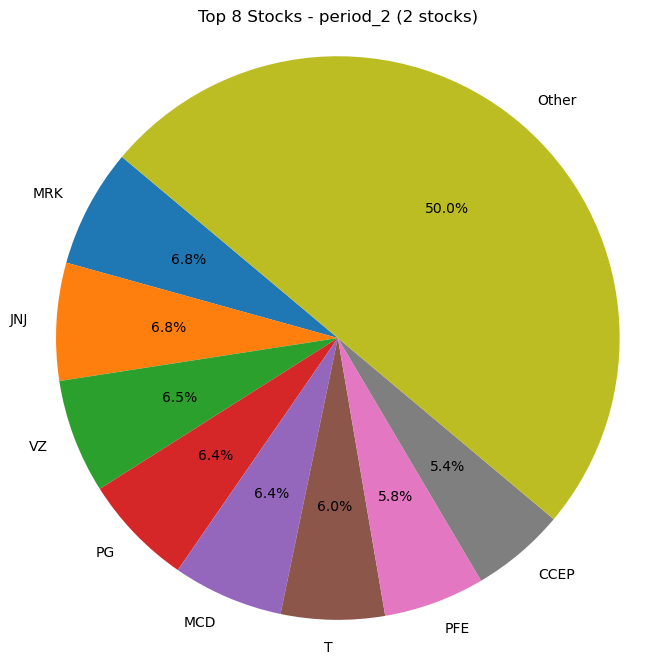

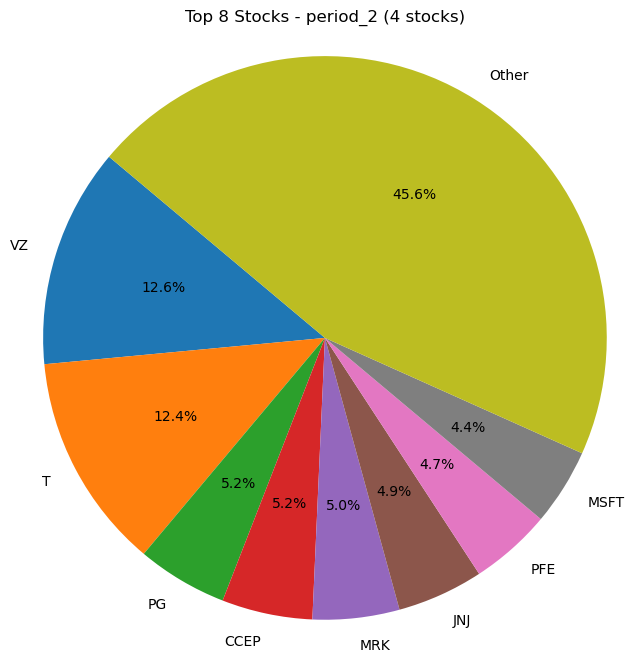

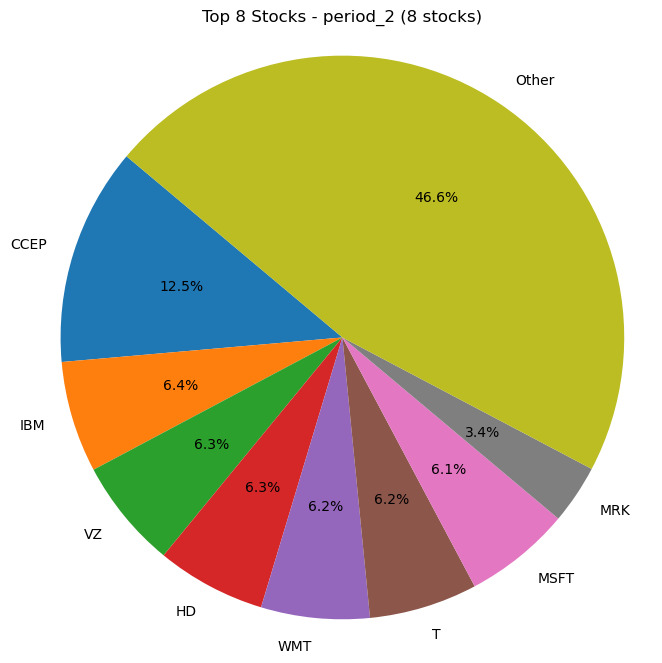

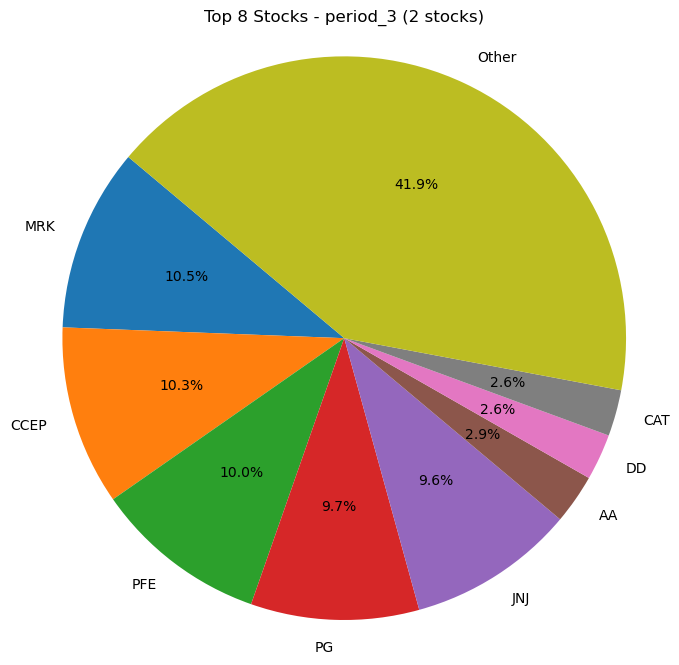

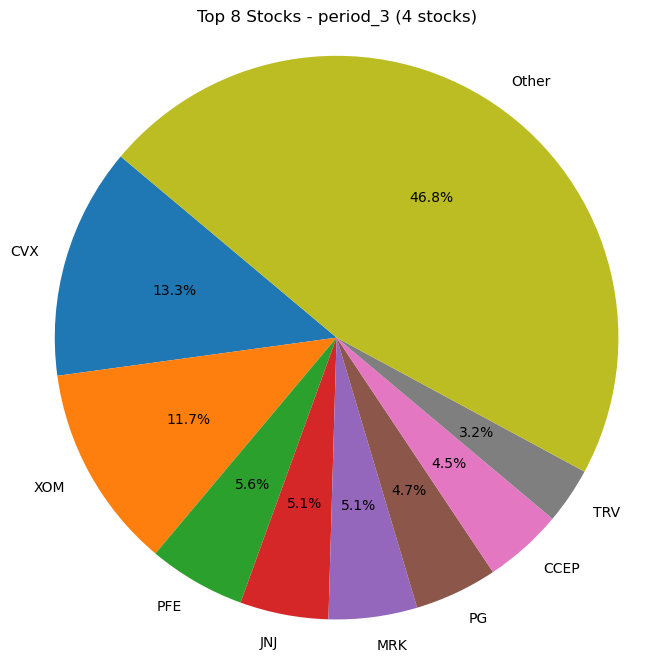

...

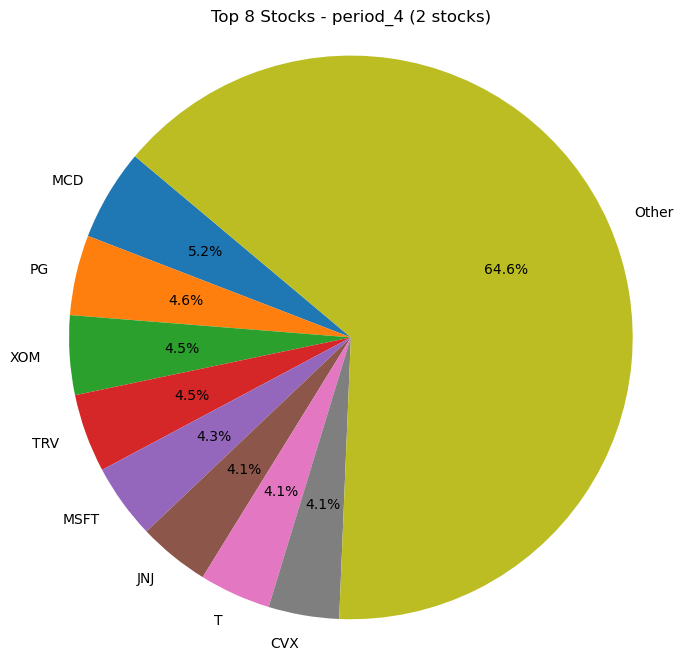

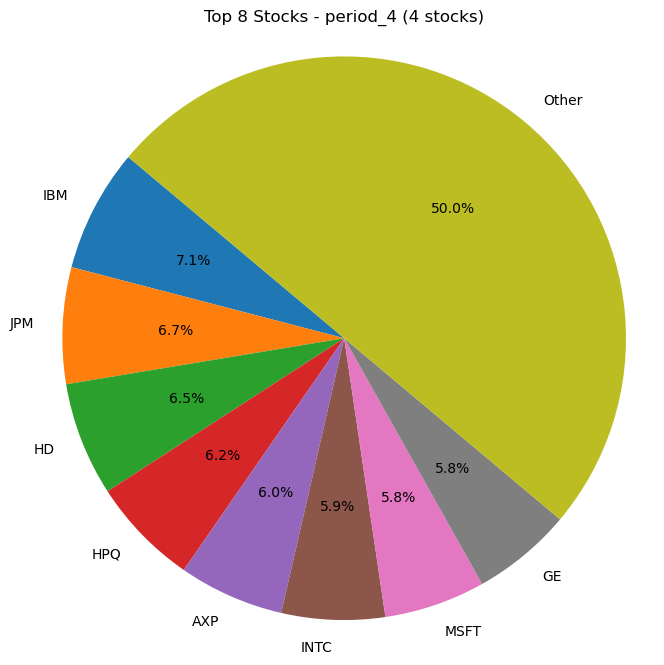

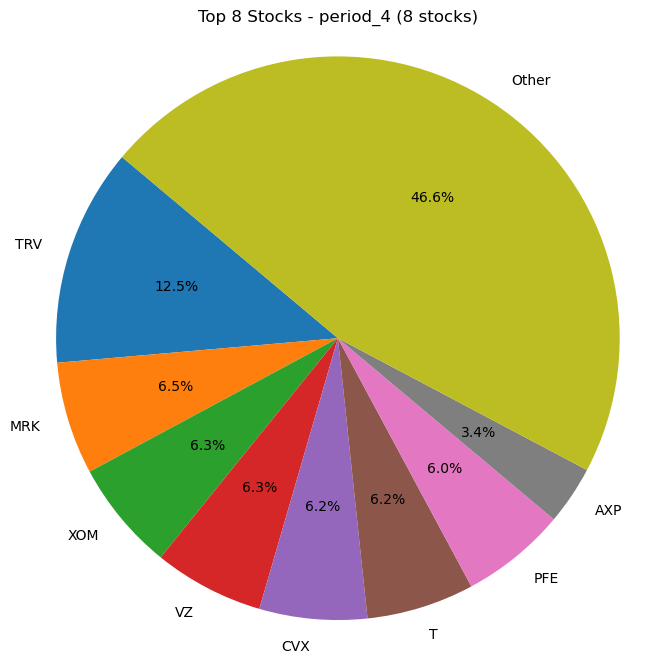

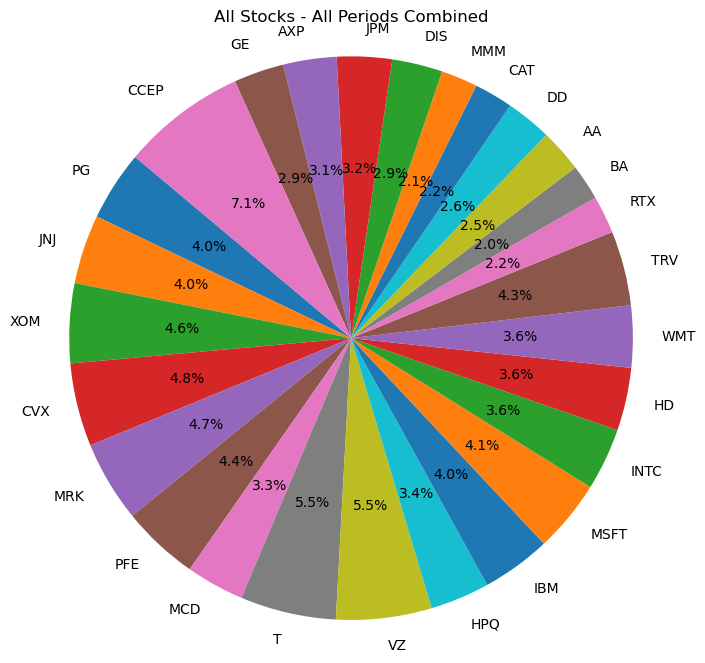

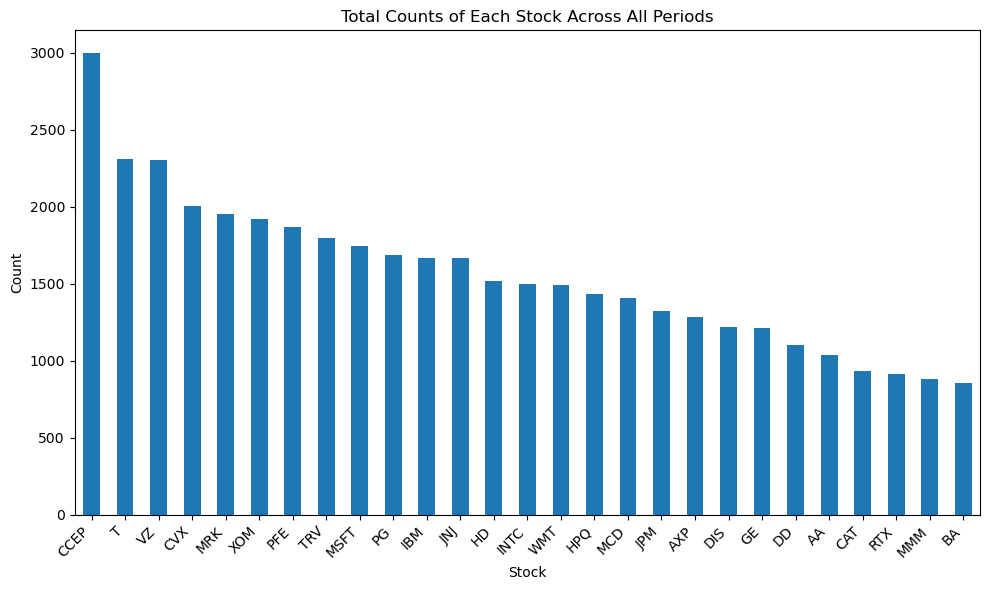

In [ ]:
count_of_stocks(result_df_kmeans_rand_test1)

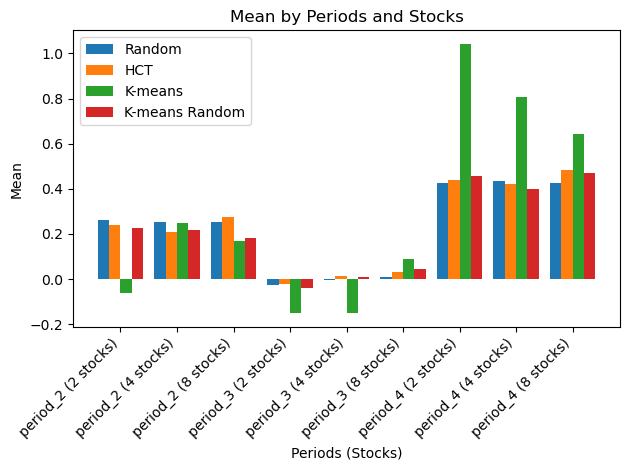

Total Average Mean of Random Values: 0.2252401875903115
Total Average Mean of Cluster Values: 0.23181291092756634
Total Average Mean of K-means Values: 0.2926489542719529
Total Average Mean of K-means Random Values: 0.2180510566666291

Period 1 Average Mean of Random Values: 0.2555143274271717
Period 1 Average Mean of Cluster Values: 0.24068516564143153
Period 1 Average Mean of K-means Values: 0.11793817789582188
Period 1 Average Mean of K-means Random Values: 0.20821337382229713
Period 2 Average Mean of Random Values: -0.007635374110515787
Period 2 Average Mean of Cluster Values: 0.0076734569713348385
Period 2 Average Mean of K-means Values: -0.07062491651807239
Period 2 Average Mean of K-means Random Values: 0.004154746125127259
Period 3 Average Mean of Random Values: 0.4278416094542787
Period 3 Average Mean of Cluster Values: 0.4470801101699327
Period 3 Average Mean of K-means Values: 0.8306336014381093
Period 3 Average Mean of K-means Random Values: 0.44178505005246294


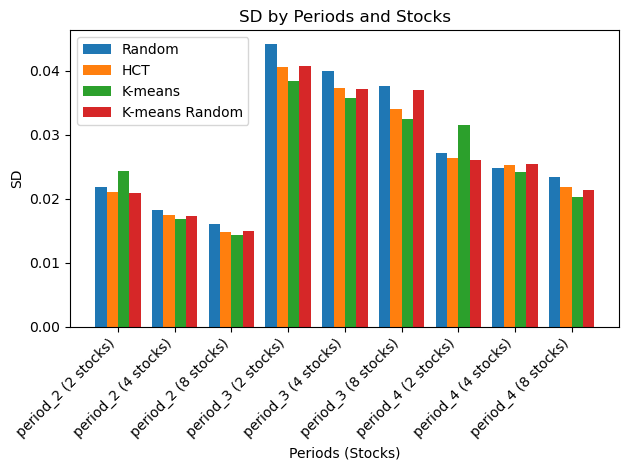

Total Average SD of Random Values: 0.028167210029143908
Total Average SD of Cluster Values: 0.026526530536430257
Total Average SD of K-means Values: 0.026459670122485436
Total Average SD of K-means Random Values: 0.02676328331729237

Period 1 Average SD of Random Values: 0.018714808027296543
Period 1 Average SD of Cluster Values: 0.017792546731641184
Period 1 Average SD of K-means Values: 0.01855469805148161
Period 1 Average SD of K-means Random Values: 0.017709704585054414
Period 2 Average SD of Random Values: 0.040592854586773176
Period 2 Average SD of Cluster Values: 0.037304952300862865
Period 2 Average SD of K-means Values: 0.03549403497453357
Period 2 Average SD of K-means Random Values: 0.03831112404947499
Period 3 Average SD of Random Values: 0.02519396747336201
Period 3 Average SD of Cluster Values: 0.024482092576786723
Period 3 Average SD of K-means Values: 0.025330277341441124
Period 3 Average SD of K-means Random Values: 0.024269021317347702


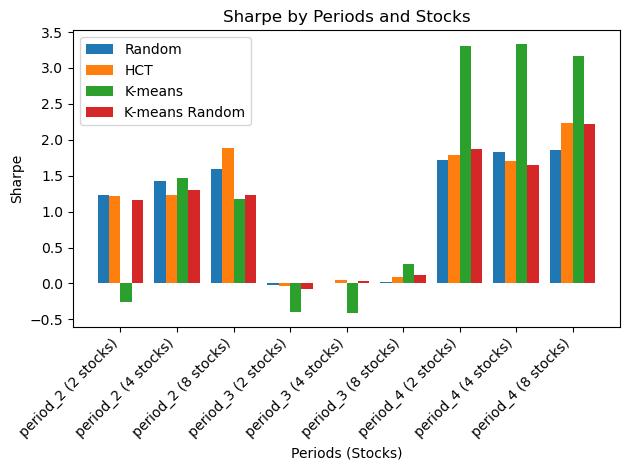

Total Average Sharpe of Random Values: 1.0745572845746905
Total Average Sharpe of Cluster Values: 1.1283155921534915
Total Average Sharpe of K-means Values: 1.294841795601902
Total Average Sharpe of K-means Random Values: 1.0566927023920796

Period 1 Average Sharpe of Random Values: 1.4178500467104878
Period 1 Average Sharpe of Cluster Values: 1.4403322448129912
Period 1 Average Sharpe of K-means Values: 0.7940217455068233
Period 1 Average Sharpe of K-means Random Values: 1.2312932774394096
Period 2 Average Sharpe of Random Values: 0.002141308110462066
Period 2 Average Sharpe of Cluster Values: 0.036980938936029197
Period 2 Average Sharpe of K-means Values: -0.1795400740314477
Period 2 Average Sharpe of K-means Random Values: 0.02694921346383623
Period 3 Average Sharpe of Random Values: 1.8036804989031212
Period 3 Average Sharpe of Cluster Values: 1.9076335927114538
Period 3 Average Sharpe of K-means Values: 3.270043715330331
Period 3 Average Sharpe of K-means Random Values: 1.91183561

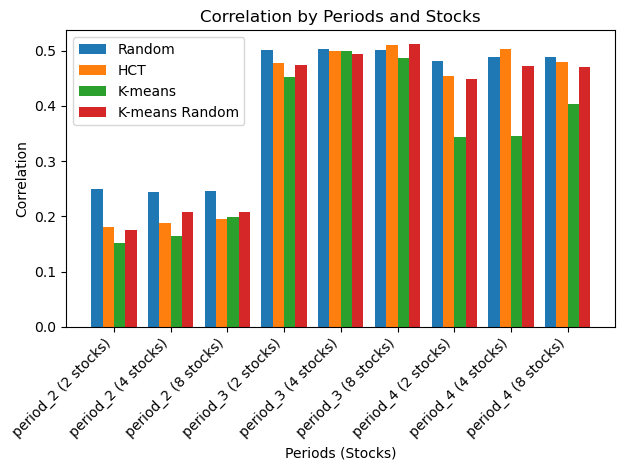

Total Average Correlation of Random Values: 0.4112938875868671
Total Average Correlation of Cluster Values: 0.387221351274237
Total Average Correlation of K-means Values: 0.3381464119004986
Total Average Correlation of K-means Random Values: 0.38442022080700683

Period 1 Average Correlation of Random Values: 0.24620823843943473
Period 1 Average Correlation of Cluster Values: 0.18756998919866605
Period 1 Average Correlation of K-means Values: 0.17144526439917826
Period 1 Average Correlation of K-means Random Values: 0.19699089691449934
Period 2 Average Correlation of Random Values: 0.5016386303928079
Period 2 Average Correlation of Cluster Values: 0.4952997581886618
Period 2 Average Correlation of K-means Values: 0.47881343253680814
Period 2 Average Correlation of K-means Random Values: 0.4929382883486803
Period 3 Average Correlation of Random Values: 0.48603479392835874
Period 3 Average Correlation of Cluster Values: 0.4787943064353833
Period 3 Average Correlation of K-means Values: 0.

In [ ]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

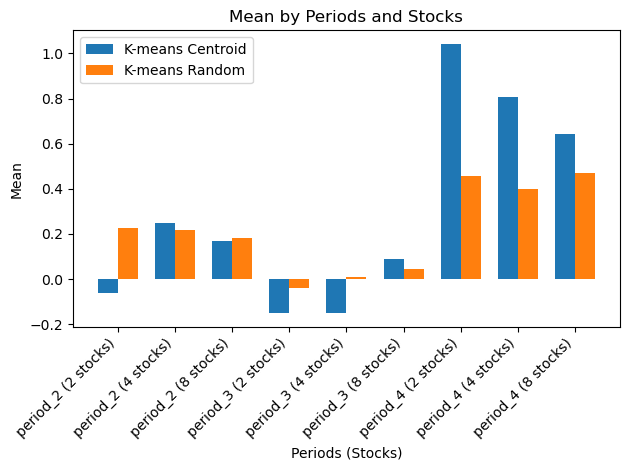

Total Average Mean of K-means Centroid Values: 0.2926489542719529
Total Average Mean of K-means Random Values: 0.2180510566666291

Period 1 Average Mean of K-means Centroid Values: 0.11793817789582188
Period 1 Average Mean of K-means Random Values: 0.20821337382229713
Period 2 Average Mean of K-means Centroid Values: -0.07062491651807239
Period 2 Average Mean of K-means Random Values: 0.004154746125127259
Period 3 Average Mean of K-means Centroid Values: 0.8306336014381093
Period 3 Average Mean of K-means Random Values: 0.44178505005246294


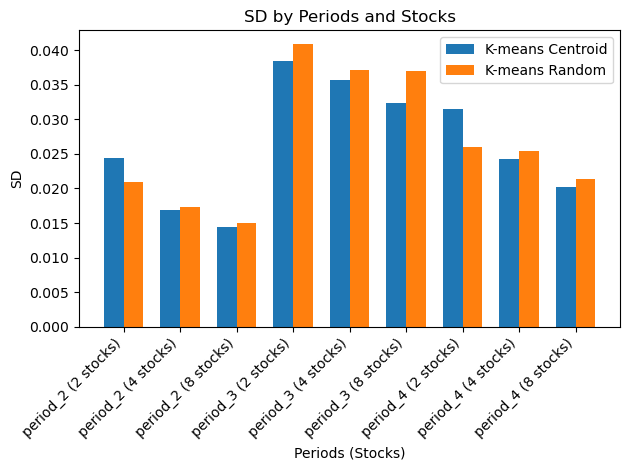

Total Average SD of K-means Centroid Values: 0.026459670122485436
Total Average SD of K-means Random Values: 0.02676328331729237

Period 1 Average SD of K-means Centroid Values: 0.01855469805148161
Period 1 Average SD of K-means Random Values: 0.017709704585054414
Period 2 Average SD of K-means Centroid Values: 0.03549403497453357
Period 2 Average SD of K-means Random Values: 0.03831112404947499
Period 3 Average SD of K-means Centroid Values: 0.025330277341441124
Period 3 Average SD of K-means Random Values: 0.024269021317347702


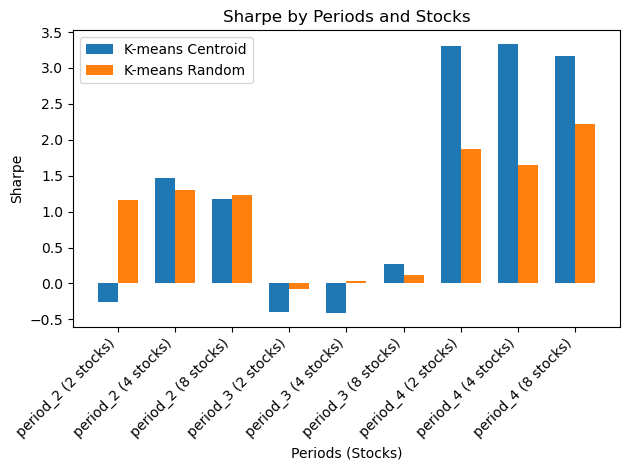

Total Average Sharpe of K-means Centroid Values: 1.294841795601902
Total Average Sharpe of K-means Random Values: 1.0566927023920796

Period 1 Average Sharpe of K-means Centroid Values: 0.7940217455068233
Period 1 Average Sharpe of K-means Random Values: 1.2312932774394096
Period 2 Average Sharpe of K-means Centroid Values: -0.1795400740314477
Period 2 Average Sharpe of K-means Random Values: 0.02694921346383623
Period 3 Average Sharpe of K-means Centroid Values: 3.270043715330331
Period 3 Average Sharpe of K-means Random Values: 1.9118356162729926


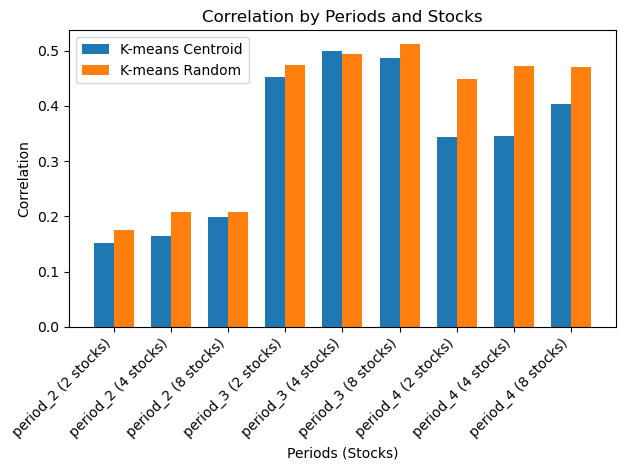

Total Average Correlation of K-means Centroid Values: 0.3381464119004986
Total Average Correlation of K-means Random Values: 0.38442022080700683

Period 1 Average Correlation of K-means Centroid Values: 0.17144526439917826
Period 1 Average Correlation of K-means Random Values: 0.19699089691449934
Period 2 Average Correlation of K-means Centroid Values: 0.47881343253680814
Period 2 Average Correlation of K-means Random Values: 0.4929382883486803
Period 3 Average Correlation of K-means Centroid Values: 0.36418053876550927
Period 3 Average Correlation of K-means Random Values: 0.46333147715784073


In [ ]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)